In [1]:
# reload packages
%load_ext autoreload
%autoreload 2`

### Choose GPU

In [2]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=0


In [3]:
import tensorflow as tf
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
if len(gpu_devices)>0:
    tf.config.experimental.set_memory_growth(gpu_devices[0], True)
print(gpu_devices)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
tf.keras.backend.clear_session()

### dataset information

In [5]:
from datetime import datetime

dataset = "mnist"
dims = (28, 28, 1)
umap_prop = 1.0
num_classes = 10
PROJECTION_DIMS = 1024
labels_per_class = 64  # 'full'
datestring = datetime.now().strftime("%Y_%m_%d_%H_%M_%S_%f")
datestring = (
    str(dataset)
    + "_"
    + str(umap_prop)
    + "_"
    + str(PROJECTION_DIMS)
    + "_"
    + str(labels_per_class)
    + "____"
    + datestring
    + '__linear-umap-euclidean'
)
print(datestring)

mnist_1.0_1024_64____2020_08_07_23_09_37_975360__linear-umap-euclidean


### Load packages

In [6]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm
from IPython import display
import pandas as pd
import umap
import copy
import os, tempfile

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


### Load dataset

In [7]:
from tfumap.load_datasets import load_MNIST, mask_labels

In [8]:
X_train, X_test, X_valid, Y_train, Y_test, Y_valid = load_MNIST(flatten=False)
X_train.shape

(50000, 28, 28, 1)

In [9]:
if labels_per_class == "full":
    X_labeled = X_train
    Y_masked = Y_labeled = Y_train
else:
    X_labeled, Y_labeled, Y_masked = mask_labels(
        X_train, Y_train, labels_per_class=labels_per_class
    )

### Build umap graph

In [10]:
from tfumap.semisupervised import build_fuzzy_simplicial_set

In [11]:
n_neighbors = 15  # default = 15
umap_graph = build_fuzzy_simplicial_set(
    X_train.reshape((len(X_train), np.product(np.shape(X_train)[1:]))),
    y=Y_masked,
    n_neighbors=n_neighbors,
)

### Build data iterators

In [12]:
from tfumap.umap import compute_cross_entropy, get_graph_elements
from tfumap.semisupervised import create_edge_iterator, create_validation_iterator, create_classification_iterator

In [13]:
n_epochs = 200
graph, epochs_per_sample, head, tail, weight, n_vertices = get_graph_elements(
            umap_graph, n_epochs
)
batch_size = np.min([n_vertices, 1000])
batch_size

1000

In [14]:
# make sure batch size is no bigger than the number of labels per class
labeled_batch_size = batch_size if batch_size < len(Y_labeled) else len(Y_labeled)
labeled_iter = create_classification_iterator(X_labeled, Y_labeled, batch_size=batch_size)
print(labeled_batch_size)

640


In [15]:
max_sample_repeats_per_epoch = 25
edge_iter, n_edges_per_epoch = create_edge_iterator(
    head,
    tail,
    weight,
    batch_size=batch_size,
    max_sample_repeats_per_epoch=max_sample_repeats_per_epoch,
)

In [16]:
data_valid, n_valid_samp = create_validation_iterator(X_valid, Y_valid, batch_size, repeat=True)

### Build network

In [17]:
encoder = tf.keras.Sequential()
encoder.add(tf.keras.layers.InputLayer(input_shape=dims))
encoder.add(tf.keras.layers.Conv2D(
    filters=32, kernel_size=3, strides=1, padding="same", activation="relu"
))
encoder.add(tf.keras.layers.Conv2D(
    filters=64, kernel_size=3, strides=1, padding="same", activation="relu"
))
encoder.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))
encoder.add(tf.keras.layers.Dropout(0.25))
encoder.add(tf.keras.layers.Flatten())
encoder.add(tf.keras.layers.Dense(units=128, activation="relu"))
encoder.add(tf.keras.layers.Dropout(0.25))

In [18]:
classifier = tf.keras.Sequential()
classifier.add(tf.keras.layers.InputLayer(input_shape=128))
classifier.add(tf.keras.layers.Dense(units=128, activation="relu"))
classifier.add(tf.keras.layers.Dense(units=128, activation="relu"))
classifier.add(tf.keras.layers.Dense(num_classes, activation='softmax', name="predictions"))

In [19]:
encoder.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 28, 28, 32)        320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 28, 28, 64)        18496     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 14, 14, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 12544)             0         
_________________________________________________________________
dense (Dense)                (None, 128)               1605760   
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0

### Create UMAP object

In [20]:
from tfumap.semisupervised_model import PUMAP, compute_classifier_loss

In [21]:
def compute_umap_loss(
    batch_to,
    batch_from,
    encoder,
    _a,
    _b,
    negative_sample_rate=5,
    repulsion_strength=1,
):
    """
        compute the cross entropy loss for learning embeddings

        Parameters
        ----------
        batch_to : tf.int or tf.float32
            Either X or the index locations of the embeddings for verticies (to)
        batch_from : tf.int or tf.float32
            Either X or the index locations of the embeddings for verticies (from)

        Returns
        -------
        ce_loss : tf.float
            cross entropy loss for UMAP
        embedding_to : tf.float
            embeddings for verticies (to)
        embedding_from : tf.float
            embeddings for verticies (from)
        """

    # encode
    embedding_to = encoder(batch_to)
    embedding_from = encoder(batch_from)

    # get negative samples
    embedding_neg_to = tf.repeat(embedding_to, negative_sample_rate, axis=0)
    repeat_neg = tf.repeat(embedding_from, negative_sample_rate, axis=0)
    embedding_neg_from = tf.gather(
        repeat_neg, tf.random.shuffle(tf.range(tf.shape(repeat_neg)[0]))
    )

    #  distances between samples
    distance_embedding = tf.concat(
        [
            tf.norm(embedding_to - embedding_from, axis=1),
            tf.norm(embedding_neg_to - embedding_neg_from, axis=1),
        ],
        axis=0,
    )

    # convert probabilities to distances
    probabilities_distance = convert_distance_to_probability(distance_embedding, _a, _b)

    # treat positive samples as p=1, and negative samples as p=0
    probabilities_graph = tf.concat(
        [tf.ones(embedding_to.shape[0]), tf.zeros(embedding_neg_to.shape[0])], axis=0,
    )

    # cross entropy loss
    (attraction_loss, repellant_loss, ce_loss) = compute_cross_entropy(
        probabilities_graph,
        probabilities_distance,
        repulsion_strength=repulsion_strength,
    )

    return (
        attraction_loss,
        repellant_loss,
        ce_loss,
    )


In [22]:
import tensorflow as tf
from tfumap.umap import compute_cross_entropy, convert_distance_to_probability
from tfumap.semisupervised import (
    find_a_b,
    #compute_umap_loss,
    # compute_classifier_loss,
    batch_data,
)
import numpy as np
import os, tempfile
from tqdm.autonotebook import tqdm
from datetime import datetime


@tf.function
def compute_classifier_loss(X, y, encoder, classifier, sparse_ce, acc_func):
    """ compute the cross entropy loss for classification
        """
    d = classifier(encoder(X))
    loss = sparse_ce(y, d)
    acc = acc_func(y, d)
    #acc = tf.keras.metrics.sparse_categorical_accuracy(y, d)
    return loss, acc


class PUMAP(tf.keras.Model):
    def __init__(
        self,
        encoder,
        classifier,
        tensorboard_logdir=None,  # directory for tensorboard log
        min_dist=0.1,
        negative_sample_rate=5.0,
        optimizer=tf.keras.optimizers.SGD(0.1),
        repulsion_strength=1.0,
        # ** kwargs,
    ):
        super(PUMAP, self).__init__()
        # self.__dict__.update(kwargs)

        # subnetworks
        self.encoder = encoder
        self.classifier = classifier


        # optimizer for cross entropy minimization
        self.optimizer = optimizer
        self.repulsion_strength = repulsion_strength
        self.negative_sample_rate = negative_sample_rate

        # get a,b for current min_dist
        self._a, self._b = find_a_b(min_dist)

        # create summary writer to log loss information during training
        if tensorboard_logdir is None:
            self.tensorboard_logdir = os.path.join(
                tempfile.gettempdir(),
                "tensorboard",
                datetime.now().strftime("%Y%m%d-%H%M%S"),
            )
        else:
            self.tensorboard_logdir = tensorboard_logdir
        self.summary_writer_train = tf.summary.create_file_writer(
            self.tensorboard_logdir + "/train"
        )
        self.summary_writer_valid = tf.summary.create_file_writer(
            self.tensorboard_logdir + "/valid"
        )

        # sparse categorical cross entropy
        self.sparse_ce = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        self.class_acc = tf.keras.metrics.SparseCategoricalAccuracy()
        self.class_acc_val = tf.keras.metrics.SparseCategoricalAccuracy()

        # self.create_summary_metrics()

    @tf.function
    def train(self, batch_to, batch_from, X, y, umap_prop = 1.0, save_loss=False):
        """ One training step 
        Input are points and weights for positive and negative 
        samples for training. 
            
        """
        if umap_prop > 0:
            with tf.GradientTape() as tape:

                (attraction_loss, repellant_loss, umap_loss) = compute_umap_loss(
                    batch_to,
                    batch_from,
                    self.encoder,
                    self._a,
                    self._b,
                    self.negative_sample_rate,
                    self.repulsion_strength,
                )
            
                classifier_loss, classifier_acc = compute_classifier_loss(
                    X, y, self.encoder, self.classifier, self.sparse_ce, self.class_acc
                )
                loss = (
                    tf.reduce_mean(classifier_loss)
                    + tf.reduce_mean(umap_loss) * umap_prop
                )

            train_vars = (
                self.encoder.trainable_variables
                + self.classifier.trainable_variables
            )
        else:  # ignore running costly UMAP computations if not training on UMAP loss
            with tf.GradientTape() as tape:
                classifier_loss, classifier_acc = compute_classifier_loss(
                    X, y, self.encoder, self.classifier, self.sparse_ce, self.class_acc
                )
                loss = classifier_loss
            train_vars = (
                self.encoder.trainable_variables + self.classifier.trainable_variables
            )
            attraction_loss = repellant_loss = umap_loss = 0

        # compute gradient for umap
        grad = tape.gradient(loss, train_vars)

        # gradients are cliped in UMAP implementation. Any effect here?
        grad = [tf.clip_by_value(grad, -4.0, 4.0) for grad in grad]

        self.optimizer.apply_gradients(zip(grad, train_vars))

        return (
            attraction_loss,
            repellant_loss,
            tf.reduce_mean(umap_loss),
            classifier_loss,
            classifier_acc,
        )

    @tf.function
    def write_losses(
        self,
        step,
        classifier_acc,
        classifier_loss,
        umap_loss,
        classifier_loss_val,
        classifier_acc_val,
    ):
        # write train loss
        with self.summary_writer_train.as_default():
            tf.summary.scalar(
                "classif_acc", classifier_acc, step=step,
            )
            tf.summary.scalar(
                "classif_loss", classifier_loss, step=step,
            )
            tf.summary.scalar(
                "umap_loss", umap_loss, step=step,
            )
            self.summary_writer_train.flush()
        # write valid loss
        with self.summary_writer_valid.as_default():
            tf.summary.scalar(
                "classif_acc", classifier_acc_val, step=step,
            )
            tf.summary.scalar(
                "classif_loss", classifier_loss_val, step=step,
            )
            self.summary_writer_valid.flush()



In [23]:
### Initialize model
model = PUMAP(
    min_dist = 0.0,
    negative_sample_rate = 5, # how many negative samples per positive
    optimizer=tf.keras.optimizers.Adam(1e-3), # cross-entropy optimizer
    encoder=encoder,
    classifier=classifier,    
)

### plotting results

In [24]:
def model_data(X, batch_size, model):
    """ embed a set of points in X to Z
    """
    n_batch = int(np.ceil(len(X) / batch_size))
    return np.vstack(
        [
                model(np.array(X[(i) * batch_size : (i + 1) * batch_size, :]))
            for i in tqdm(range(n_batch), leave=False)
        ]
    )

In [25]:
from tfumap.umap import retrieve_tensors
from sklearn.decomposition import PCA
import seaborn as sns
from umap import UMAP 

def plot_umap_classif_results(
    model,
    X_valid,
    Y_valid,
    X_train,
    X_labeled,
    Y_labeled,
    batch_size,
    dralg = PCA, #umap
    cmap="coolwarm",
    cmap2="bwr",
):
    # get loss dataframe from tensorboard
    try:
        loss_df = retrieve_tensors(model.tensorboard_logdir)
        losses_exist = True
    except ValueError as e:
        print(e)
        losses_exist = False

    pred_model = tf.keras.models.Model(model.classifier.input,[model.classifier.get_layer(name="dense_1").get_output_at(0)])

    # embed data
    enc_valid = model_data(X_valid, batch_size, model.encoder)
    class_valid = model_data(enc_valid, batch_size, pred_model)
    pred_valid = model_data(enc_valid, batch_size, model.classifier)

    enc_lab = model_data(X_labeled, batch_size, model.encoder)
    class_lab = model_data(enc_lab, batch_size, pred_model)
    pred_lab = model_data(enc_lab, batch_size, model.classifier)

    # get classifications and correctness
    classifications_valid = np.argmax(pred_valid, axis=1)
    correctness_valid = classifications_valid == Y_valid

    classifications_lab = np.argmax(pred_lab, axis=1)
    correctness_lab = classifications_lab == np.array(Y_labeled)

    confidence_lab  = np.max(pred_lab, axis=1)
    confidence_valid = np.max(pred_valid, axis=1)

    thresh = 0.0 #0.8
    mask_valid = confidence_valid > thresh
    mask_lab = confidence_lab > thresh

    # embed into 2D 
    dr = dralg()
    enc_valid_2 = dr.fit_transform(enc_valid[mask_valid])
    enc_lab_2 = dr.transform(enc_lab[mask_lab])



    dr = dralg()
    class_valid_2 = dr.fit_transform(class_valid[mask_valid])
    class_lab_2 = dr.transform(class_lab[mask_lab])
    
    fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(14, 6), gridspec_kw = {'wspace':0, 'hspace':0})
    for row, (z_val, z_lab, z_title) in enumerate([
        [enc_valid_2, enc_lab_2, 'encoder'], 
        [class_valid_2, class_lab_2, 'last_layer_classifier'], 

    ]):
        for col, (y_valid, y_labeled, label_name) in enumerate([
            [Y_valid, Y_labeled, 'ground_truth'],
            [classifications_valid, classifications_lab, 'predictions'],
            [correctness_valid, correctness_lab, 'correctness'],
            [confidence_valid, confidence_lab, 'confidence'],
        ]):
            ax = axs[row, col]
            #ax.axis('off')
            if col == 0:
                ax.set_ylabel(z_title)
            if row == 0:
                ax.set_title(label_name)
            #ax.set_title(z_title + '_' + label_name)
            ax.scatter(
                z_val[:, 0],
                z_val[:, 1],
                c=y_valid[mask_valid],
                cmap=cmap if label_name not in ["correctness", "confidence"]  else 'viridis',  # "tab10"
                s=2,
                alpha=0.25,
                rasterized=True,
            )
            if False:
                ax.scatter(
                    z_lab[:, 0],
                    z_lab[:, 1],
                    c=y_labeled[mask_lab],
                    cmap=cmap if label_name not in ["correctness", "confidence"] else 'viridis',  # "tab10"
                    s=20,
                    alpha=0.25,
                    rasterized=True,
                )
            ax.set_xticks([])
            ax.set_yticks([])
        
    plt.show()
    
    fig, axs = plt.subplots(ncols=3, figsize=(14,2))
    if losses_exist:
        ax = axs[0]
        sns.lineplot(
            x="step",
            y="val",
            hue="group",
            data=loss_df[loss_df.variable == "umap_loss"],
            ci=None,
            legend=None,
            ax=ax,
        )
        ax.legend(loc="upper right")
        ax.set_xscale("log")
        ax.set_title("UMAP loss", fontsize=24)
        ax.set_ylabel("Cross Entropy")
        
        ax = axs[1]
        sns.lineplot(
            x="step",
            y="val",
            hue="group",
            data=loss_df[loss_df.variable == "classif_loss"],
            ci=None,
            legend=None,
            ax=ax,
        )
        ax.set_xscale("log")
        ax.legend(loc="upper right")
        # ax.set_yscale("log")
        ax.set_title("Classif loss", fontsize=24)
        ax.set_ylabel("Cross Entropy")
        
        ax = axs[2]
        sns.lineplot(
            x="step",
            y="val",
            hue="group",
            data=loss_df[loss_df.variable == "classif_acc"],
            ci=None,
            legend=None,
            ax=ax,
        )
        ax.set_xscale("log")
        ax.legend(loc="lower right")
        ax.set_title("Classif acc", fontsize=24)
        ax.set_ylabel("Acc")
    plt.show()

No objects to concatenate


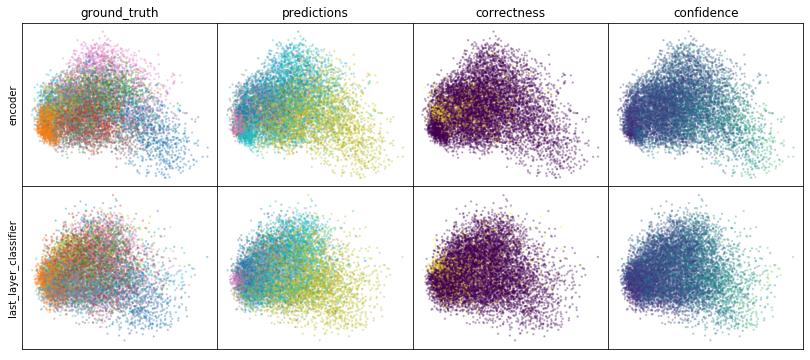

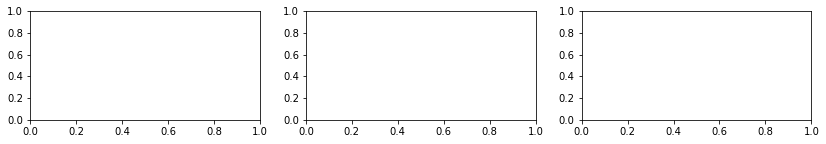

In [26]:
plot_umap_classif_results(model, X_valid, Y_valid, X_train, X_labeled, Y_labeled, batch_size, dralg=PCA, cmap='tab10', cmap2='tab10')

### Train model

In [27]:
N_EPOCHS = 50
n_neighbors=15
batch_size = 256 # 500
max_sample_repeats_per_epoch = 25
max_save_delta = 0.005

In [28]:
from tfumap.semisupervised import build_fuzzy_simplicial_set

In [29]:
from tfumap.paths import MODEL_DIR

In [30]:
# where to save checkpoints
cpt_path = MODEL_DIR / 'semisupervised' / dataset / datestring

In [31]:
BATCHES_PER_EPOCH = int(n_edges_per_epoch / batch_size)

In [32]:
patience = 10000 # wait this many batches without improvement before early stopping
min_delta = 0.0001 # threshold for what counts as an improvement
best_acc = 0 # the best current accuracy score
best_saved_acc = 0 # best accuracy on valid data that has been checkpointed
best_saved_batch = 0 # batch number for last good batch
max_reinitialize_delta = .01 # minimum loss in accuracy resulting in reinitialized weights
plot_frequency = 1000 # how frequently to plot
max_reloads = 10 # how often can we reload weights?
batch = 0; epoch = 0
batches_since_last_reload = 0

In [33]:
epochs_without_improvement = 0
max_epochs_without_improvement = 5 # allow the network 
reload_tolerance = 100 # allow the network at least reload_tolerance batches before reloading last weights

In [34]:
n_reloads = 0

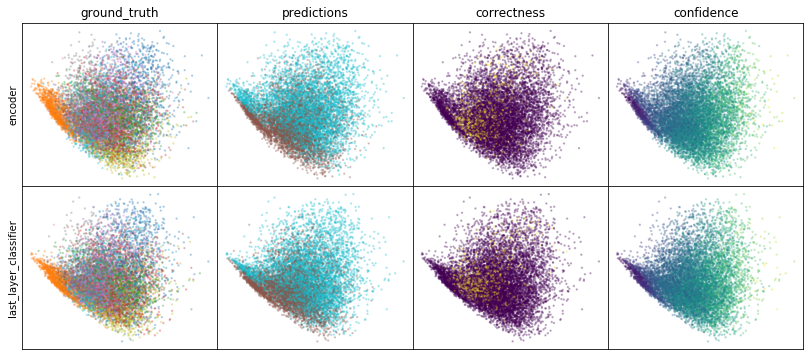

W0807 23:10:47.227121 139911865353984 legend.py:1282] No handles with labels found to put in legend.
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:118: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:132: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
W0807 23:10:47.286041 139911865353984 legend.py:1282] No handles with labels found to put in legend.
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:148: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
W0807 23:10:47.341430 139911865353984 legend.py:1282] No handles with labels found to put in legend.


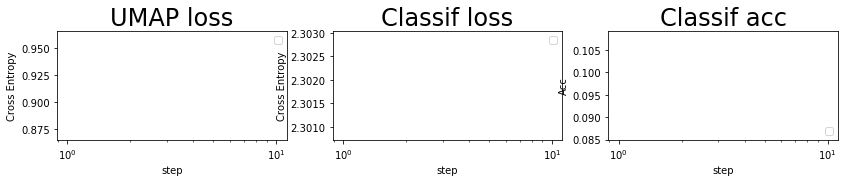

batch: 0 | train acc: 0.108 | val acc: 0.086
saving weights | batch = 100 | acc = 80.218
saving weights | batch = 104 | acc = 80.766
saving weights | batch = 108 | acc = 81.311
saving weights | batch = 113 | acc = 81.911
saving weights | batch = 118 | acc = 82.483
saving weights | batch = 123 | acc = 82.988
saving weights | batch = 129 | acc = 83.588
saving weights | batch = 136 | acc = 84.166
saving weights | batch = 143 | acc = 84.718
saving weights | batch = 150 | acc = 85.233
saving weights | batch = 158 | acc = 85.757
saving weights | batch = 167 | acc = 86.27
saving weights | batch = 177 | acc = 86.791
saving weights | batch = 188 | acc = 87.32
saving weights | batch = 201 | acc = 87.851
saving weights | batch = 216 | acc = 88.379
saving weights | batch = 232 | acc = 88.888
saving weights | batch = 251 | acc = 89.414
saving weights | batch = 273 | acc = 89.927
saving weights | batch = 298 | acc = 90.437
saving weights | batch = 328 | acc = 90.939
saving weights | batch = 364 | ac

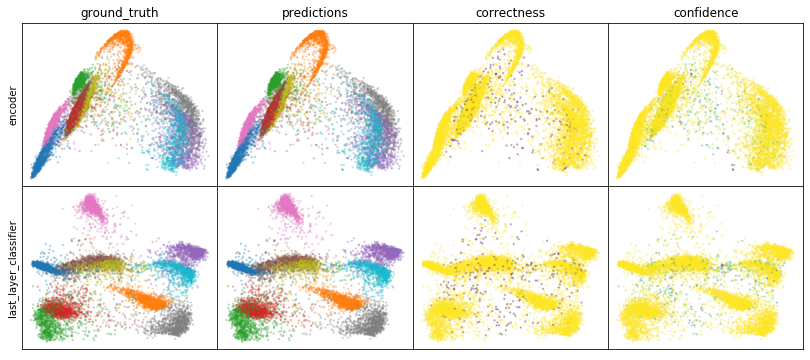

W0807 23:15:15.133936 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:15:15.195237 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:15:15.257088 139911865353984 legend.py:1282] No handles with labels found to put in legend.


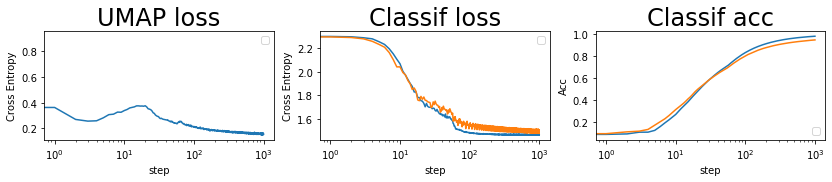

batch: 1000 | train acc: 0.9806 | val acc: 0.947
saving weights | batch = 1118 | acc = 94.954
saving weights | batch = 1455 | acc = 95.454


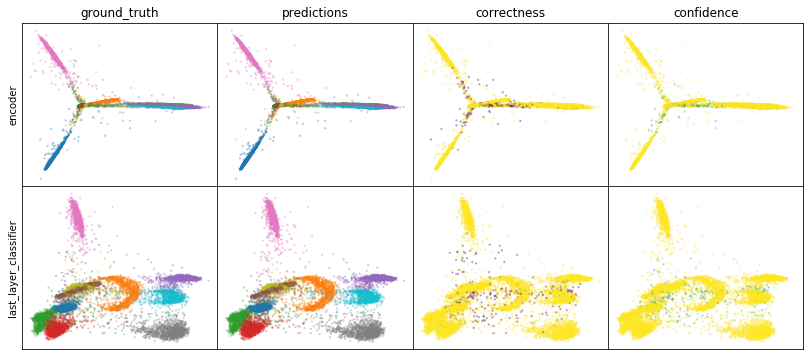

W0807 23:19:39.613536 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:19:39.675406 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:19:39.736223 139911865353984 legend.py:1282] No handles with labels found to put in legend.


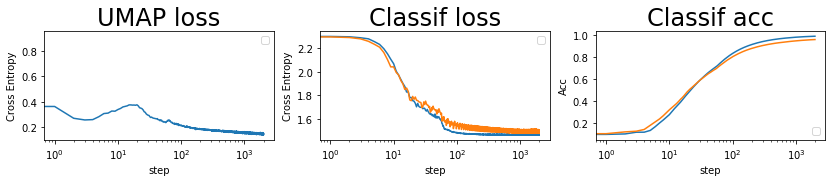

batch: 2000 | train acc: 0.9895 | val acc: 0.959
saving weights | batch = 2087 | acc = 95.954


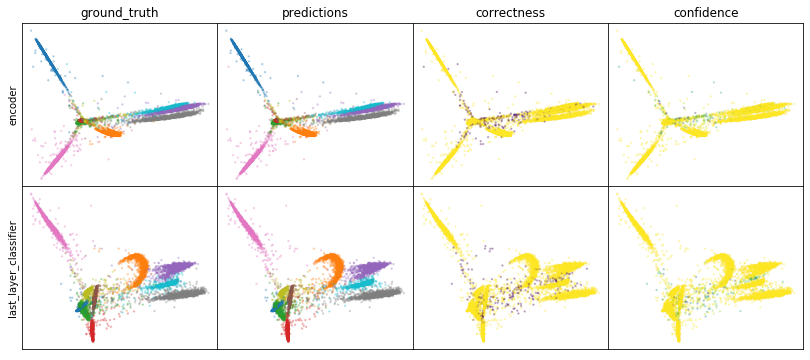

W0807 23:24:05.845048 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:24:05.915552 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:24:05.983350 139911865353984 legend.py:1282] No handles with labels found to put in legend.


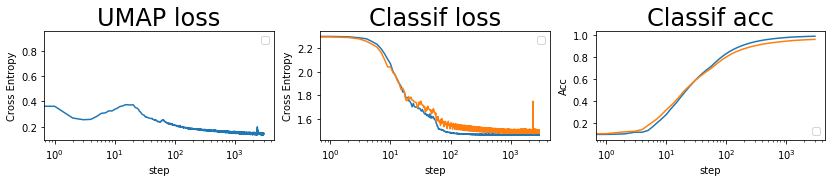

batch: 3000 | train acc: 0.9921 | val acc: 0.963
saving weights | batch = 3518 | acc = 96.455


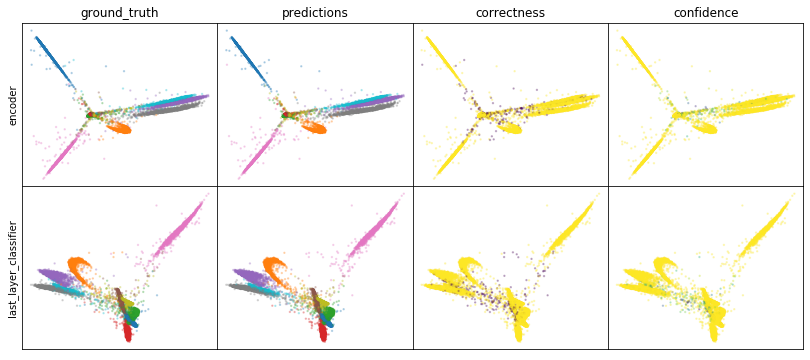

W0807 23:28:32.174373 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:28:32.242560 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:28:32.311283 139911865353984 legend.py:1282] No handles with labels found to put in legend.


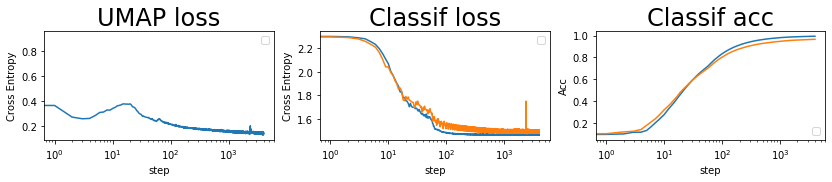

batch: 4000 | train acc: 0.9937 | val acc: 0.9656


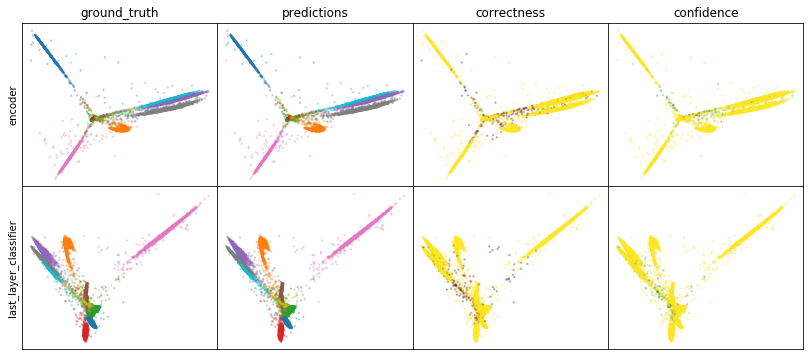

W0807 23:32:58.760617 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:32:58.835423 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:32:58.907823 139911865353984 legend.py:1282] No handles with labels found to put in legend.


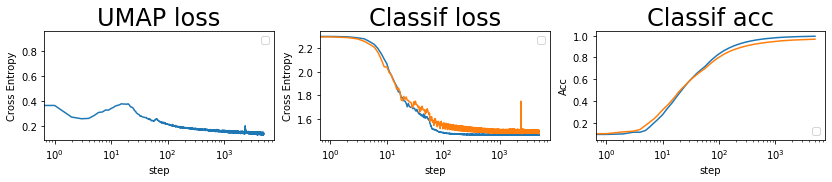

batch: 5000 | train acc: 0.9947 | val acc: 0.9673


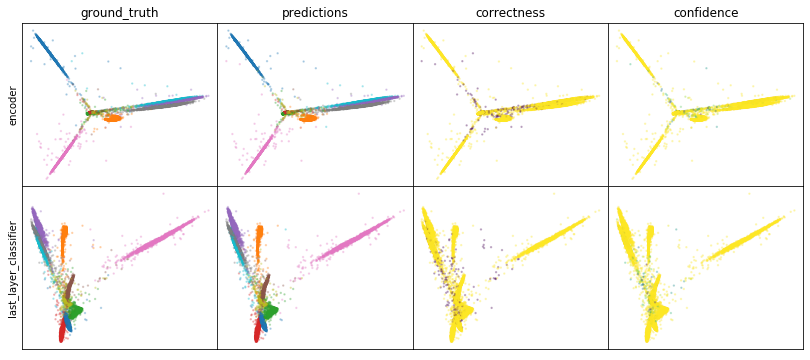

W0807 23:37:24.926333 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:37:25.000146 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:37:25.072005 139911865353984 legend.py:1282] No handles with labels found to put in legend.


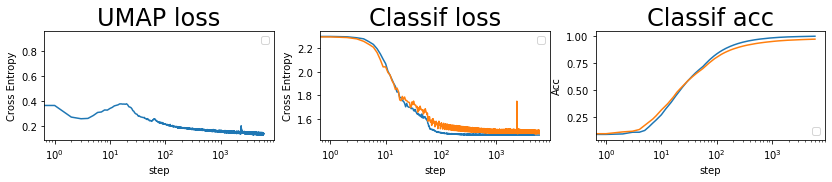

batch: 6000 | train acc: 0.9956 | val acc: 0.9686


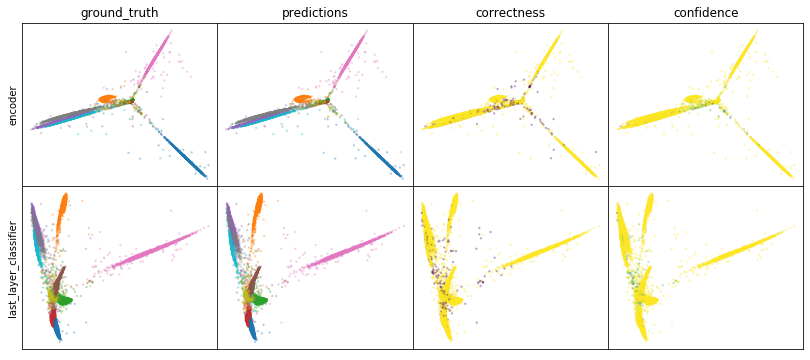

W0807 23:41:52.670484 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:41:52.745421 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:41:52.817517 139911865353984 legend.py:1282] No handles with labels found to put in legend.


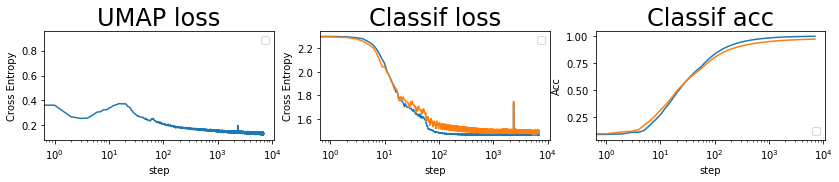

batch: 7000 | train acc: 0.9962 | val acc: 0.9695
saving weights | batch = 7119 | acc = 96.955


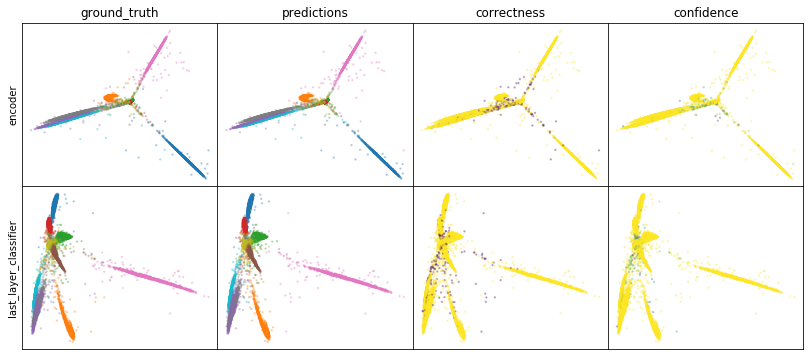

W0807 23:46:21.309907 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:46:21.386116 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:46:21.462932 139911865353984 legend.py:1282] No handles with labels found to put in legend.


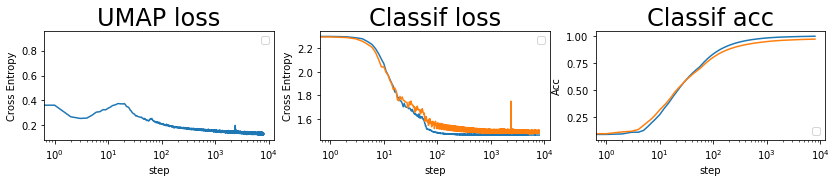

batch: 8000 | train acc: 0.9967 | val acc: 0.9701


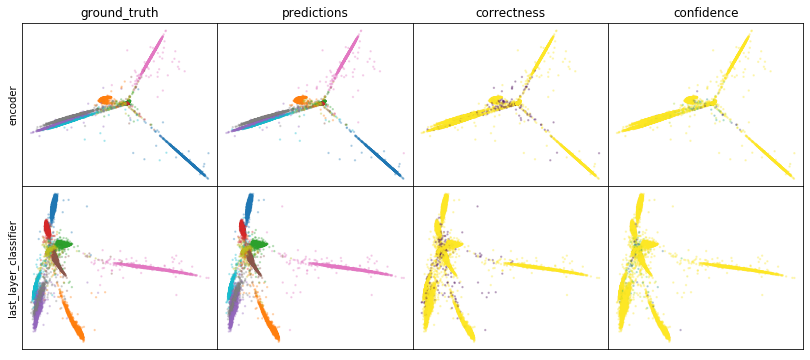

W0807 23:50:50.252617 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:50:50.335413 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:50:50.418340 139911865353984 legend.py:1282] No handles with labels found to put in legend.


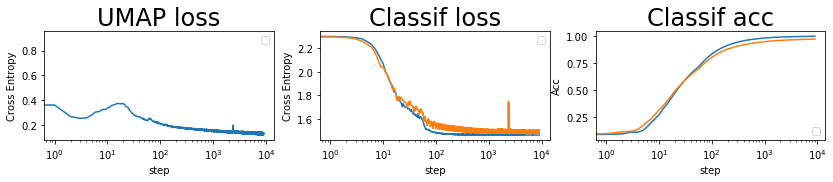

batch: 9000 | train acc: 0.997 | val acc: 0.9706


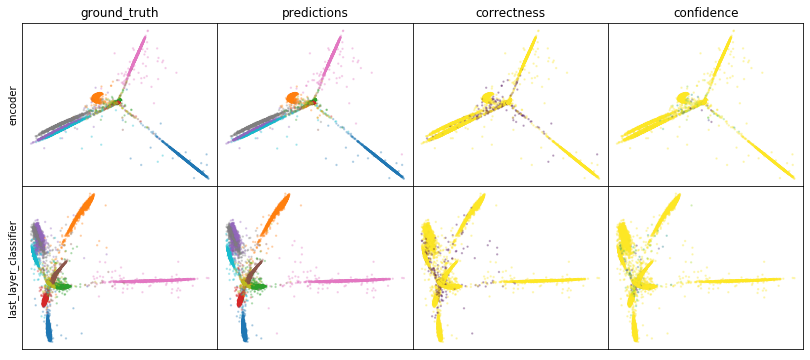

W0807 23:55:18.680477 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:55:18.764605 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:55:18.847413 139911865353984 legend.py:1282] No handles with labels found to put in legend.


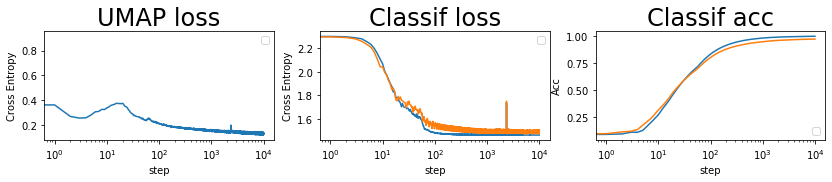

batch: 10000 | train acc: 0.9973 | val acc: 0.9709


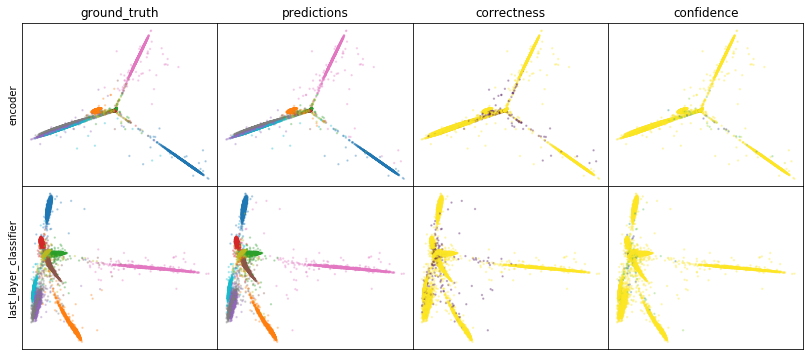

W0807 23:59:47.877907 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:59:47.964258 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0807 23:59:48.047761 139911865353984 legend.py:1282] No handles with labels found to put in legend.


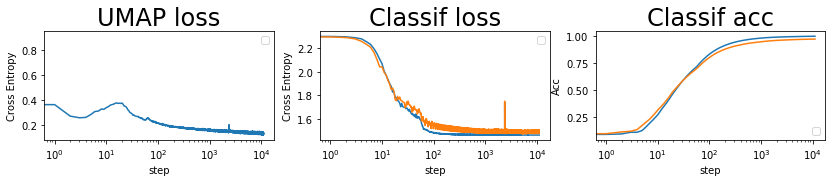

batch: 11000 | train acc: 0.9976 | val acc: 0.9712


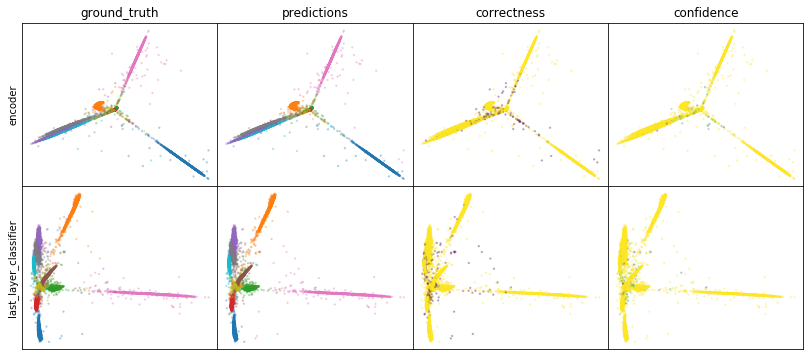

W0808 00:04:17.950225 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:04:18.057430 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:04:18.144822 139911865353984 legend.py:1282] No handles with labels found to put in legend.


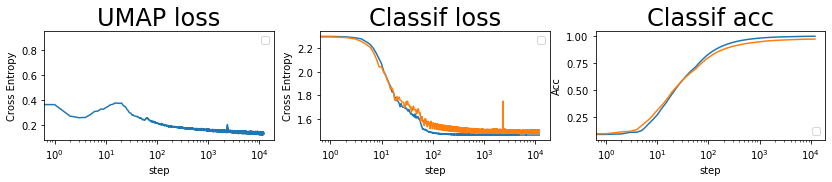

batch: 12000 | train acc: 0.9978 | val acc: 0.9713


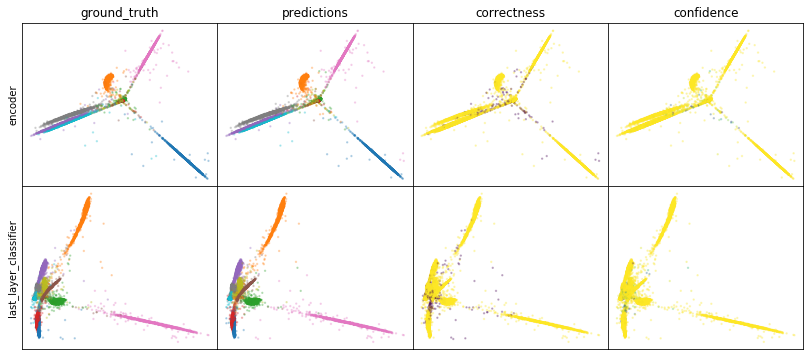

W0808 00:08:48.101374 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:08:48.194197 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:08:48.285861 139911865353984 legend.py:1282] No handles with labels found to put in legend.


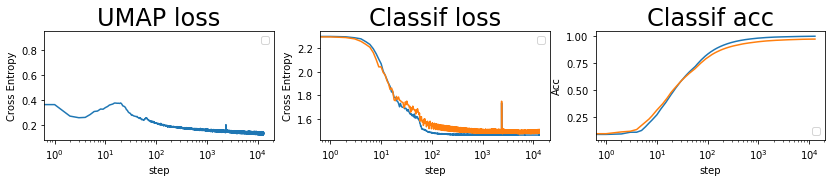

batch: 13000 | train acc: 0.998 | val acc: 0.9715


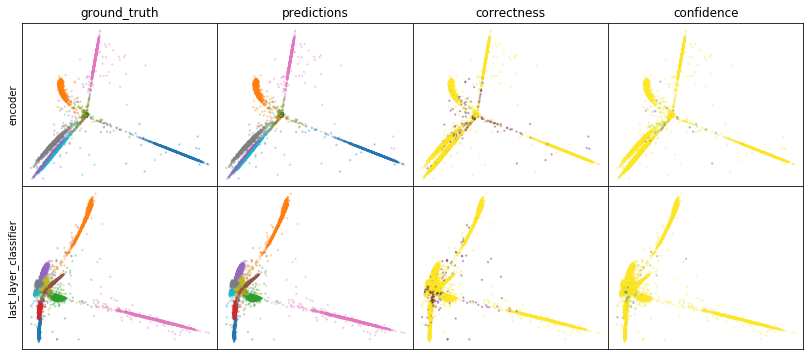

W0808 00:13:18.326664 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:13:18.424214 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:13:18.519901 139911865353984 legend.py:1282] No handles with labels found to put in legend.


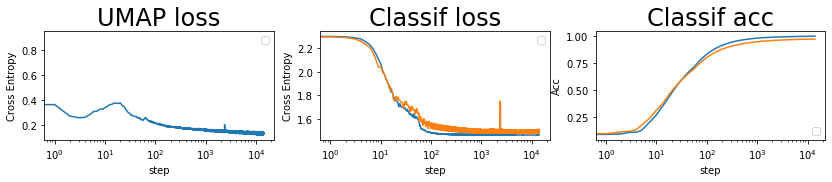

batch: 14000 | train acc: 0.9981 | val acc: 0.9716


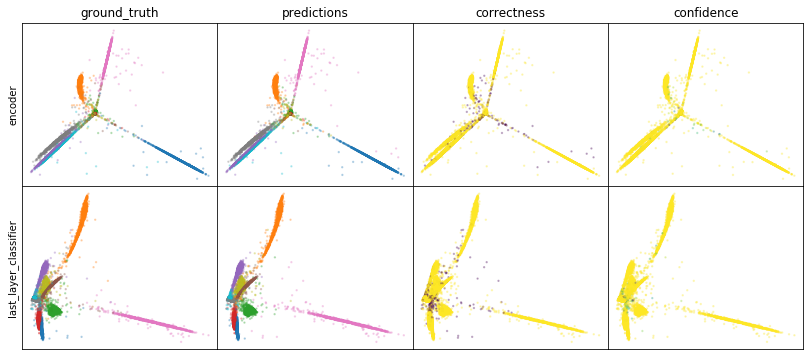

W0808 00:17:48.966646 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:17:49.069540 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:17:49.173290 139911865353984 legend.py:1282] No handles with labels found to put in legend.


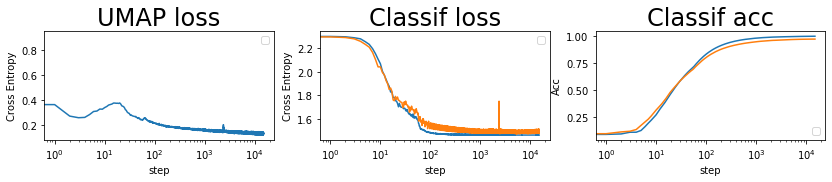

batch: 15000 | train acc: 0.9982 | val acc: 0.9717


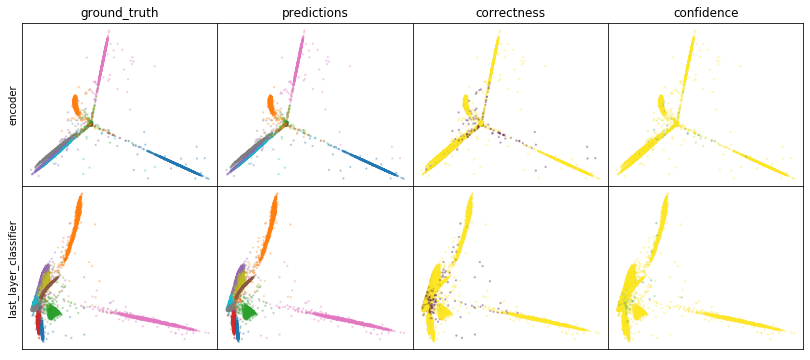

W0808 00:22:21.082000 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:22:21.185286 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:22:21.289532 139911865353984 legend.py:1282] No handles with labels found to put in legend.


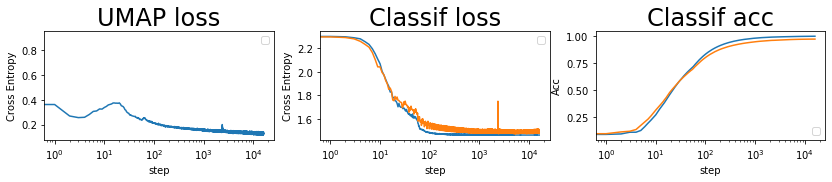

batch: 16000 | train acc: 0.9983 | val acc: 0.9718


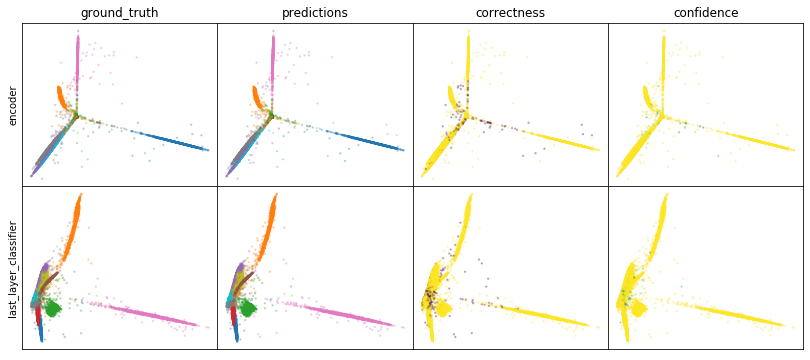

W0808 00:26:53.011459 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:26:53.115073 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:26:53.217202 139911865353984 legend.py:1282] No handles with labels found to put in legend.


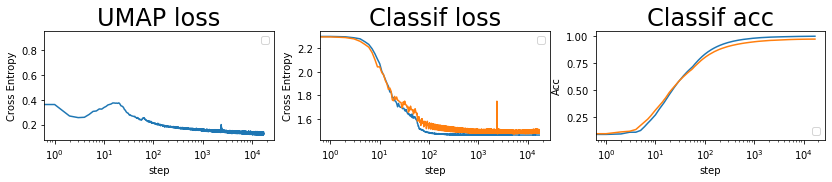

batch: 17000 | train acc: 0.9984 | val acc: 0.9718


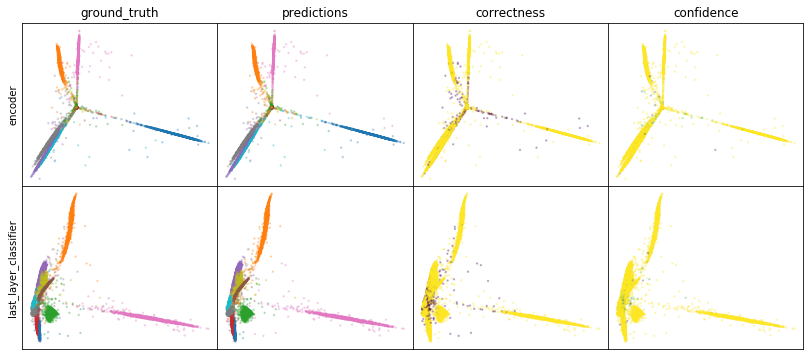

W0808 00:31:25.891668 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:31:25.998220 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:31:26.103355 139911865353984 legend.py:1282] No handles with labels found to put in legend.


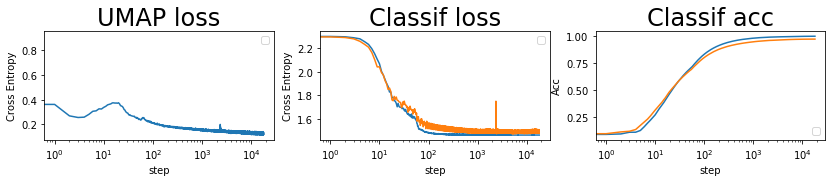

batch: 18000 | train acc: 0.9985 | val acc: 0.9719


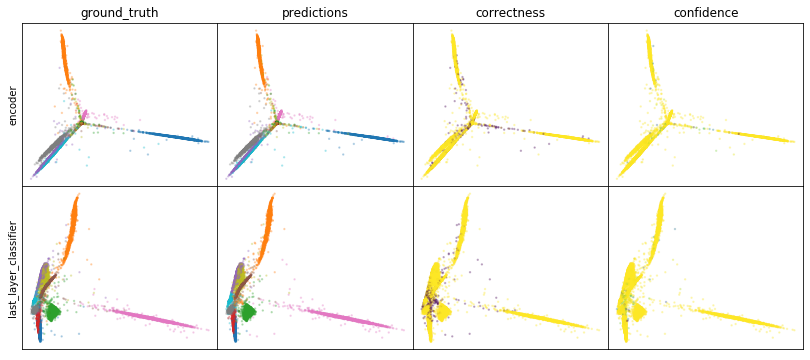

W0808 00:35:59.309252 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:35:59.418081 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:35:59.525965 139911865353984 legend.py:1282] No handles with labels found to put in legend.


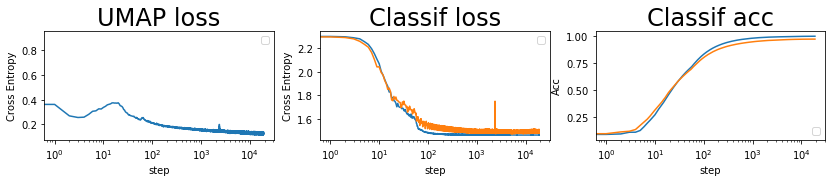

batch: 19000 | train acc: 0.9986 | val acc: 0.9719


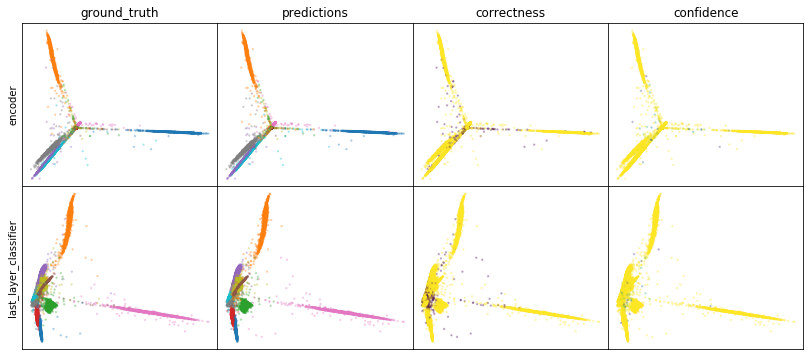

W0808 00:40:32.127163 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:40:32.238791 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:40:32.349524 139911865353984 legend.py:1282] No handles with labels found to put in legend.


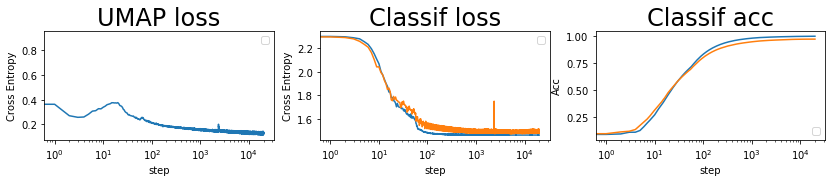

batch: 20000 | train acc: 0.9987 | val acc: 0.9718


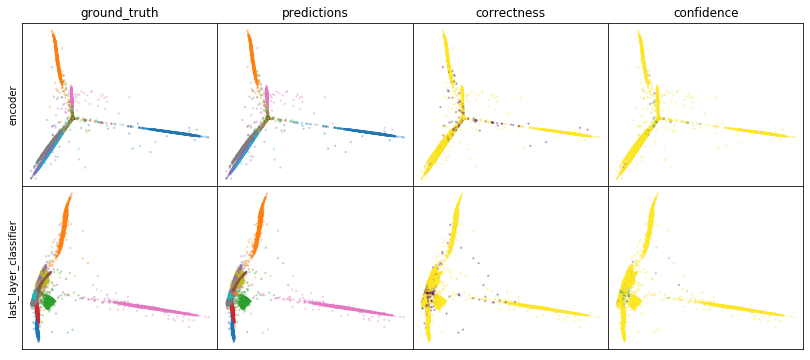

W0808 00:45:06.243548 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:45:06.360970 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:45:06.488904 139911865353984 legend.py:1282] No handles with labels found to put in legend.


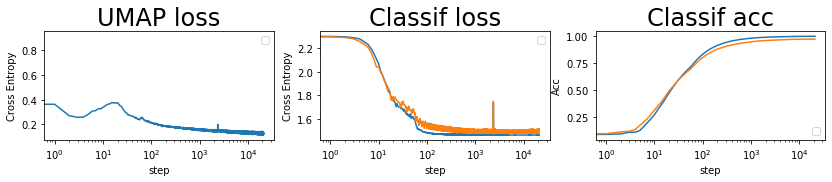

batch: 21000 | train acc: 0.9987 | val acc: 0.9718


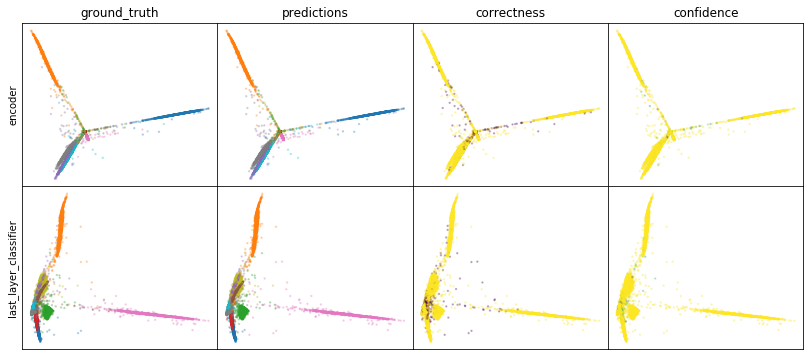

W0808 00:49:40.440052 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:49:40.552936 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:49:40.673560 139911865353984 legend.py:1282] No handles with labels found to put in legend.


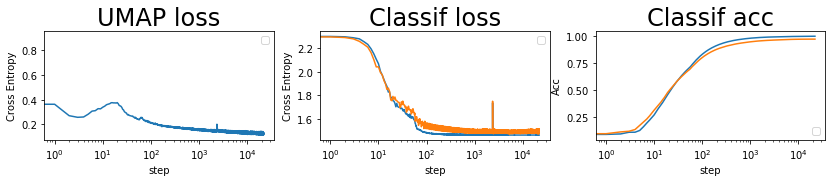

batch: 22000 | train acc: 0.9988 | val acc: 0.9719


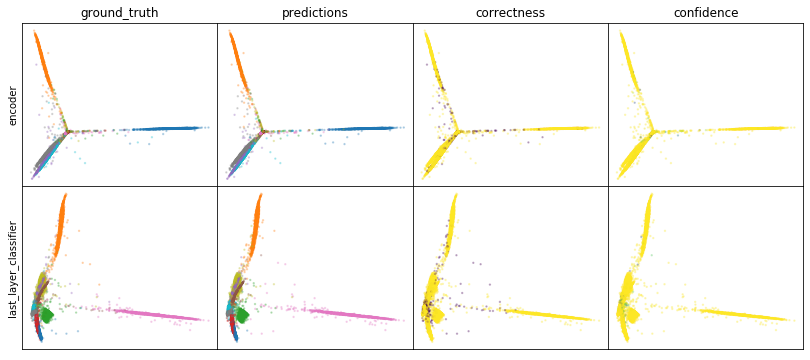

W0808 00:54:15.536223 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:54:15.665500 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:54:15.799177 139911865353984 legend.py:1282] No handles with labels found to put in legend.


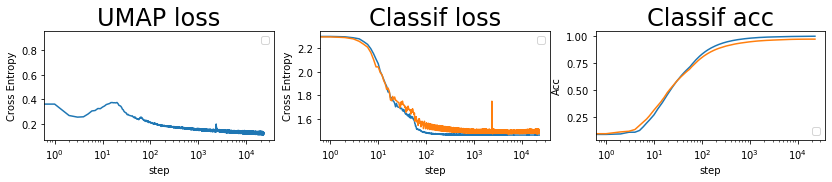

batch: 23000 | train acc: 0.9988 | val acc: 0.9719


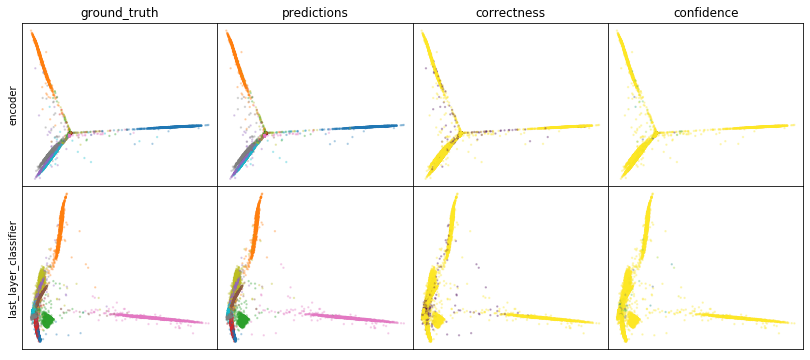

W0808 00:58:50.133281 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:58:50.258397 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 00:58:50.382502 139911865353984 legend.py:1282] No handles with labels found to put in legend.


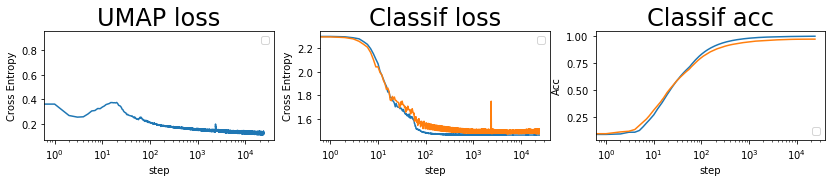

batch: 24000 | train acc: 0.9989 | val acc: 0.9719


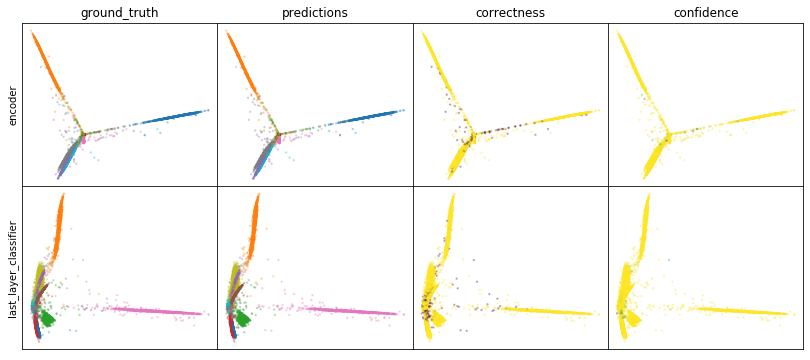

W0808 01:03:26.995342 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:03:27.122099 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:03:27.245055 139911865353984 legend.py:1282] No handles with labels found to put in legend.


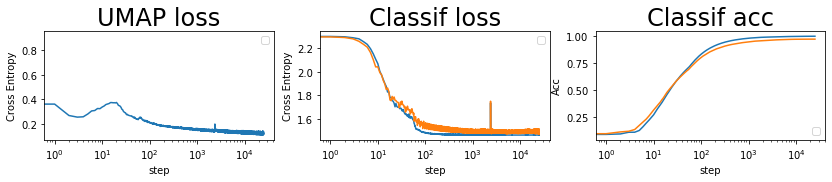

batch: 25000 | train acc: 0.9989 | val acc: 0.9719


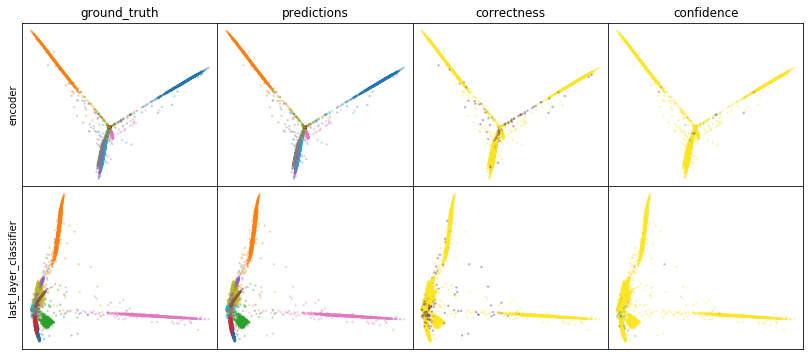

W0808 01:08:03.598334 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:08:03.731759 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:08:03.865334 139911865353984 legend.py:1282] No handles with labels found to put in legend.


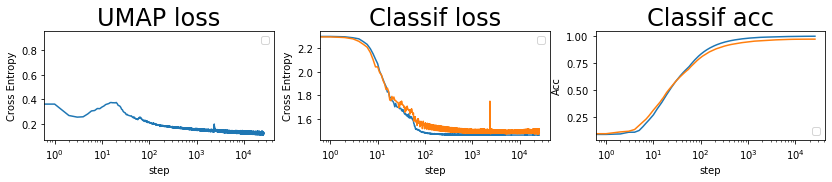

batch: 26000 | train acc: 0.999 | val acc: 0.9719
leaving epoch because no improvement in 10000 batches


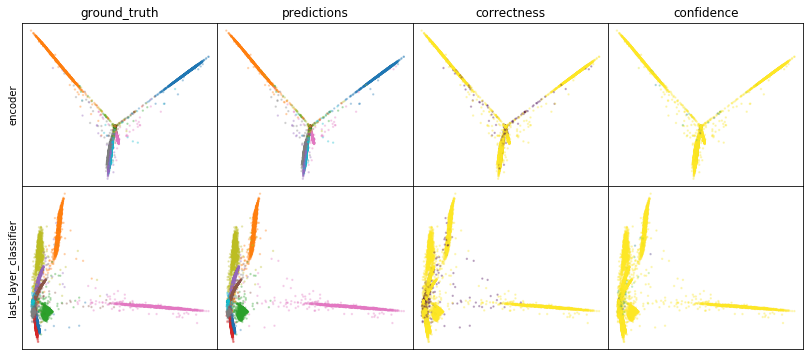

W0808 01:12:40.740875 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:12:40.874079 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:12:41.016589 139911865353984 legend.py:1282] No handles with labels found to put in legend.


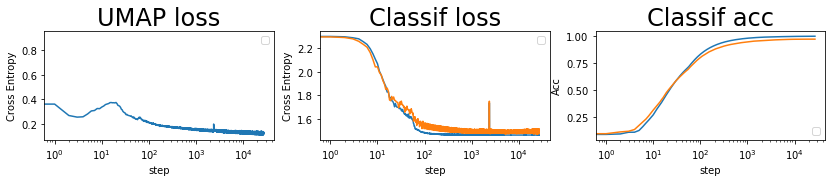

batch: 27000 | train acc: 0.999 | val acc: 0.9719


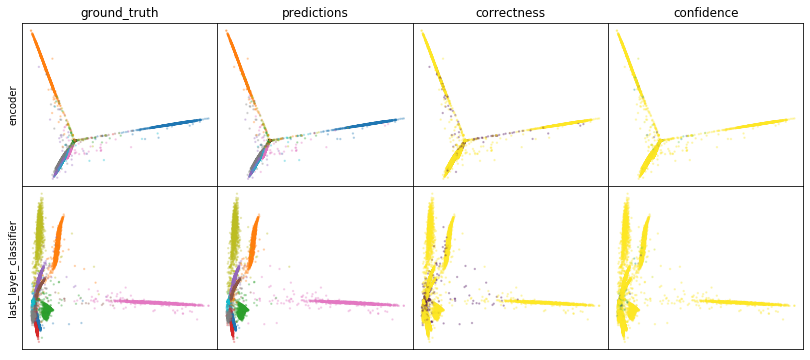

W0808 01:17:18.107342 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:17:18.245948 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:17:18.381370 139911865353984 legend.py:1282] No handles with labels found to put in legend.


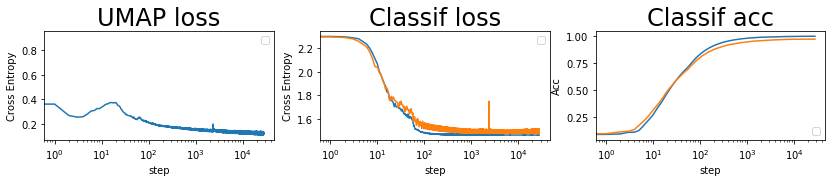

batch: 28000 | train acc: 0.999 | val acc: 0.9718


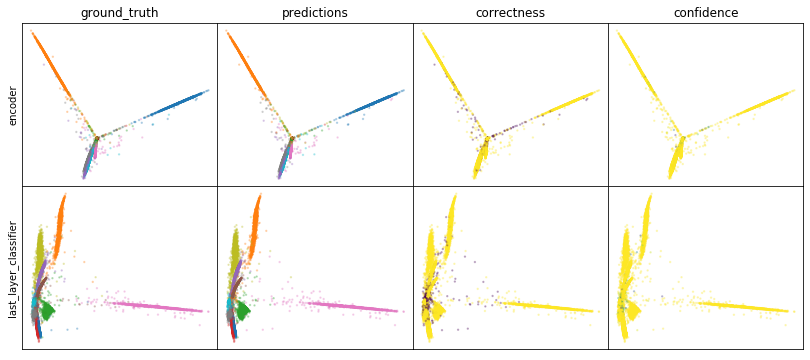

W0808 01:21:55.905559 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:21:56.045757 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:21:56.199498 139911865353984 legend.py:1282] No handles with labels found to put in legend.


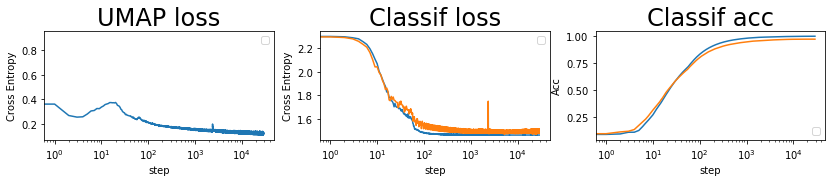

batch: 29000 | train acc: 0.9991 | val acc: 0.9717


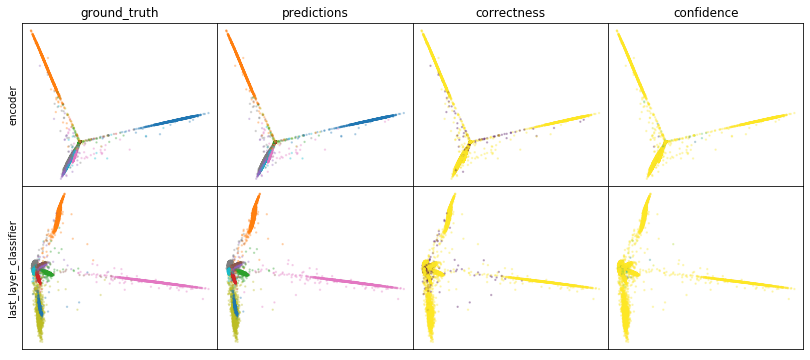

W0808 01:26:34.353784 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:26:34.497867 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:26:34.638216 139911865353984 legend.py:1282] No handles with labels found to put in legend.


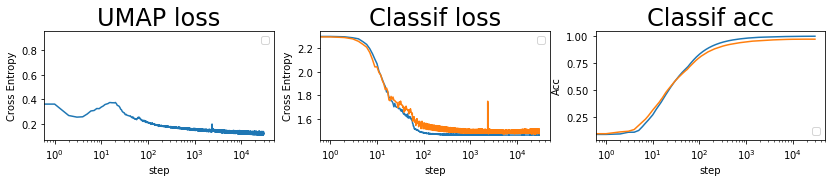

batch: 30000 | train acc: 0.9991 | val acc: 0.9717


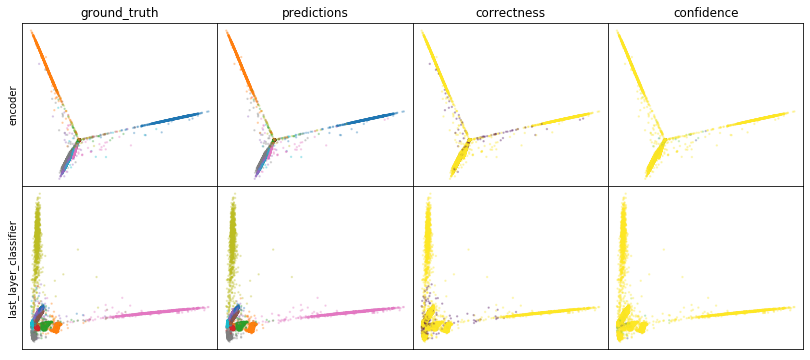

W0808 01:31:12.407671 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:31:12.557090 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:31:12.701982 139911865353984 legend.py:1282] No handles with labels found to put in legend.


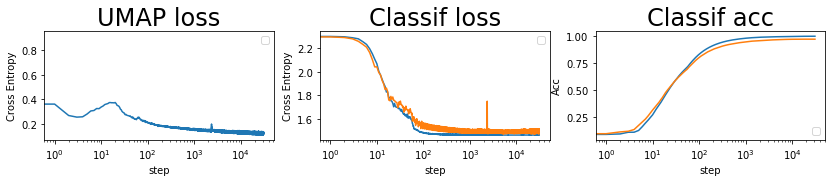

batch: 31000 | train acc: 0.9991 | val acc: 0.9717


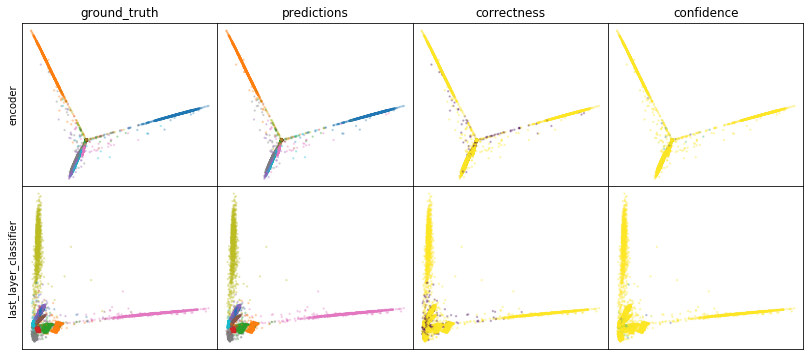

W0808 01:35:52.270730 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:35:52.423901 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:35:52.578442 139911865353984 legend.py:1282] No handles with labels found to put in legend.


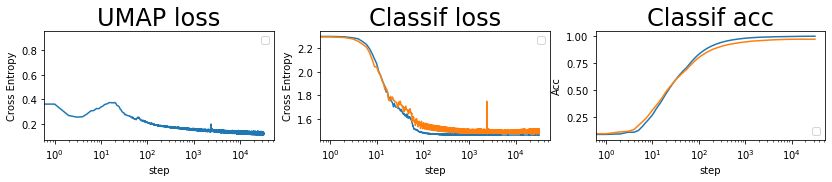

batch: 32000 | train acc: 0.9992 | val acc: 0.9717


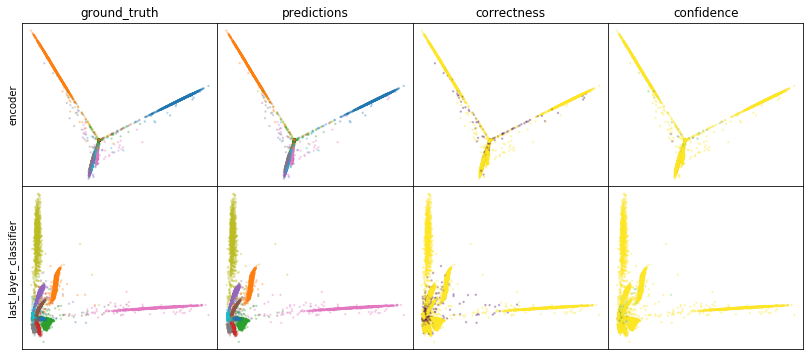

W0808 01:40:31.767659 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:40:31.917154 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:40:32.096036 139911865353984 legend.py:1282] No handles with labels found to put in legend.


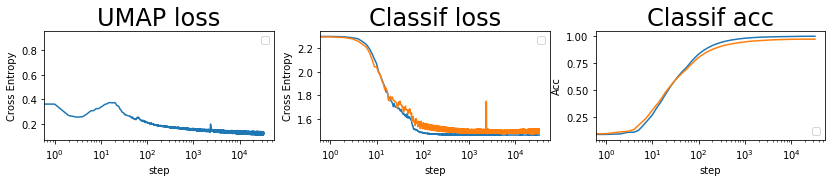

batch: 33000 | train acc: 0.9992 | val acc: 0.9716


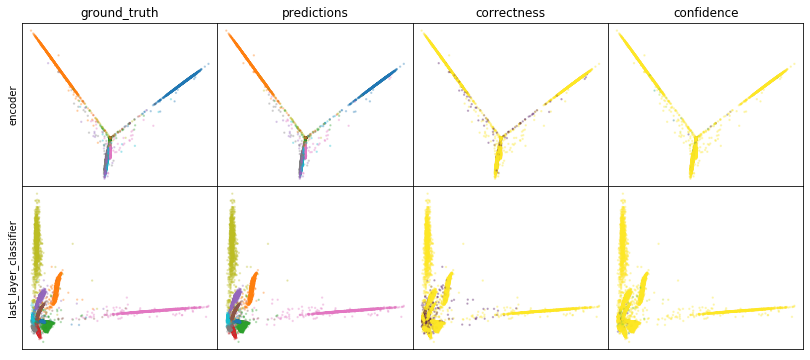

W0808 01:45:11.851043 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:45:12.005184 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:45:12.157587 139911865353984 legend.py:1282] No handles with labels found to put in legend.


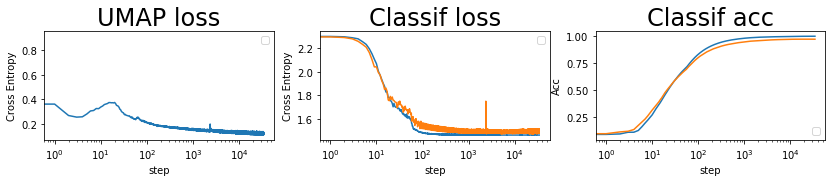

batch: 34000 | train acc: 0.9992 | val acc: 0.9715


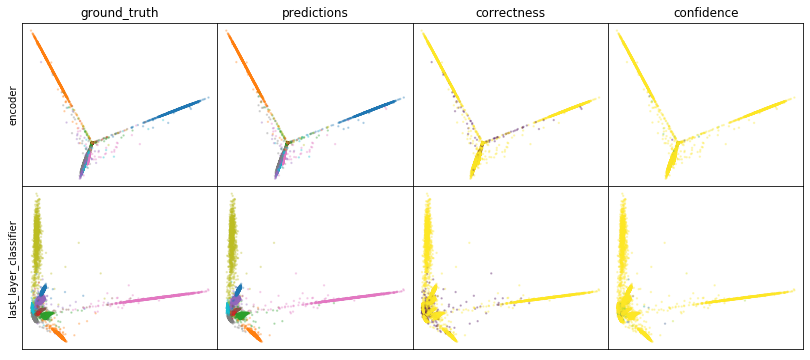

W0808 01:49:51.663302 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:49:51.823888 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:49:51.980204 139911865353984 legend.py:1282] No handles with labels found to put in legend.


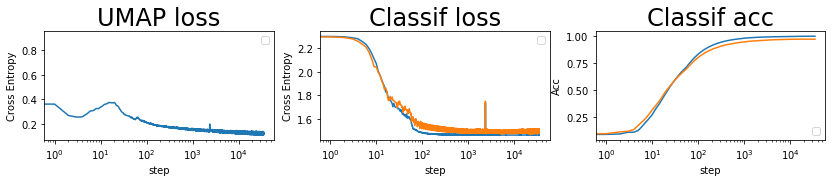

batch: 35000 | train acc: 0.9992 | val acc: 0.9715


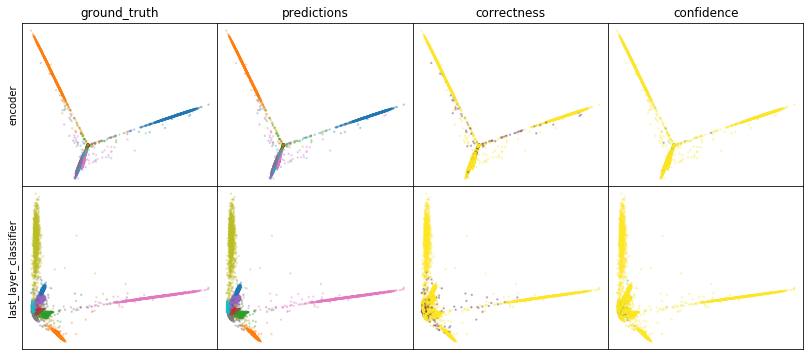

W0808 01:54:31.362121 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:54:31.525467 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:54:31.686328 139911865353984 legend.py:1282] No handles with labels found to put in legend.


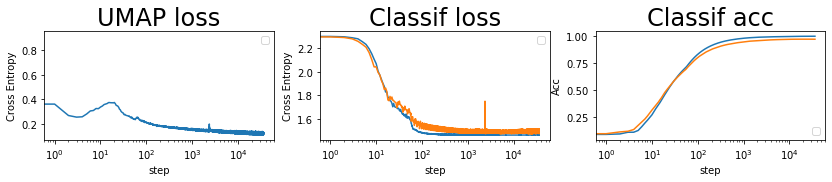

batch: 36000 | train acc: 0.9993 | val acc: 0.9714
leaving epoch because no improvement in 10000 batches


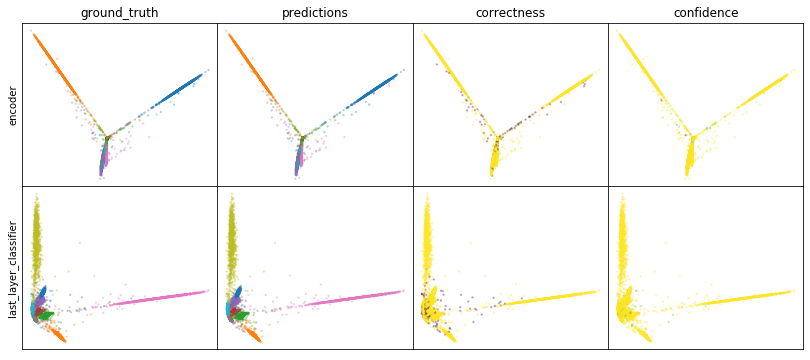

W0808 01:59:13.302282 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:59:13.463222 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 01:59:13.623124 139911865353984 legend.py:1282] No handles with labels found to put in legend.


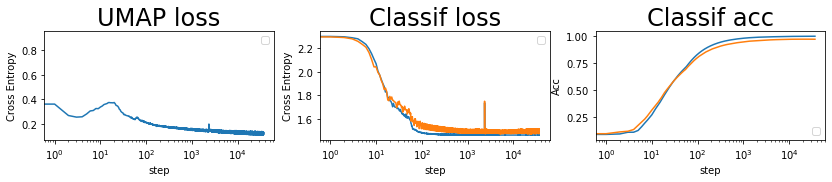

batch: 37000 | train acc: 0.9993 | val acc: 0.9714


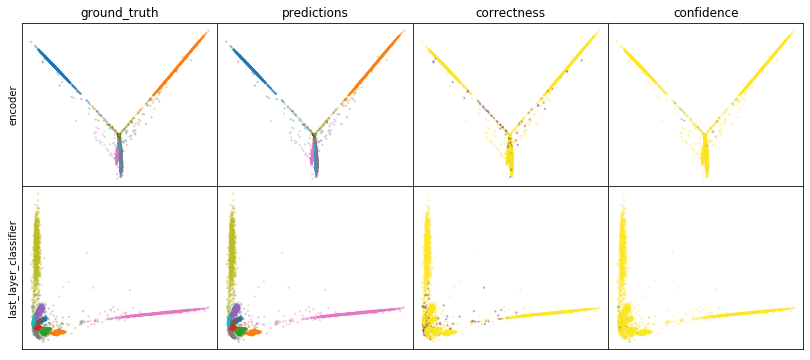

W0808 02:03:56.043704 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:03:56.214679 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:03:56.389699 139911865353984 legend.py:1282] No handles with labels found to put in legend.


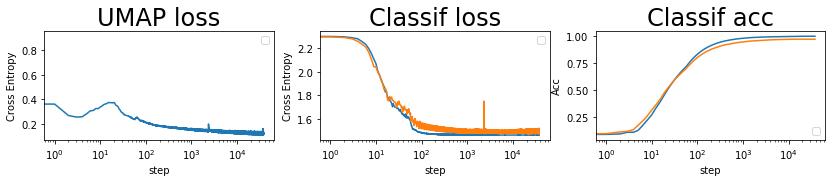

batch: 38000 | train acc: 0.9993 | val acc: 0.9714


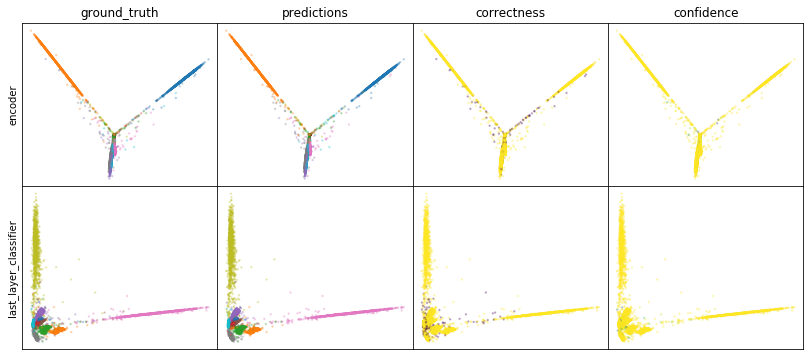

W0808 02:08:38.936859 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:08:39.127740 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:08:39.305030 139911865353984 legend.py:1282] No handles with labels found to put in legend.


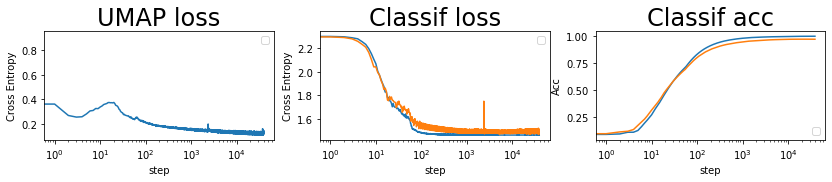

batch: 39000 | train acc: 0.9993 | val acc: 0.9714


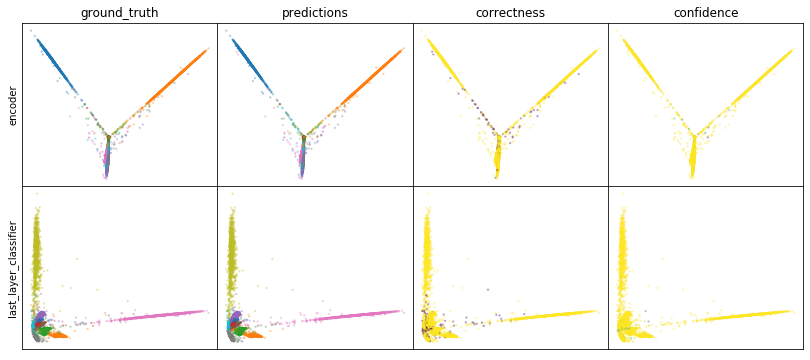

W0808 02:13:21.890704 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:13:22.057220 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:13:22.223790 139911865353984 legend.py:1282] No handles with labels found to put in legend.


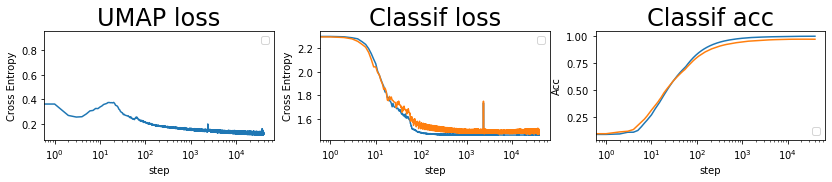

batch: 40000 | train acc: 0.9993 | val acc: 0.9714


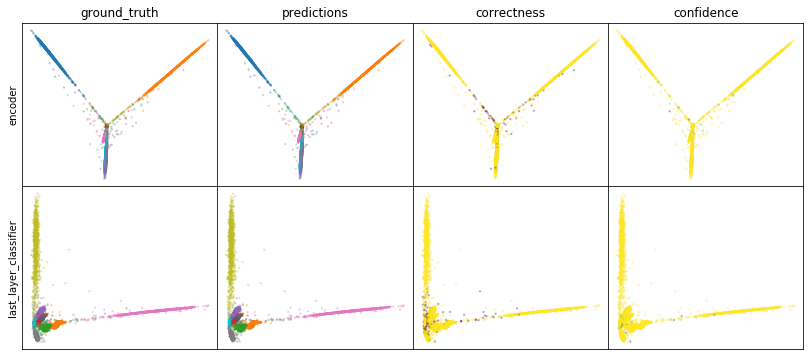

W0808 02:18:05.773215 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:18:05.945467 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:18:06.113419 139911865353984 legend.py:1282] No handles with labels found to put in legend.


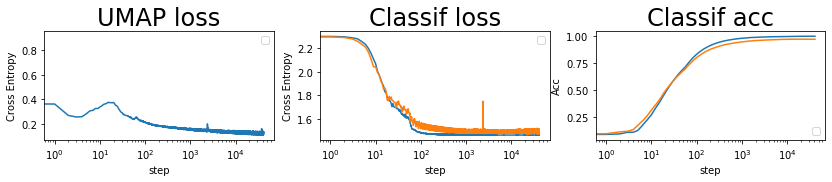

batch: 41000 | train acc: 0.9993 | val acc: 0.9714


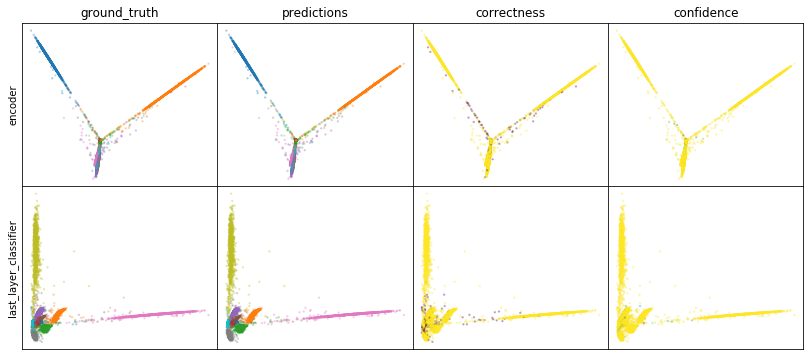

W0808 02:22:49.585756 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:22:49.761351 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:22:49.934436 139911865353984 legend.py:1282] No handles with labels found to put in legend.


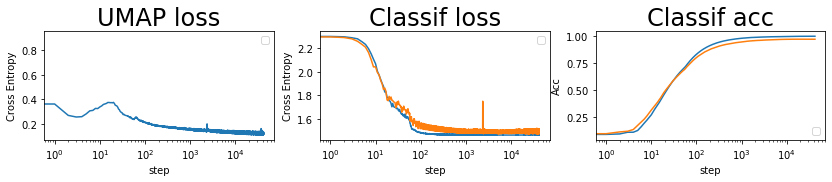

batch: 42000 | train acc: 0.9993 | val acc: 0.9714


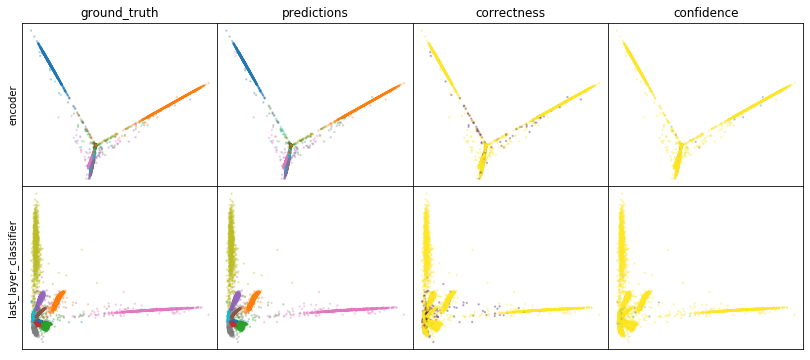

W0808 02:27:34.778430 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:27:34.955851 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:27:35.129909 139911865353984 legend.py:1282] No handles with labels found to put in legend.


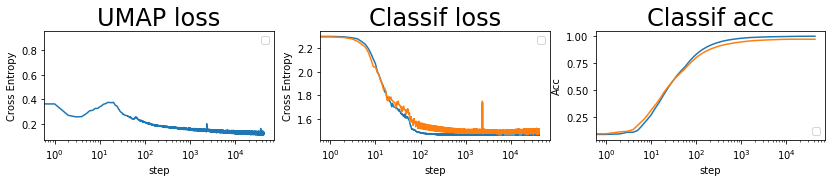

batch: 43000 | train acc: 0.9994 | val acc: 0.9714


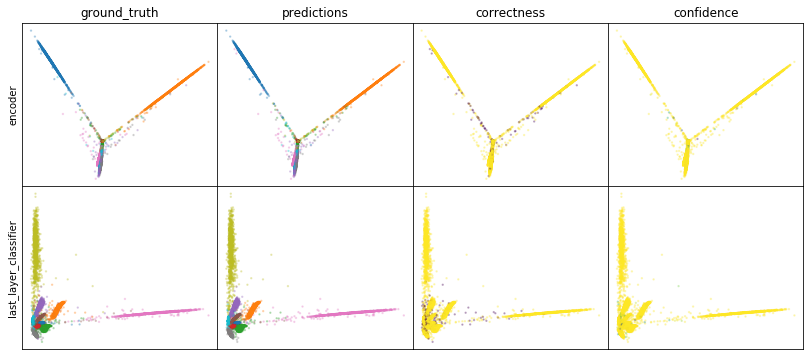

W0808 02:32:20.849200 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:32:21.052025 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:32:21.237064 139911865353984 legend.py:1282] No handles with labels found to put in legend.


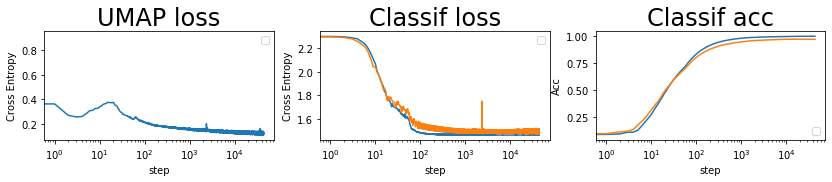

batch: 44000 | train acc: 0.9994 | val acc: 0.9714


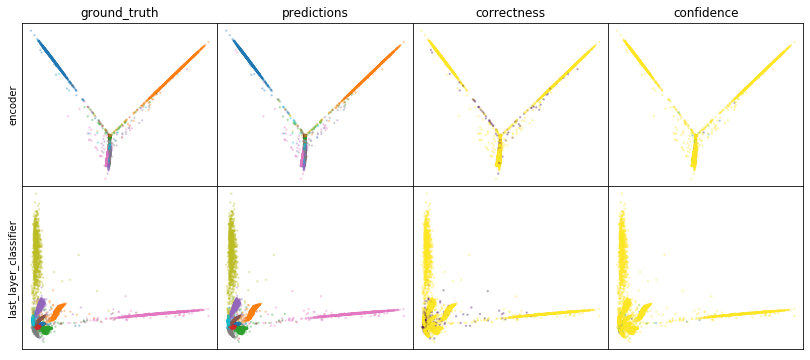

W0808 02:37:06.735246 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:37:06.934913 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:37:07.117291 139911865353984 legend.py:1282] No handles with labels found to put in legend.


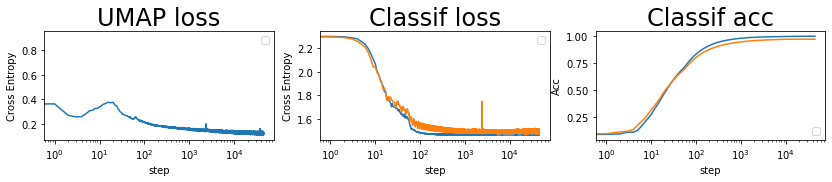

batch: 45000 | train acc: 0.9994 | val acc: 0.9714


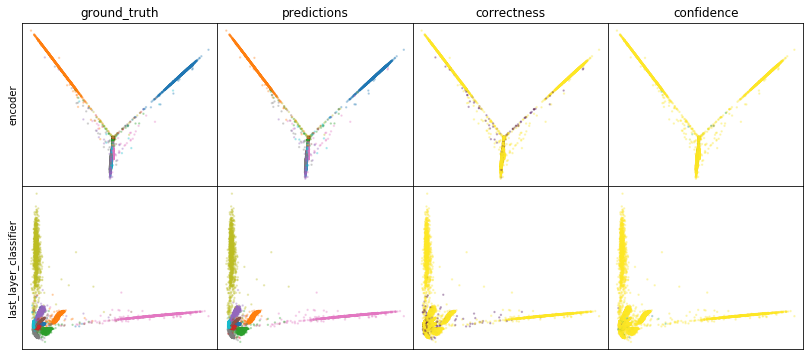

W0808 02:41:53.145322 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:41:53.334210 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:41:53.514264 139911865353984 legend.py:1282] No handles with labels found to put in legend.


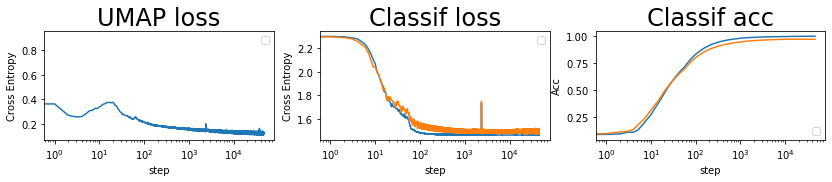

batch: 46000 | train acc: 0.9994 | val acc: 0.9714
leaving epoch because no improvement in 10000 batches


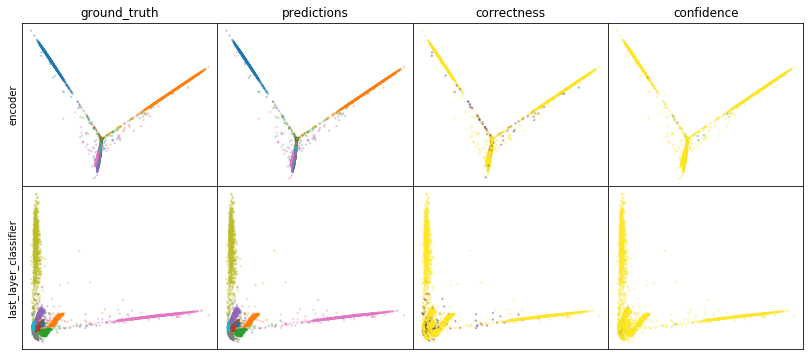

W0808 02:46:39.643011 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:46:39.829949 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:46:40.013263 139911865353984 legend.py:1282] No handles with labels found to put in legend.


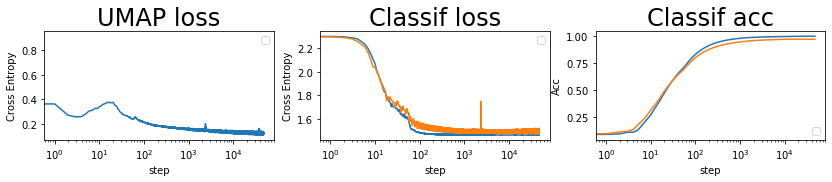

batch: 47000 | train acc: 0.9994 | val acc: 0.9714


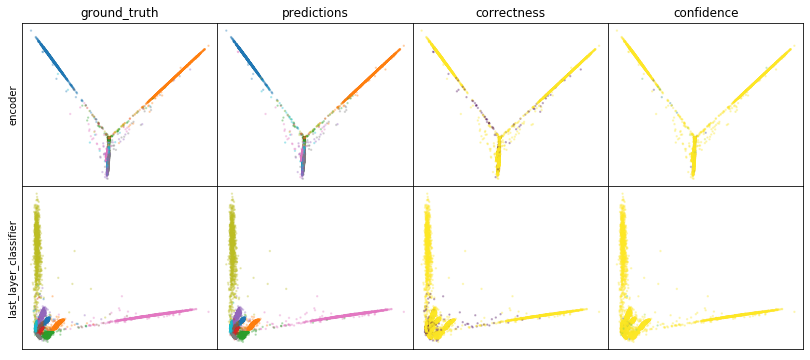

W0808 02:51:26.710722 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:51:26.901588 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:51:27.090121 139911865353984 legend.py:1282] No handles with labels found to put in legend.


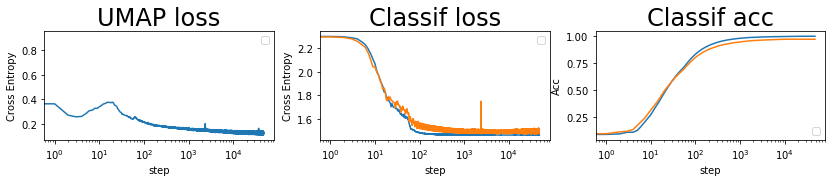

batch: 48000 | train acc: 0.9994 | val acc: 0.9714


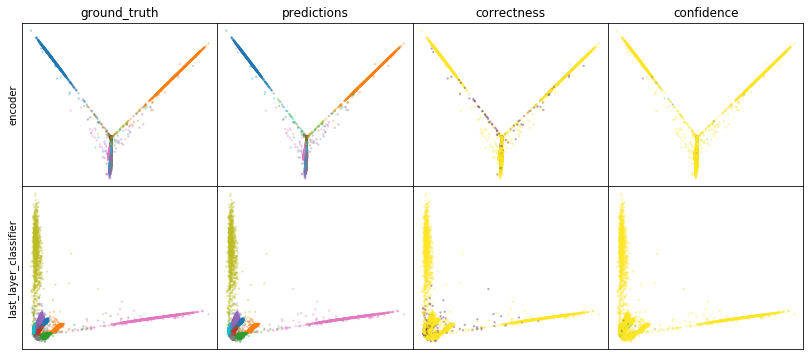

W0808 02:56:13.088596 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:56:13.287291 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 02:56:13.482883 139911865353984 legend.py:1282] No handles with labels found to put in legend.


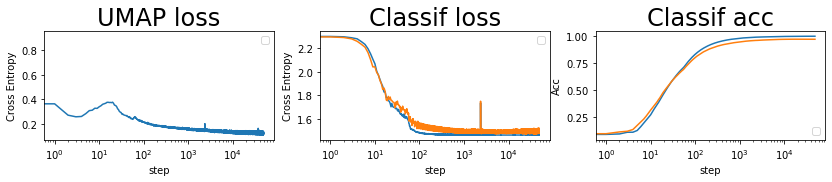

batch: 49000 | train acc: 0.9994 | val acc: 0.9713


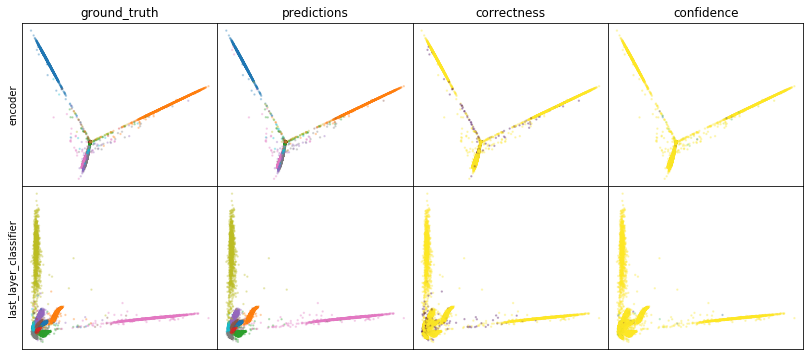

W0808 03:01:02.036375 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:01:02.230786 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:01:02.422307 139911865353984 legend.py:1282] No handles with labels found to put in legend.


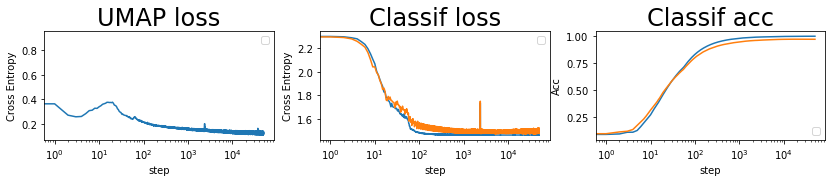

batch: 50000 | train acc: 0.9995 | val acc: 0.9713


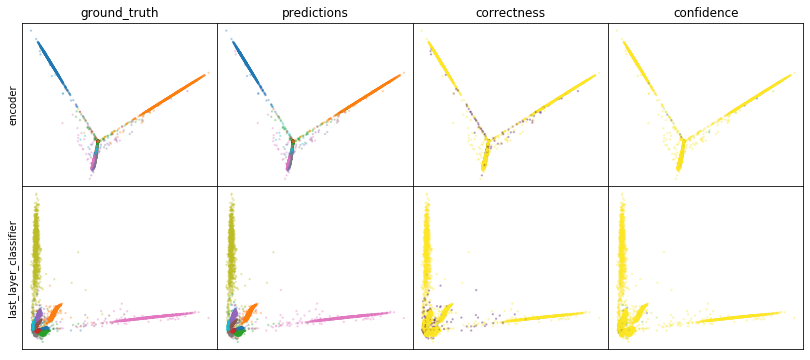

W0808 03:05:50.253350 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:05:50.468085 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:05:50.674407 139911865353984 legend.py:1282] No handles with labels found to put in legend.


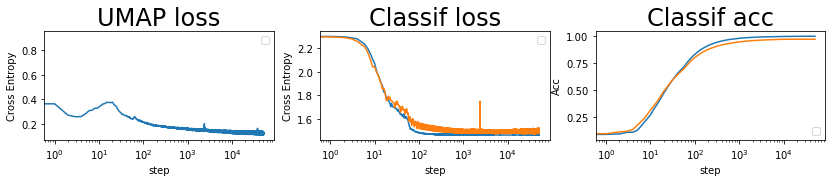

batch: 51000 | train acc: 0.9995 | val acc: 0.9712


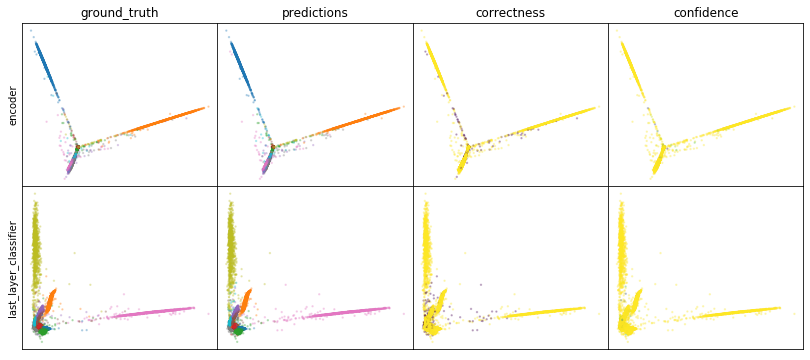

W0808 03:10:39.269443 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:10:39.480470 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:10:39.680758 139911865353984 legend.py:1282] No handles with labels found to put in legend.


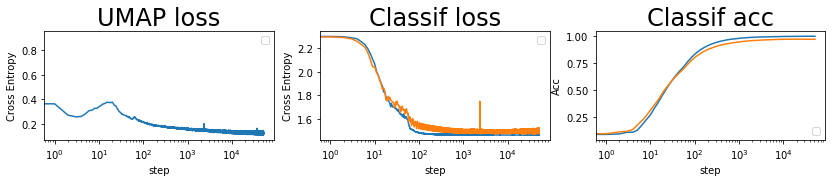

batch: 52000 | train acc: 0.9995 | val acc: 0.9712


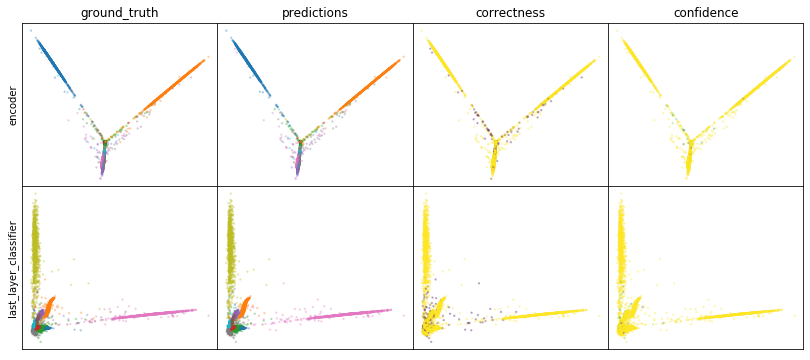

W0808 03:15:27.818309 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:15:28.026511 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:15:28.228227 139911865353984 legend.py:1282] No handles with labels found to put in legend.


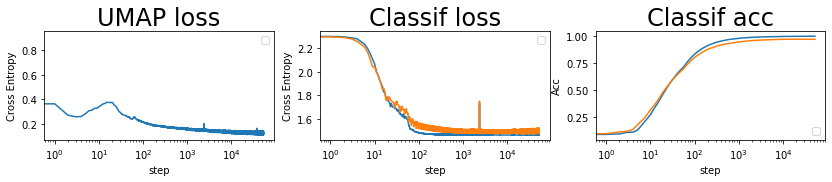

batch: 53000 | train acc: 0.9995 | val acc: 0.9711


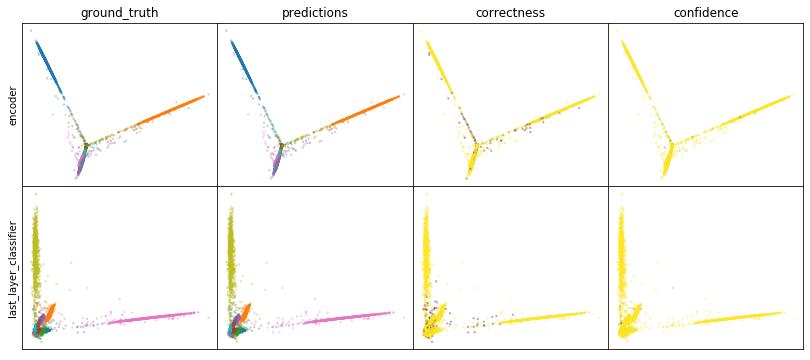

W0808 03:20:17.641545 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:20:17.852490 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:20:18.061835 139911865353984 legend.py:1282] No handles with labels found to put in legend.


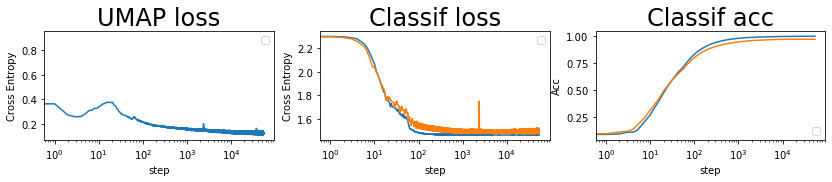

batch: 54000 | train acc: 0.9995 | val acc: 0.9711


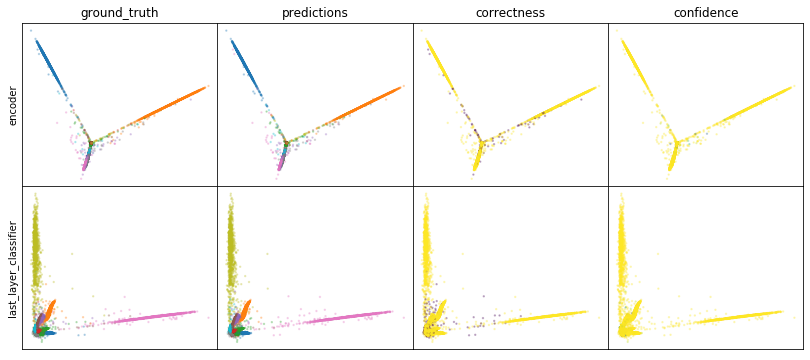

W0808 03:25:08.503325 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:25:08.720528 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:25:08.933382 139911865353984 legend.py:1282] No handles with labels found to put in legend.


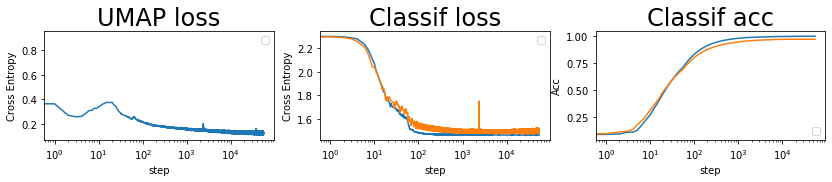

batch: 55000 | train acc: 0.9995 | val acc: 0.9711


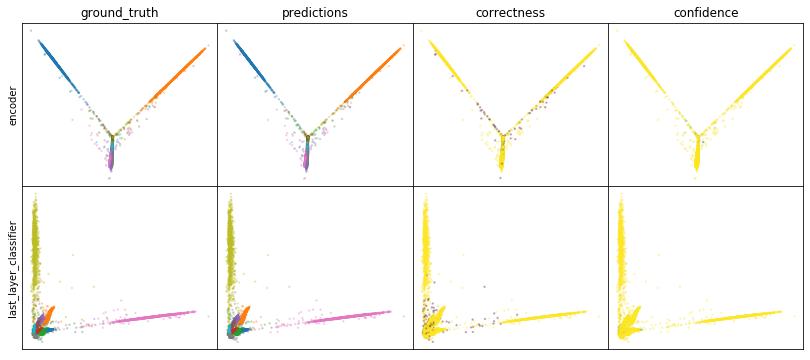

W0808 03:29:58.040470 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:29:58.253669 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:29:58.462601 139911865353984 legend.py:1282] No handles with labels found to put in legend.


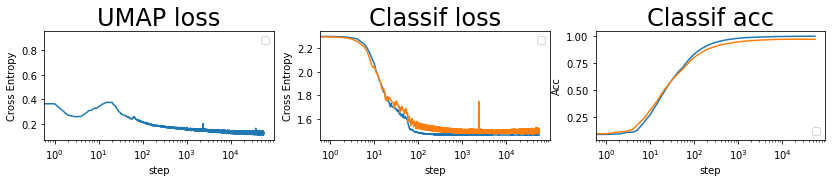

batch: 56000 | train acc: 0.9995 | val acc: 0.971
leaving epoch because no improvement in 10000 batches


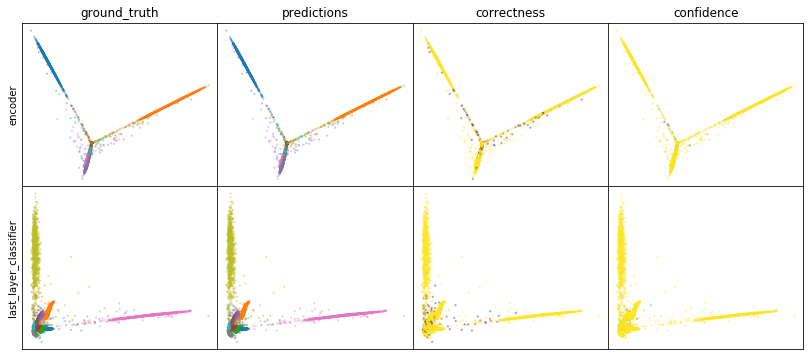

W0808 03:34:49.291862 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:34:49.515981 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:34:49.740825 139911865353984 legend.py:1282] No handles with labels found to put in legend.


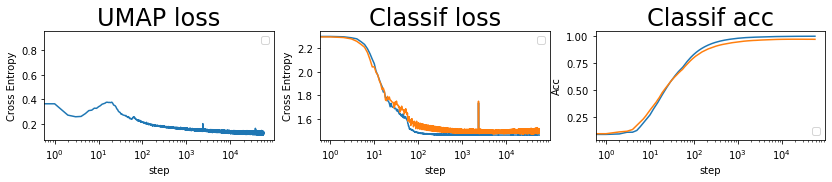

batch: 57000 | train acc: 0.9995 | val acc: 0.971


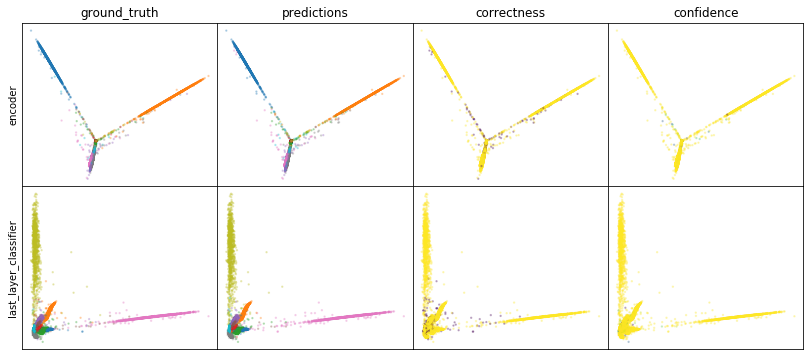

W0808 03:39:41.200590 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:39:41.432740 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:39:41.663548 139911865353984 legend.py:1282] No handles with labels found to put in legend.


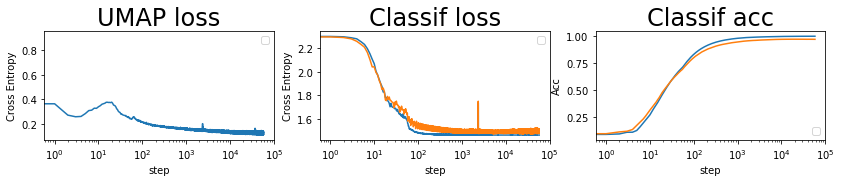

batch: 58000 | train acc: 0.9995 | val acc: 0.971


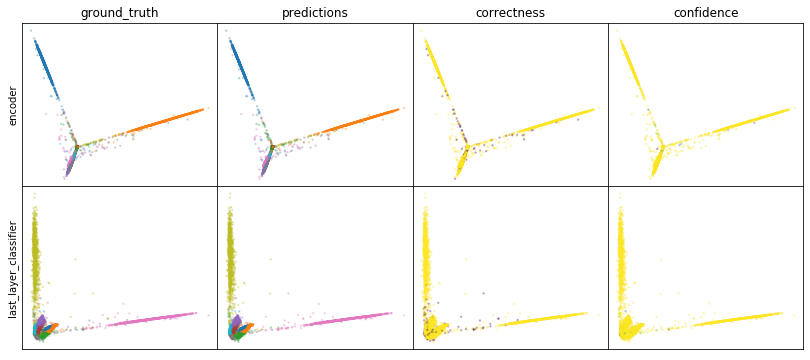

W0808 03:44:33.304760 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:44:33.567140 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:44:33.820484 139911865353984 legend.py:1282] No handles with labels found to put in legend.


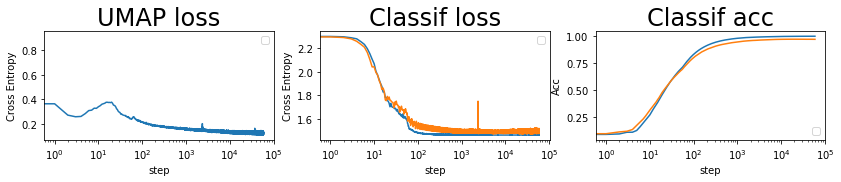

batch: 59000 | train acc: 0.9995 | val acc: 0.971


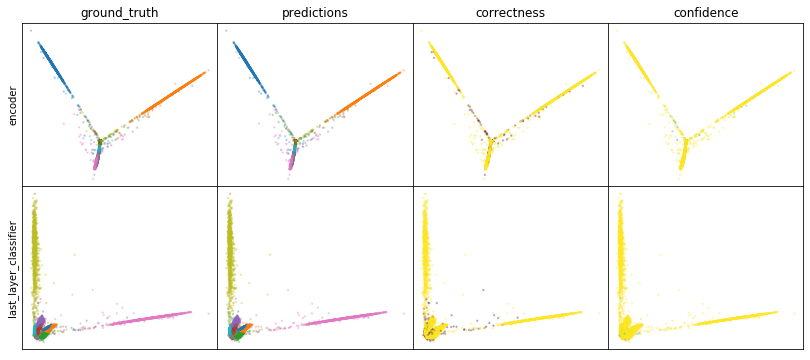

W0808 03:49:25.242034 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:49:25.470320 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:49:25.684802 139911865353984 legend.py:1282] No handles with labels found to put in legend.


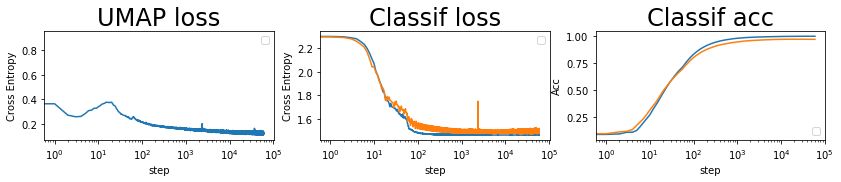

batch: 60000 | train acc: 0.9995 | val acc: 0.9709


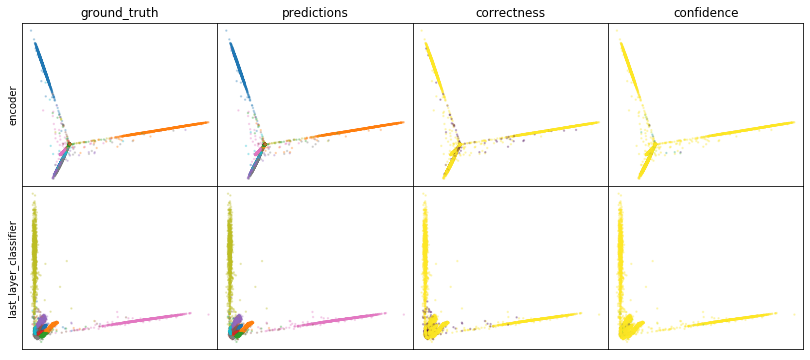

W0808 03:54:17.895739 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:54:18.133152 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:54:18.372748 139911865353984 legend.py:1282] No handles with labels found to put in legend.


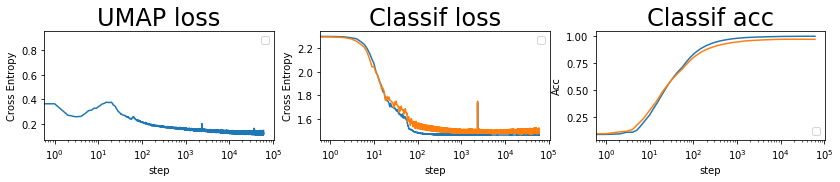

batch: 61000 | train acc: 0.9995 | val acc: 0.9709


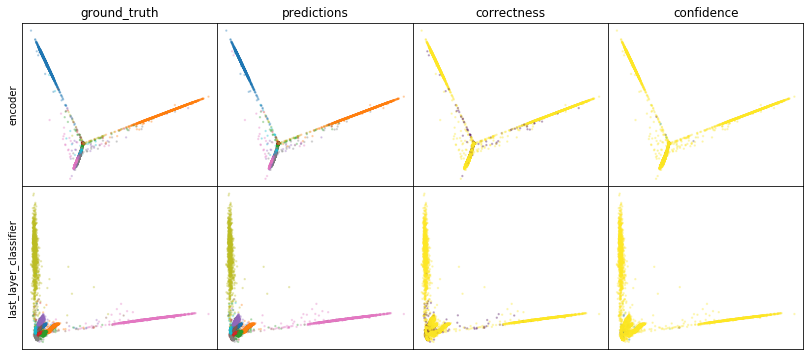

W0808 03:59:11.578034 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:59:11.818215 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 03:59:12.046581 139911865353984 legend.py:1282] No handles with labels found to put in legend.


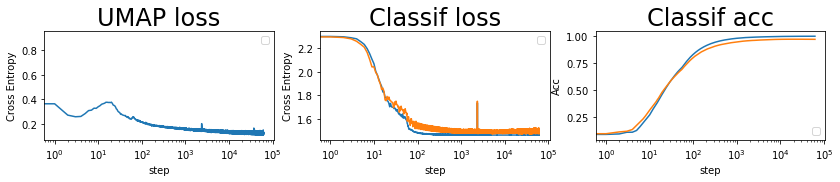

batch: 62000 | train acc: 0.9996 | val acc: 0.9709


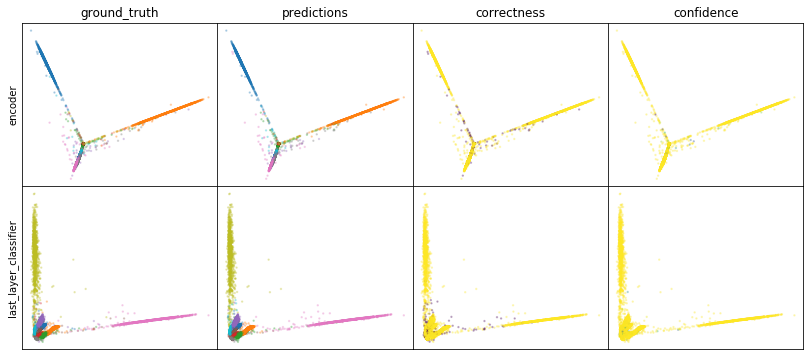

W0808 04:04:05.048686 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:04:05.291383 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:04:05.527944 139911865353984 legend.py:1282] No handles with labels found to put in legend.


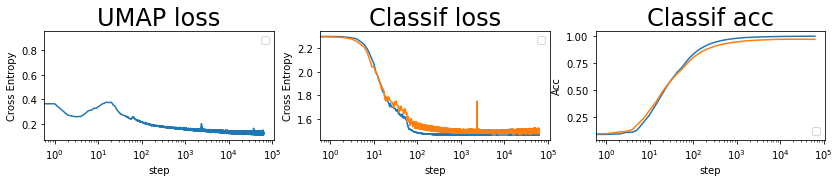

batch: 63000 | train acc: 0.9996 | val acc: 0.9709


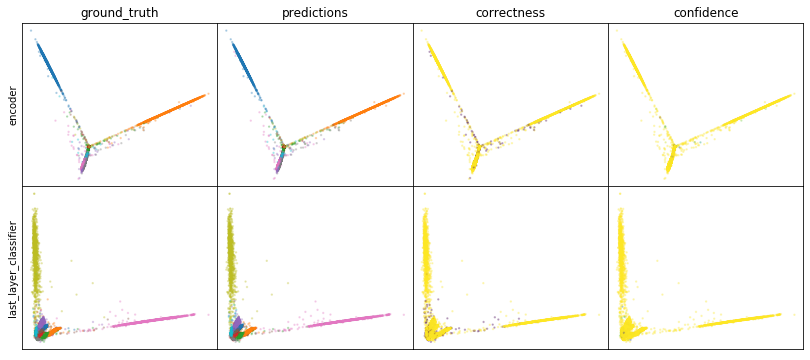

W0808 04:09:00.200717 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:09:00.452295 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:09:00.684554 139911865353984 legend.py:1282] No handles with labels found to put in legend.


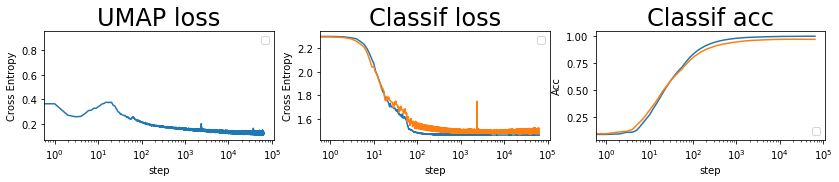

batch: 64000 | train acc: 0.9996 | val acc: 0.9709


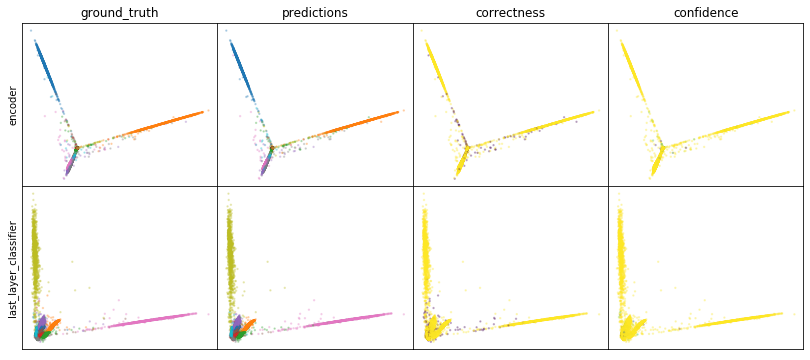

W0808 04:13:56.801543 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:13:57.055539 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:13:57.300767 139911865353984 legend.py:1282] No handles with labels found to put in legend.


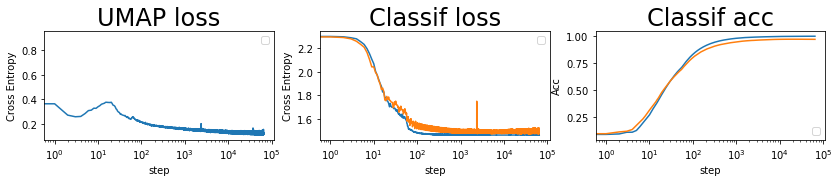

batch: 65000 | train acc: 0.9996 | val acc: 0.9708


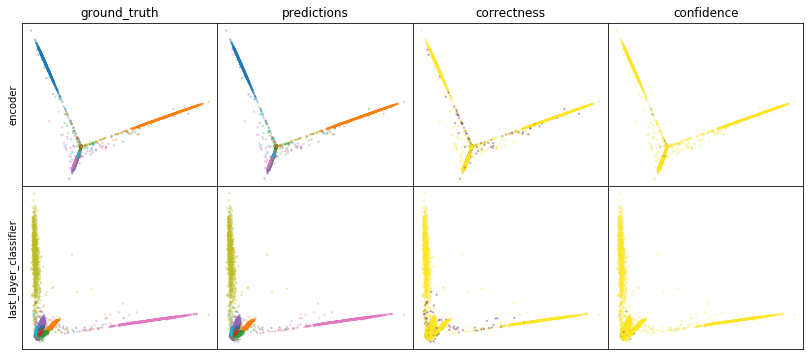

W0808 04:18:51.821437 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:18:52.107653 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:18:52.345988 139911865353984 legend.py:1282] No handles with labels found to put in legend.


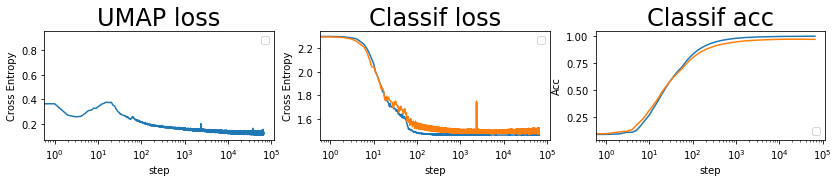

batch: 66000 | train acc: 0.9996 | val acc: 0.9708
leaving epoch because no improvement in 10000 batches


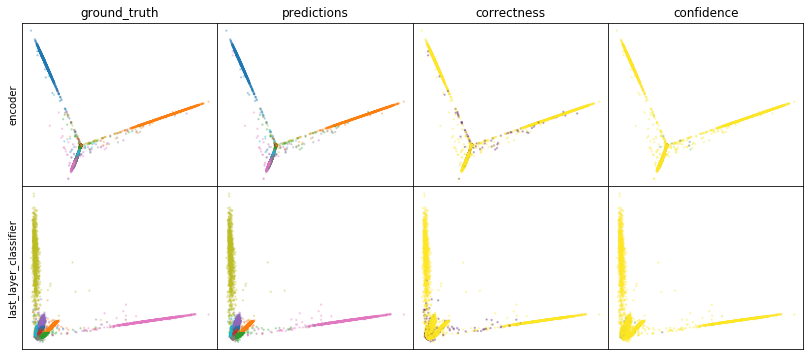

W0808 04:23:48.180918 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:23:48.428376 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:23:48.667546 139911865353984 legend.py:1282] No handles with labels found to put in legend.


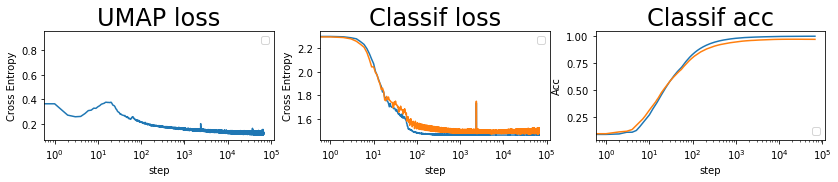

batch: 67000 | train acc: 0.9996 | val acc: 0.9708


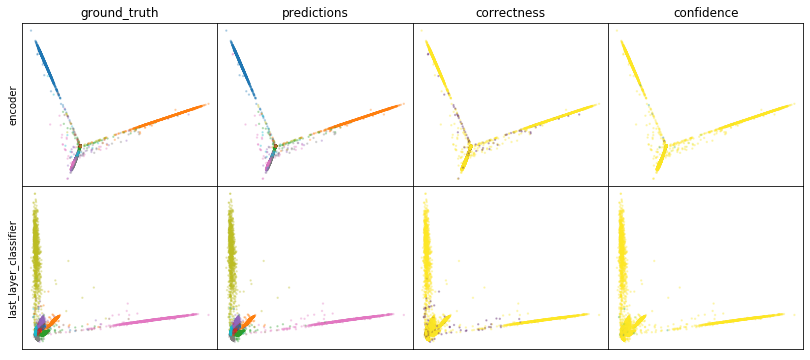

W0808 04:28:43.614085 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:28:43.865321 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:28:44.107257 139911865353984 legend.py:1282] No handles with labels found to put in legend.


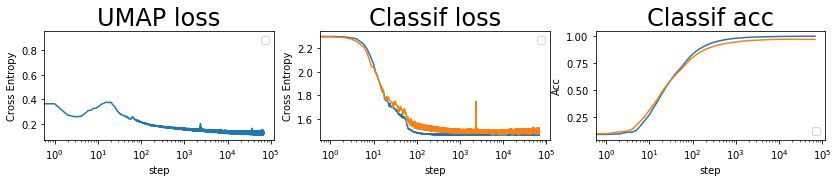

batch: 68000 | train acc: 0.9996 | val acc: 0.9707


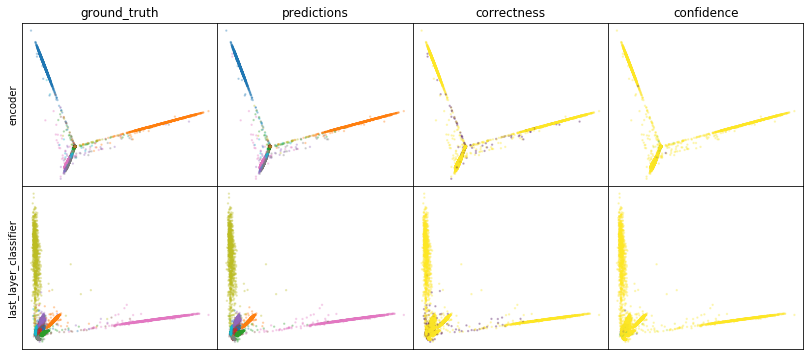

W0808 04:33:40.450414 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:33:40.715761 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:33:40.967118 139911865353984 legend.py:1282] No handles with labels found to put in legend.


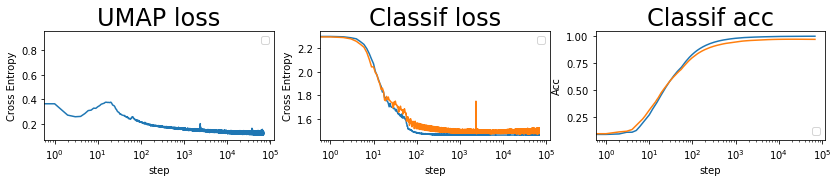

batch: 69000 | train acc: 0.9996 | val acc: 0.9707


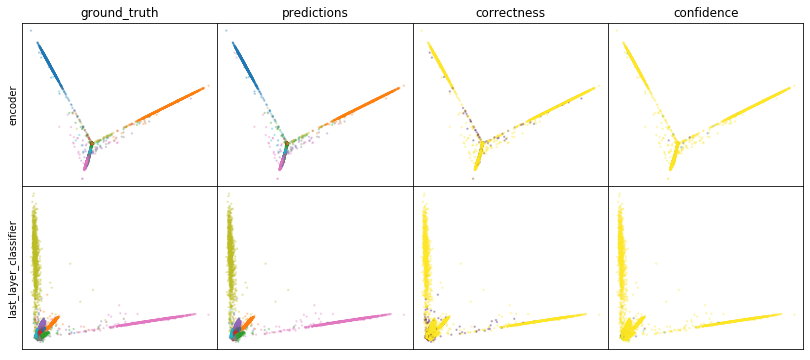

W0808 04:38:36.637607 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:38:36.926667 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:38:37.200061 139911865353984 legend.py:1282] No handles with labels found to put in legend.


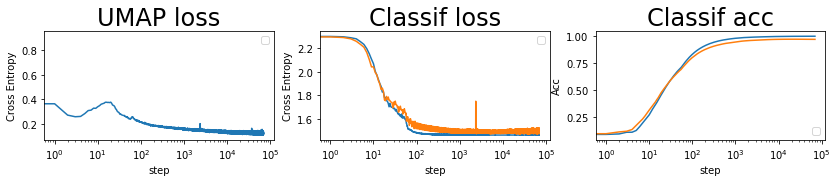

batch: 70000 | train acc: 0.9996 | val acc: 0.9707


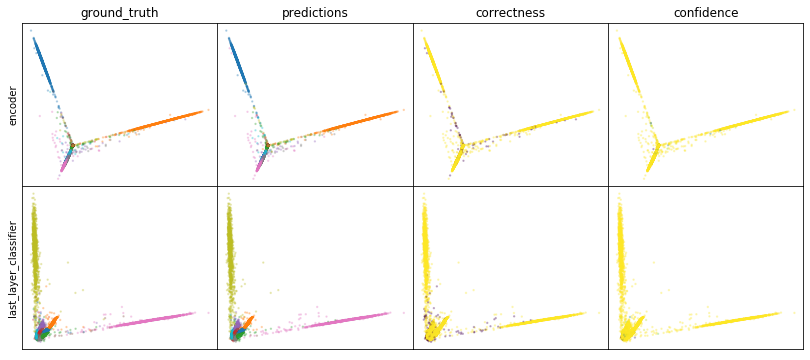

W0808 04:43:35.001824 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:43:35.275967 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:43:35.547686 139911865353984 legend.py:1282] No handles with labels found to put in legend.


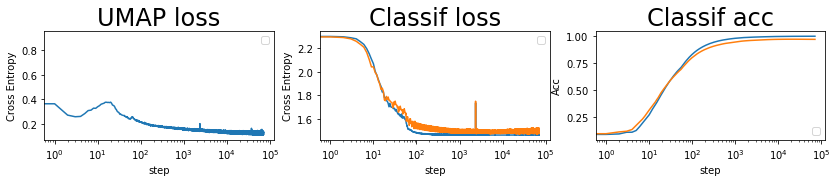

batch: 71000 | train acc: 0.9996 | val acc: 0.9707


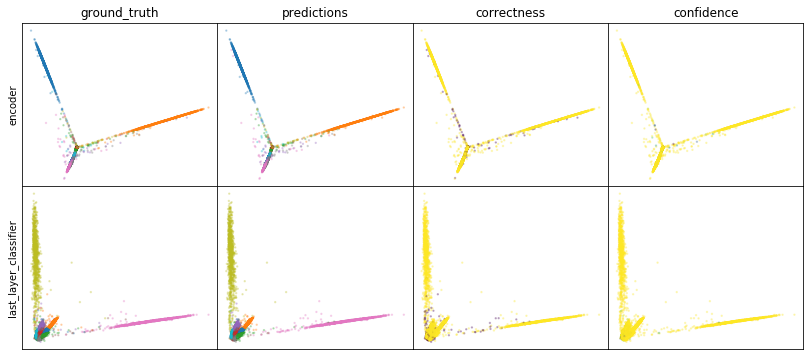

W0808 04:48:33.882760 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:48:34.160521 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:48:34.423457 139911865353984 legend.py:1282] No handles with labels found to put in legend.


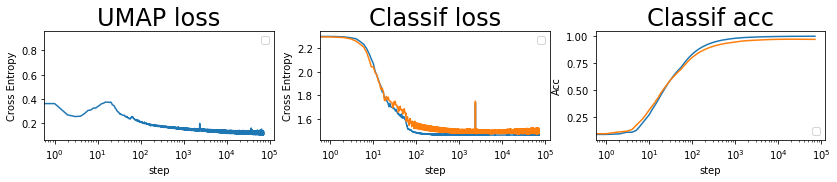

batch: 72000 | train acc: 0.9996 | val acc: 0.9707


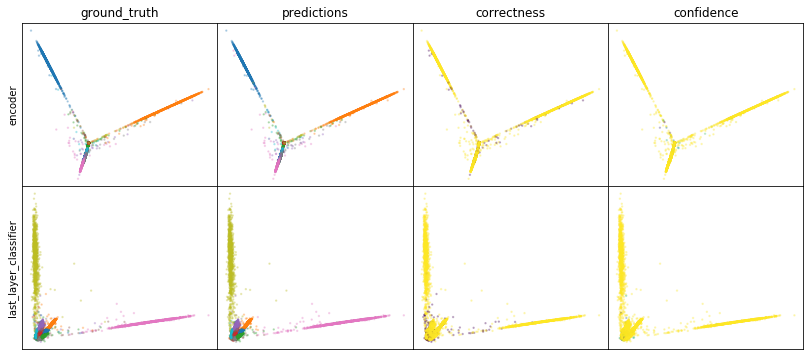

W0808 04:53:32.070713 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:53:32.342124 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:53:32.604152 139911865353984 legend.py:1282] No handles with labels found to put in legend.


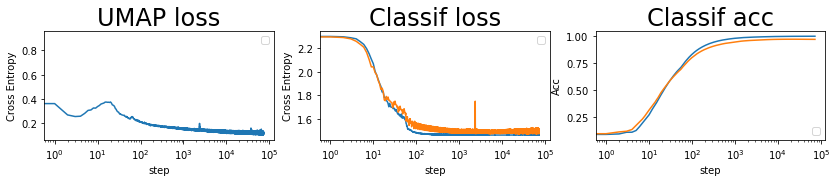

batch: 73000 | train acc: 0.9996 | val acc: 0.9707


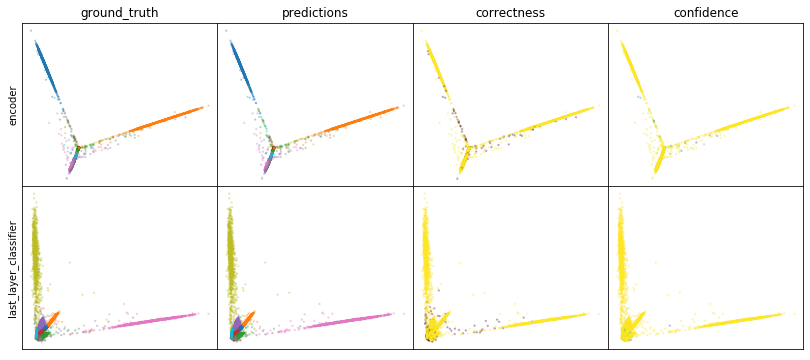

W0808 04:58:30.622996 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:58:30.888162 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 04:58:31.143310 139911865353984 legend.py:1282] No handles with labels found to put in legend.


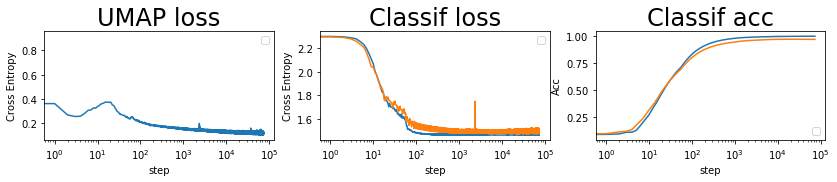

batch: 74000 | train acc: 0.9996 | val acc: 0.9706


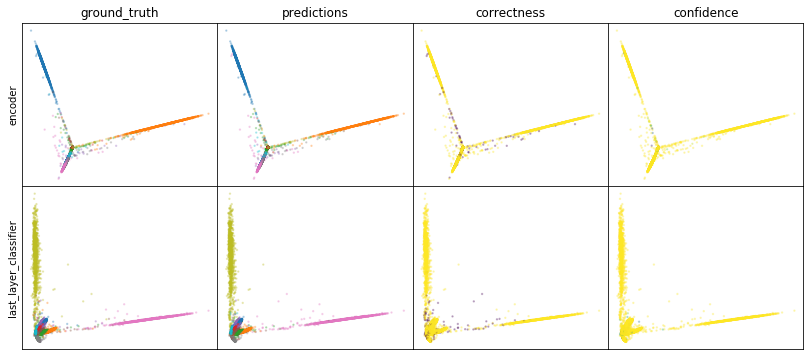

W0808 05:03:30.381945 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:03:30.655319 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:03:30.925450 139911865353984 legend.py:1282] No handles with labels found to put in legend.


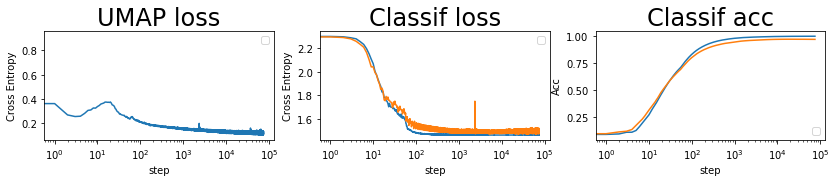

batch: 75000 | train acc: 0.9996 | val acc: 0.9706


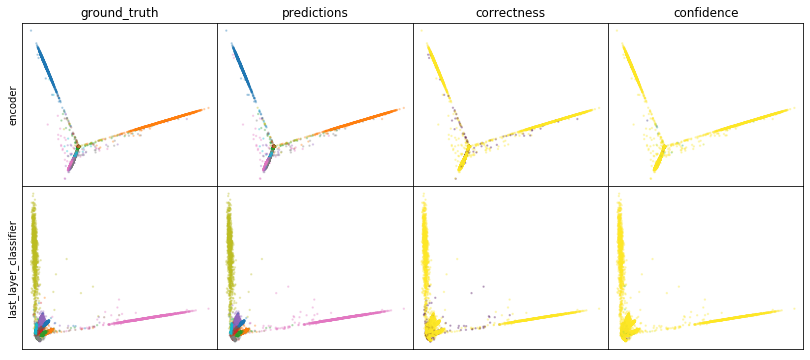

W0808 05:08:30.137397 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:08:30.421812 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:08:30.690787 139911865353984 legend.py:1282] No handles with labels found to put in legend.


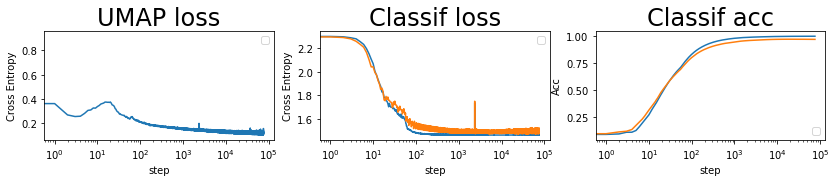

batch: 76000 | train acc: 0.9996 | val acc: 0.9706
leaving epoch because no improvement in 10000 batches


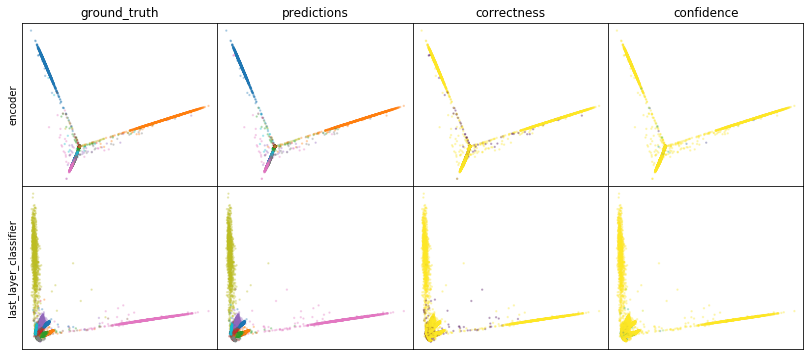

W0808 05:13:30.792852 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:13:31.067407 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:13:31.336829 139911865353984 legend.py:1282] No handles with labels found to put in legend.


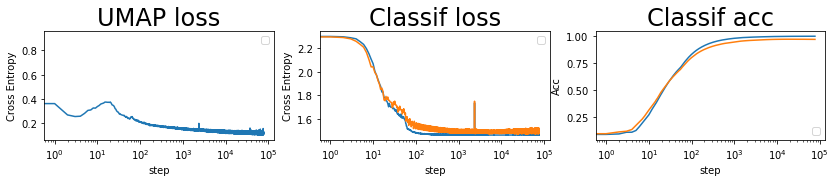

batch: 77000 | train acc: 0.9996 | val acc: 0.9706


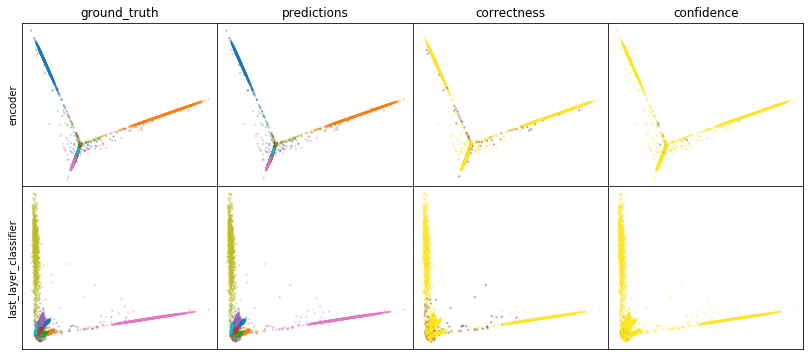

W0808 05:18:31.812043 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:18:32.097411 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:18:32.377289 139911865353984 legend.py:1282] No handles with labels found to put in legend.


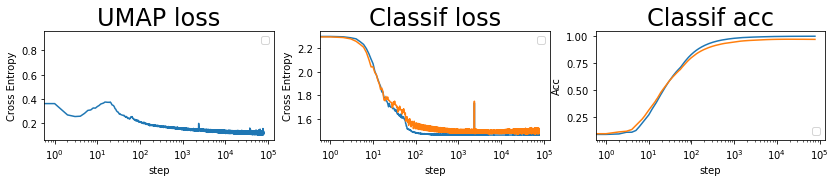

batch: 78000 | train acc: 0.9996 | val acc: 0.9705


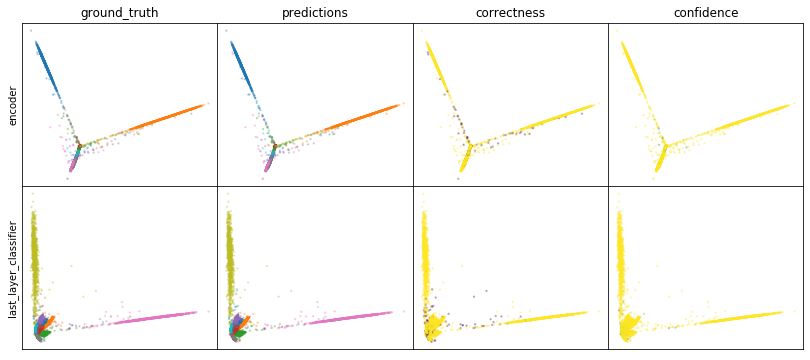

W0808 05:23:31.597928 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:23:31.910371 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:23:32.189369 139911865353984 legend.py:1282] No handles with labels found to put in legend.


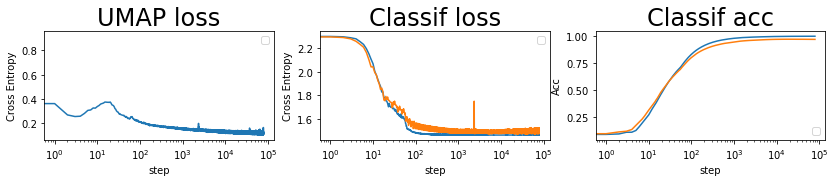

batch: 79000 | train acc: 0.9996 | val acc: 0.9705


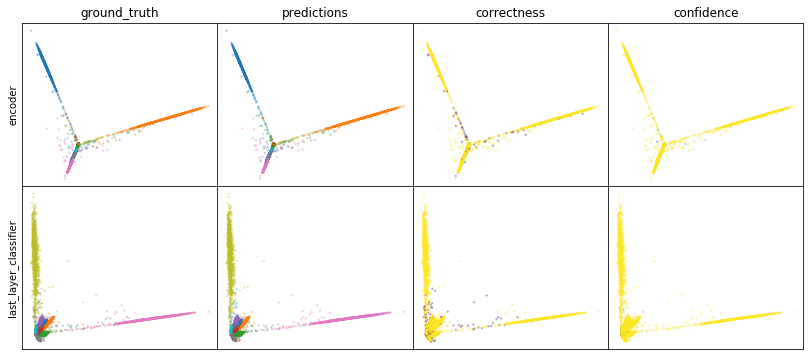

W0808 05:28:33.046366 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:28:33.333112 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:28:33.609833 139911865353984 legend.py:1282] No handles with labels found to put in legend.


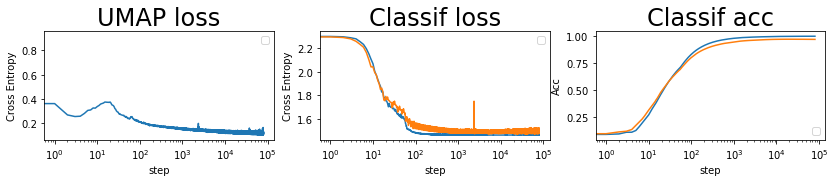

batch: 80000 | train acc: 0.9997 | val acc: 0.9705


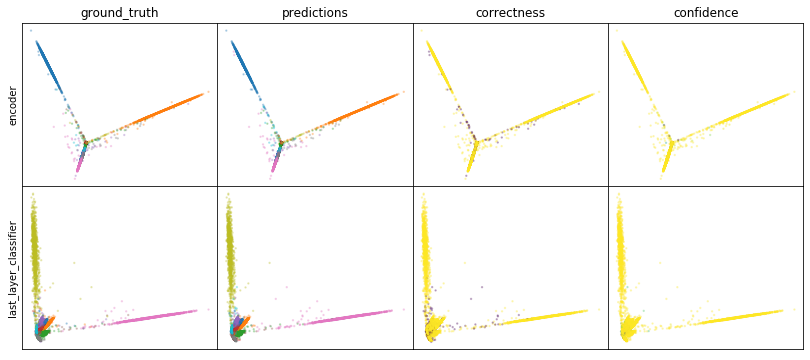

W0808 05:33:35.390395 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:33:35.685218 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:33:35.963749 139911865353984 legend.py:1282] No handles with labels found to put in legend.


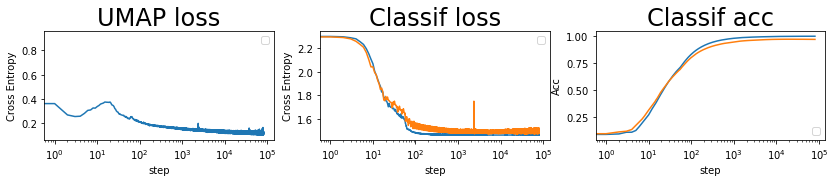

batch: 81000 | train acc: 0.9997 | val acc: 0.9705


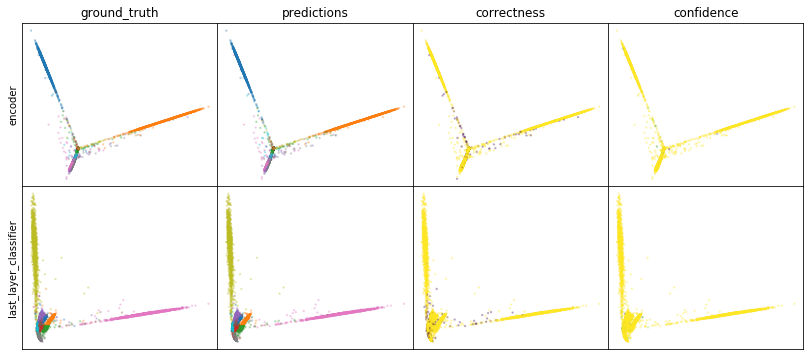

W0808 05:38:39.132004 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:38:39.435418 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:38:39.718317 139911865353984 legend.py:1282] No handles with labels found to put in legend.


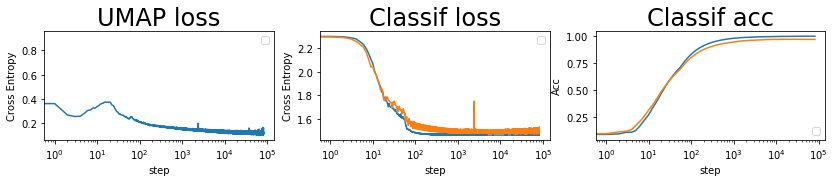

batch: 82000 | train acc: 0.9997 | val acc: 0.9704


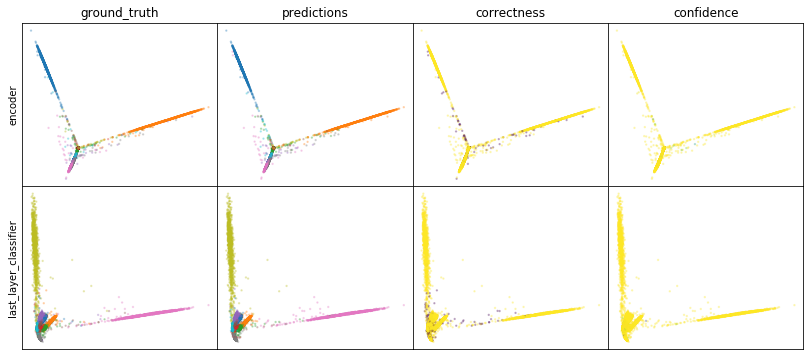

W0808 05:43:43.260145 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:43:43.558657 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:43:43.851247 139911865353984 legend.py:1282] No handles with labels found to put in legend.


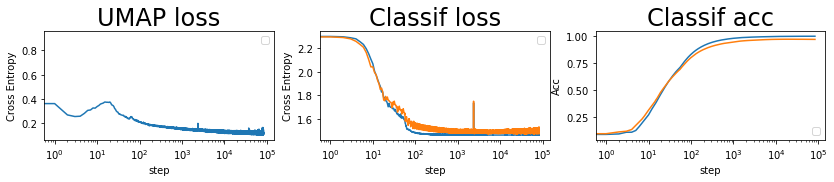

batch: 83000 | train acc: 0.9997 | val acc: 0.9704


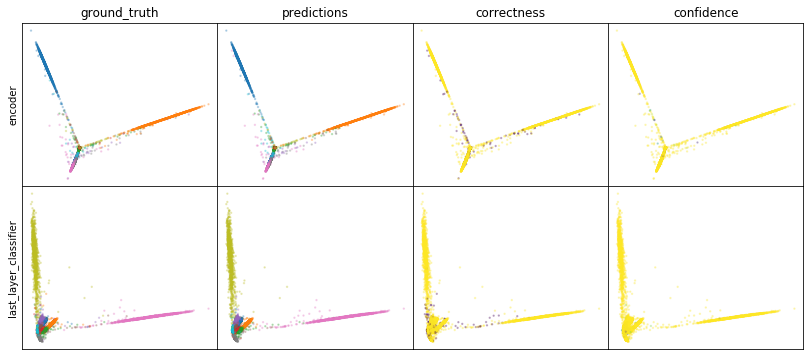

W0808 05:48:46.273905 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:48:46.596122 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:48:46.899101 139911865353984 legend.py:1282] No handles with labels found to put in legend.


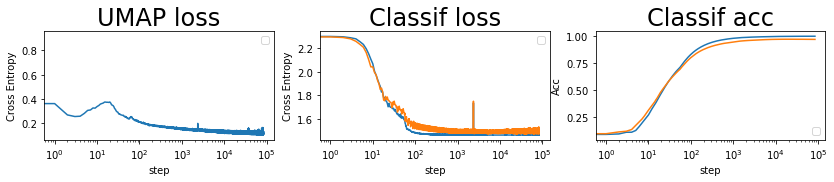

batch: 84000 | train acc: 0.9997 | val acc: 0.9704


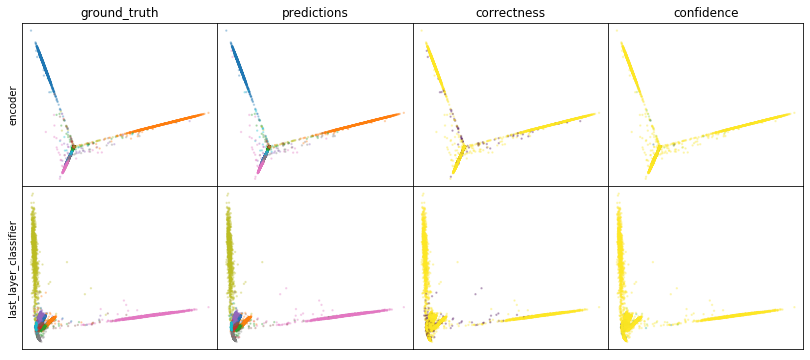

W0808 05:53:51.084558 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:53:51.389231 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:53:51.681673 139911865353984 legend.py:1282] No handles with labels found to put in legend.


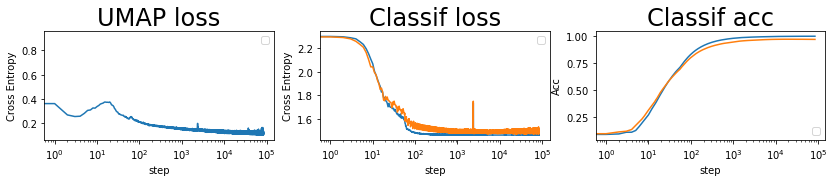

batch: 85000 | train acc: 0.9997 | val acc: 0.9704


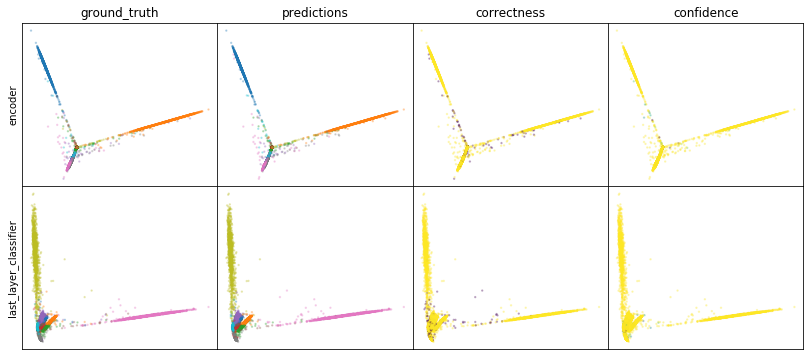

W0808 05:58:56.423003 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:58:56.728555 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 05:58:57.030515 139911865353984 legend.py:1282] No handles with labels found to put in legend.


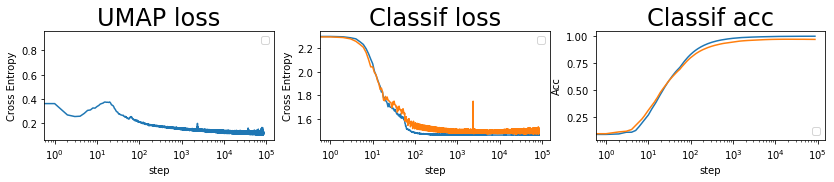

batch: 86000 | train acc: 0.9997 | val acc: 0.9704
leaving epoch because no improvement in 10000 batches


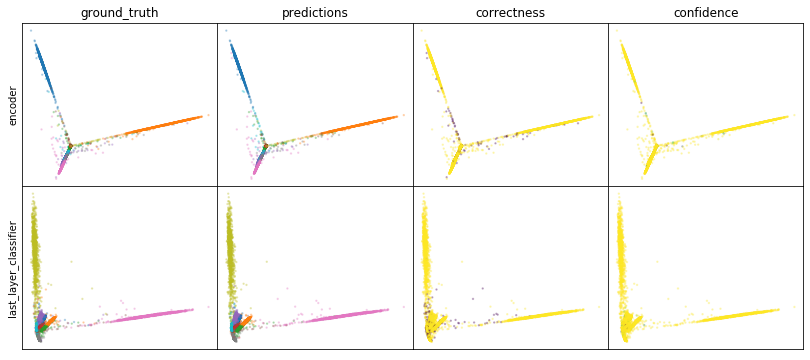

W0808 06:04:01.198622 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:04:01.499294 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:04:01.790680 139911865353984 legend.py:1282] No handles with labels found to put in legend.


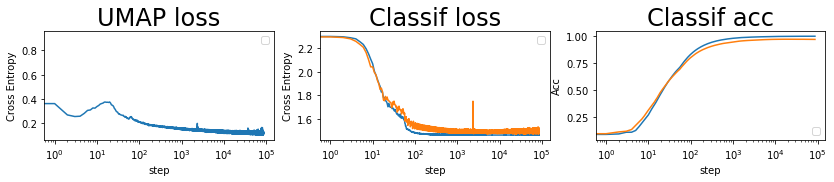

batch: 87000 | train acc: 0.9997 | val acc: 0.9703


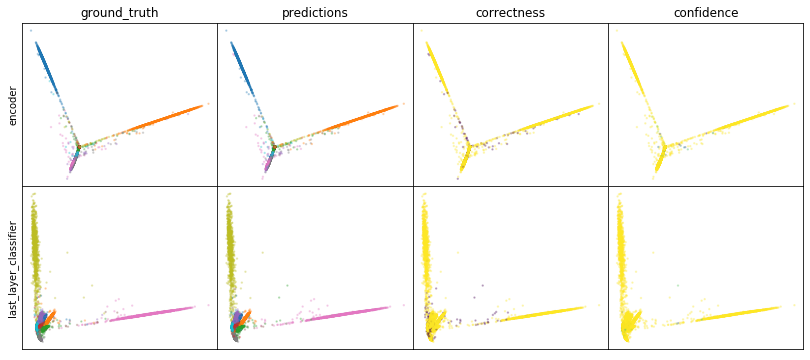

W0808 06:09:07.016026 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:09:07.322832 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:09:07.620256 139911865353984 legend.py:1282] No handles with labels found to put in legend.


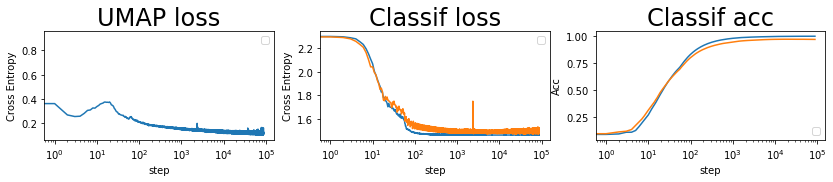

batch: 88000 | train acc: 0.9997 | val acc: 0.9703


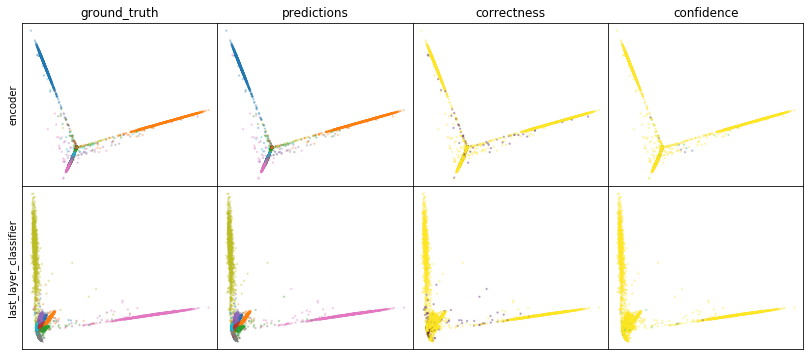

W0808 06:14:14.450807 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:14:14.777481 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:14:15.071348 139911865353984 legend.py:1282] No handles with labels found to put in legend.


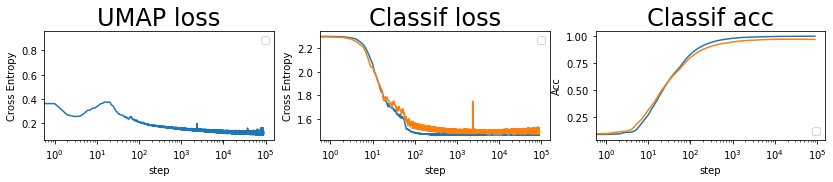

batch: 89000 | train acc: 0.9997 | val acc: 0.9703


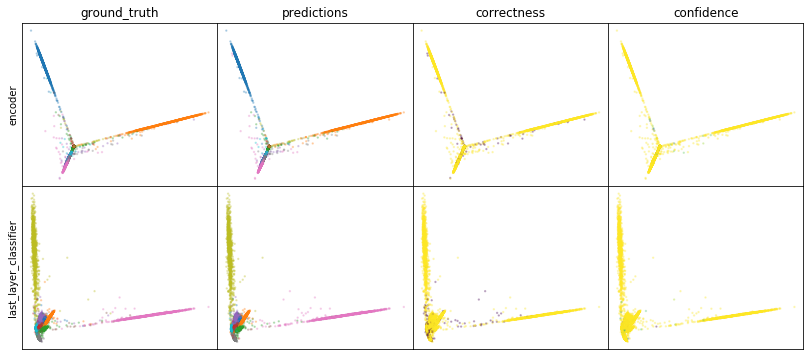

W0808 06:19:19.730249 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:19:20.041872 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:19:20.336769 139911865353984 legend.py:1282] No handles with labels found to put in legend.


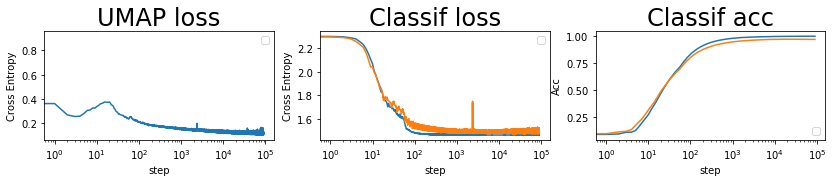

batch: 90000 | train acc: 0.9997 | val acc: 0.9702


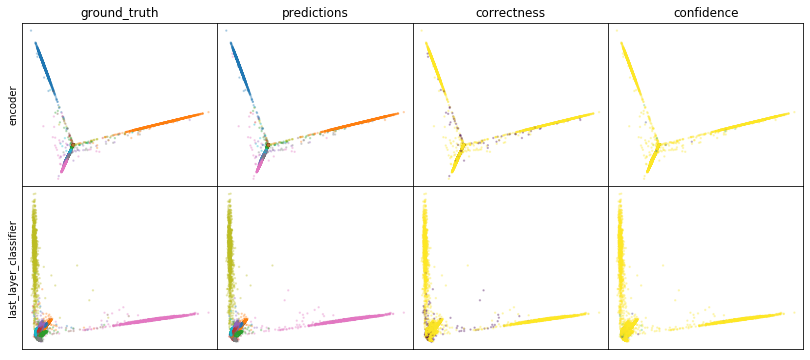

W0808 06:24:26.304594 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:24:26.615716 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:24:26.921623 139911865353984 legend.py:1282] No handles with labels found to put in legend.


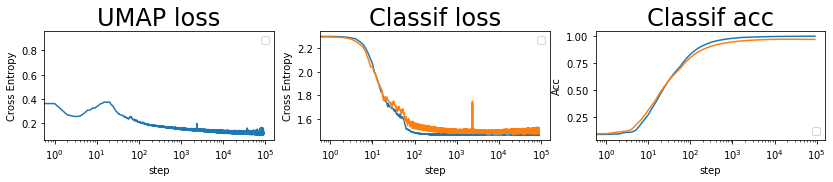

batch: 91000 | train acc: 0.9997 | val acc: 0.9702


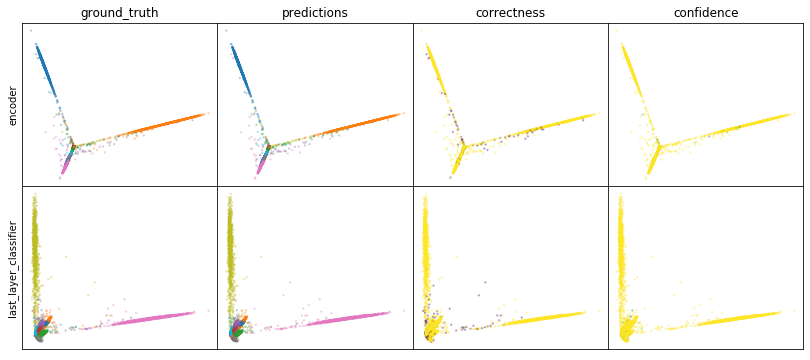

W0808 06:29:34.089916 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:29:34.398109 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:29:34.695394 139911865353984 legend.py:1282] No handles with labels found to put in legend.


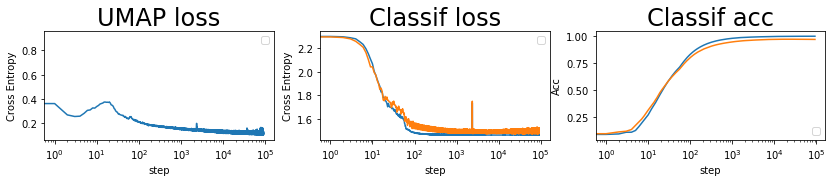

batch: 92000 | train acc: 0.9997 | val acc: 0.9702


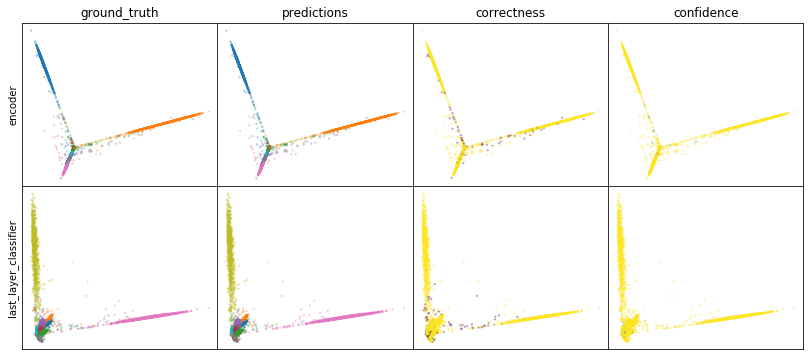

W0808 06:34:42.661035 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:34:42.974775 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:34:43.277335 139911865353984 legend.py:1282] No handles with labels found to put in legend.


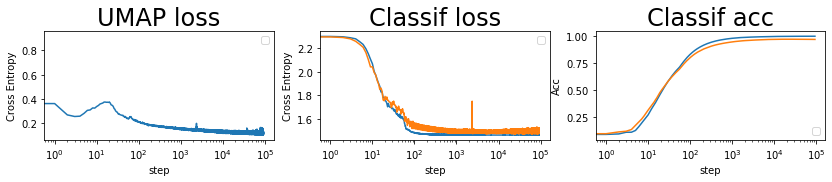

batch: 93000 | train acc: 0.9997 | val acc: 0.9702


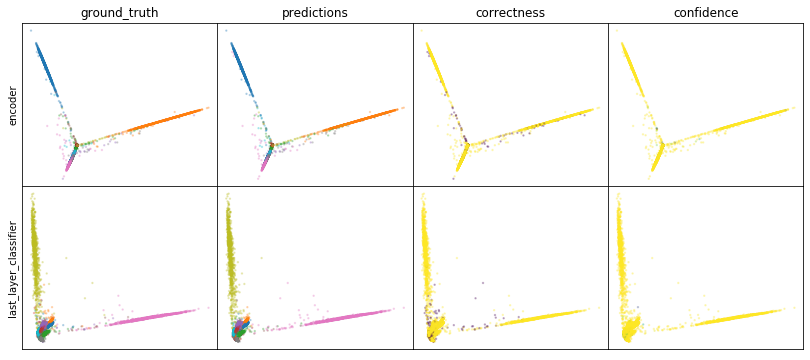

W0808 06:39:50.896597 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:39:51.216624 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:39:51.536134 139911865353984 legend.py:1282] No handles with labels found to put in legend.


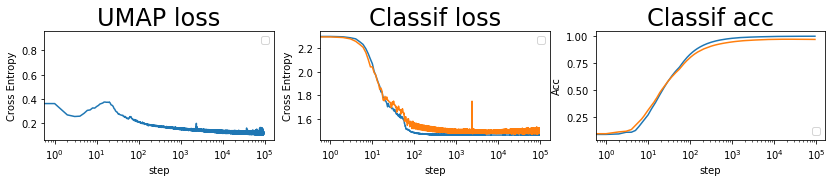

batch: 94000 | train acc: 0.9997 | val acc: 0.9702


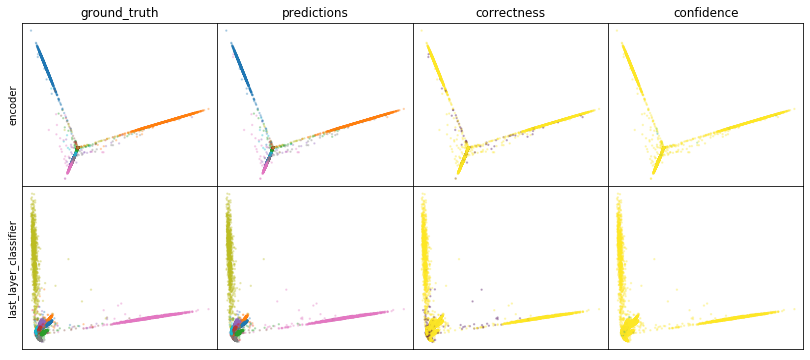

W0808 06:45:00.701911 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:45:01.029611 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:45:01.335153 139911865353984 legend.py:1282] No handles with labels found to put in legend.


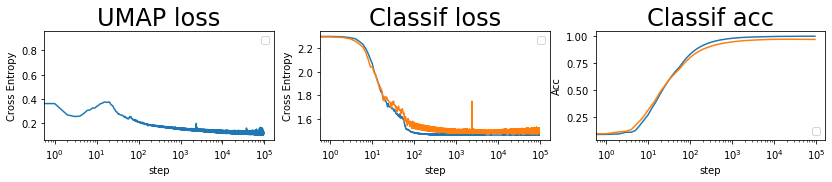

batch: 95000 | train acc: 0.9997 | val acc: 0.9701


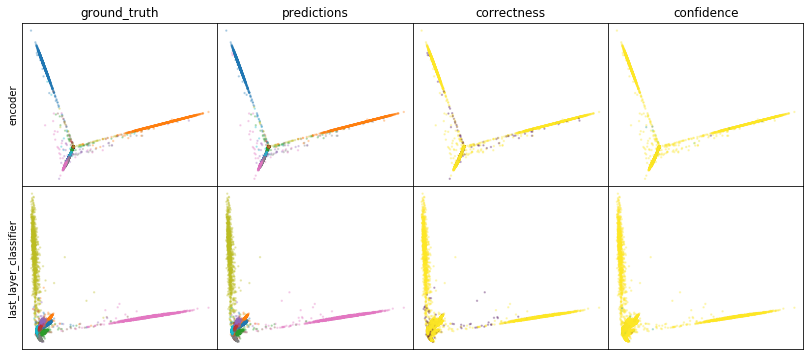

W0808 06:50:10.232445 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:50:10.558250 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:50:10.865591 139911865353984 legend.py:1282] No handles with labels found to put in legend.


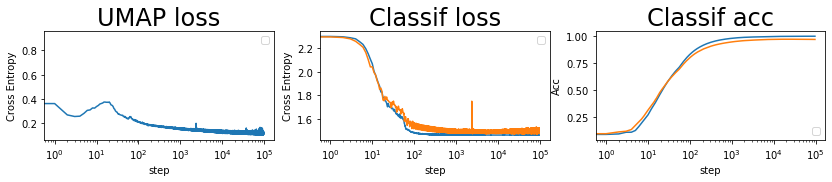

batch: 96000 | train acc: 0.9997 | val acc: 0.9701
leaving epoch because no improvement in 10000 batches


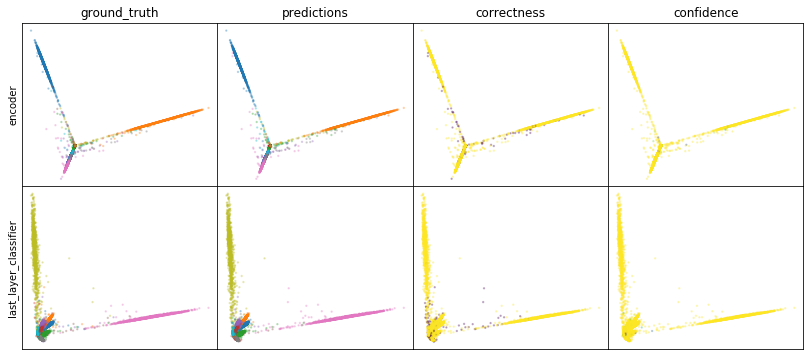

W0808 06:55:20.168430 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:55:20.499333 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 06:55:20.814239 139911865353984 legend.py:1282] No handles with labels found to put in legend.


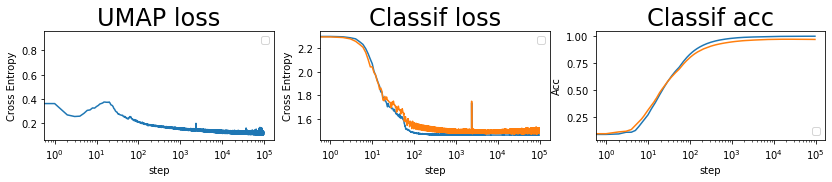

batch: 97000 | train acc: 0.9997 | val acc: 0.9701


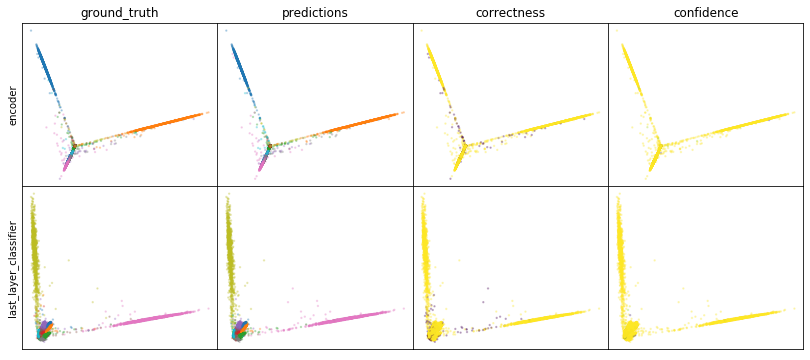

W0808 07:00:30.188284 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:00:30.529784 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:00:30.860049 139911865353984 legend.py:1282] No handles with labels found to put in legend.


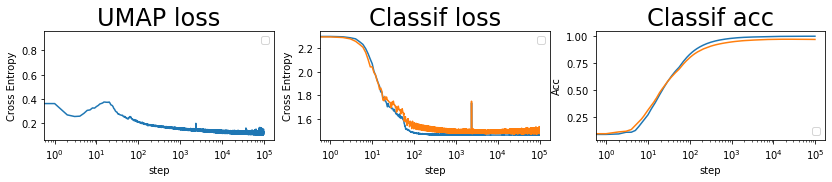

batch: 98000 | train acc: 0.9997 | val acc: 0.9701


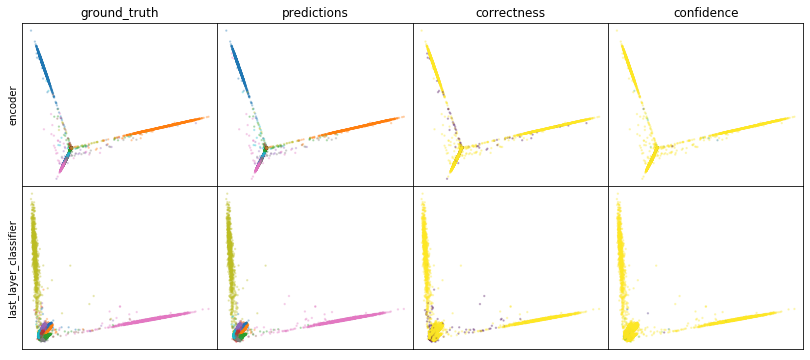

W0808 07:05:42.185267 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:05:42.517020 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:05:42.830869 139911865353984 legend.py:1282] No handles with labels found to put in legend.


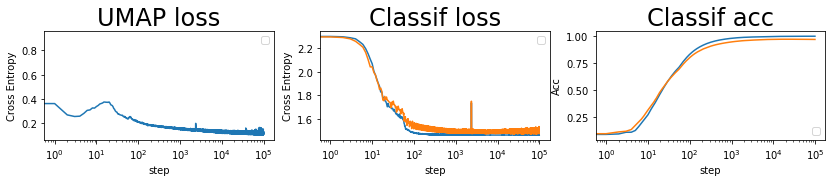

batch: 99000 | train acc: 0.9997 | val acc: 0.9701


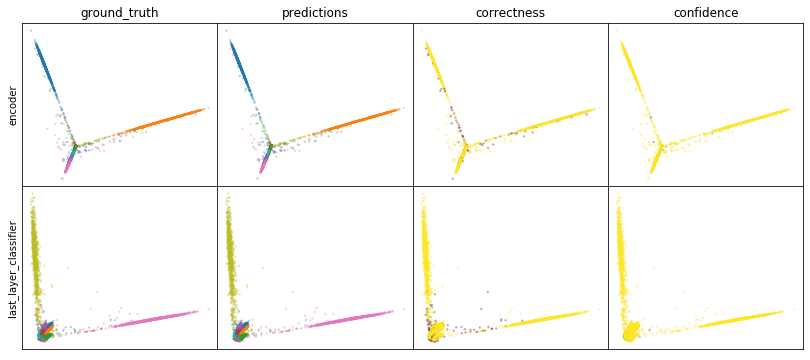

W0808 07:10:52.527884 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:10:52.855482 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:10:53.171385 139911865353984 legend.py:1282] No handles with labels found to put in legend.


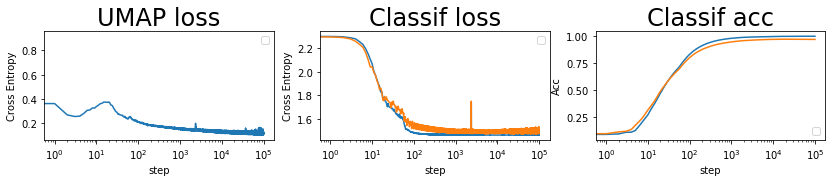

batch: 100000 | train acc: 0.9997 | val acc: 0.97


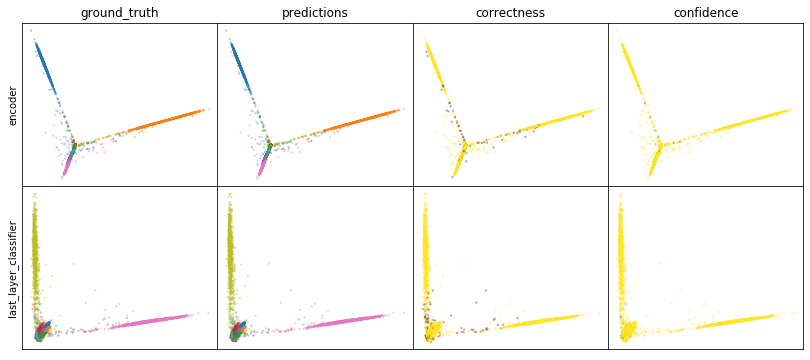

W0808 07:16:04.938528 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:16:05.292927 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:16:05.628026 139911865353984 legend.py:1282] No handles with labels found to put in legend.


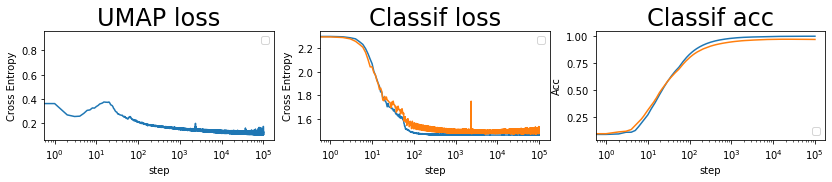

batch: 101000 | train acc: 0.9997 | val acc: 0.97


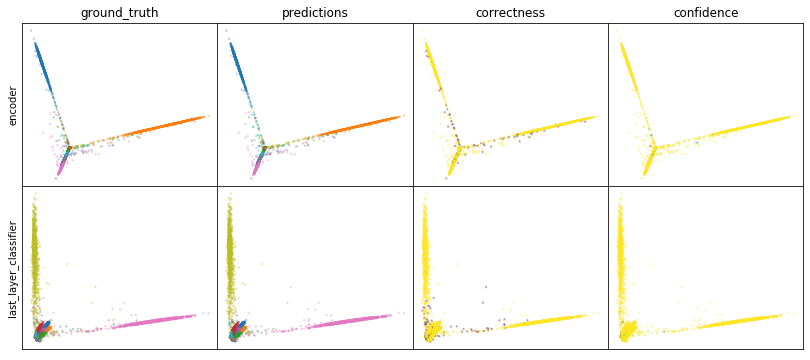

W0808 07:21:16.870623 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:21:17.249257 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:21:17.591557 139911865353984 legend.py:1282] No handles with labels found to put in legend.


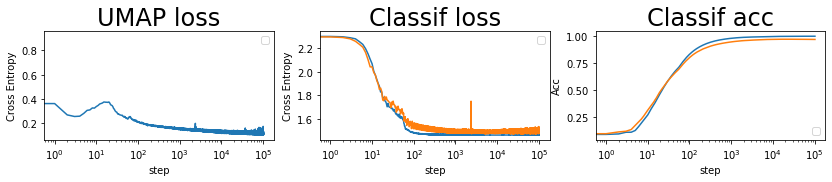

batch: 102000 | train acc: 0.9997 | val acc: 0.97


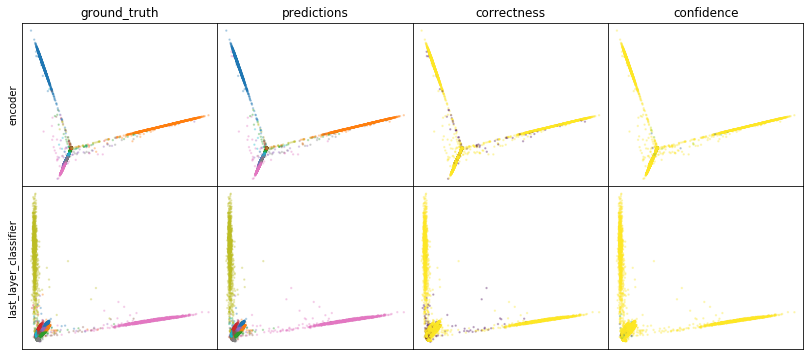

W0808 07:26:29.467373 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:26:29.820121 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:26:30.159528 139911865353984 legend.py:1282] No handles with labels found to put in legend.


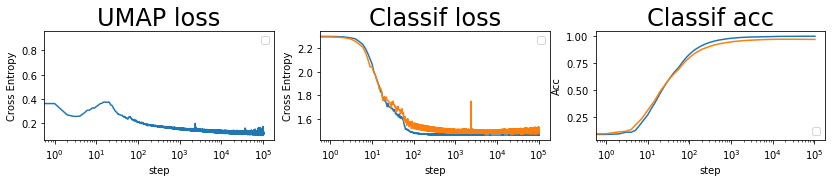

batch: 103000 | train acc: 0.9997 | val acc: 0.97


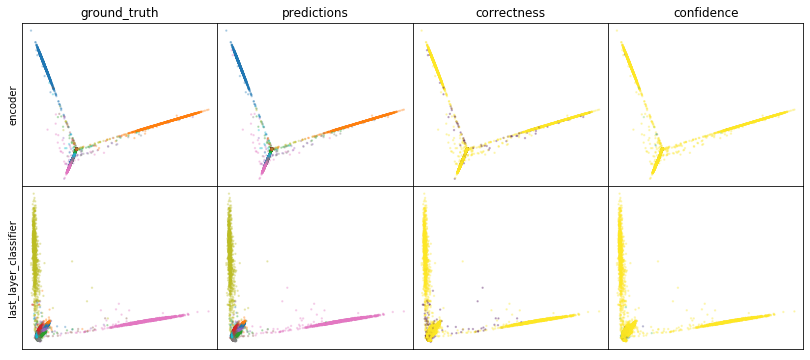

W0808 07:31:43.008937 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:31:43.412133 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:31:43.796184 139911865353984 legend.py:1282] No handles with labels found to put in legend.


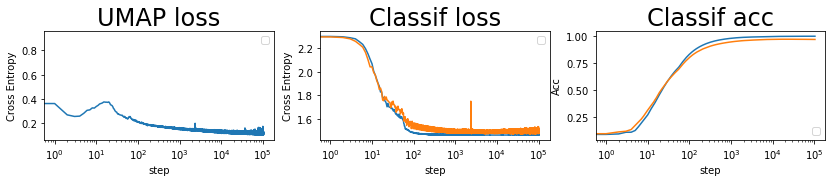

batch: 104000 | train acc: 0.9997 | val acc: 0.97


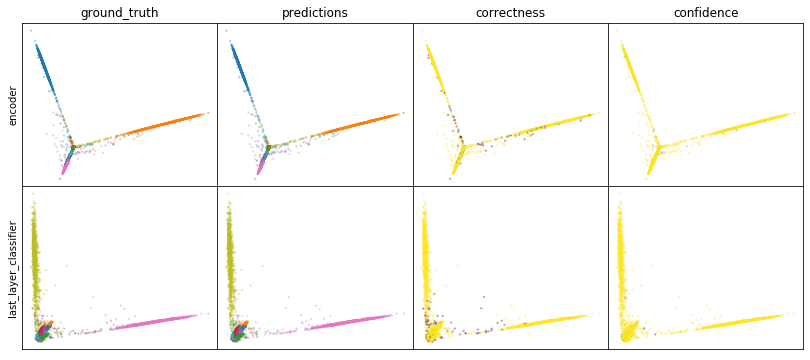

W0808 07:36:57.308361 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:36:57.661741 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:36:58.001504 139911865353984 legend.py:1282] No handles with labels found to put in legend.


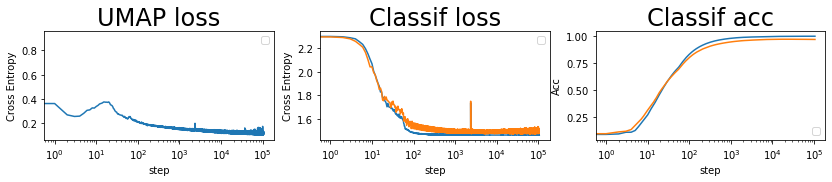

batch: 105000 | train acc: 0.9997 | val acc: 0.97


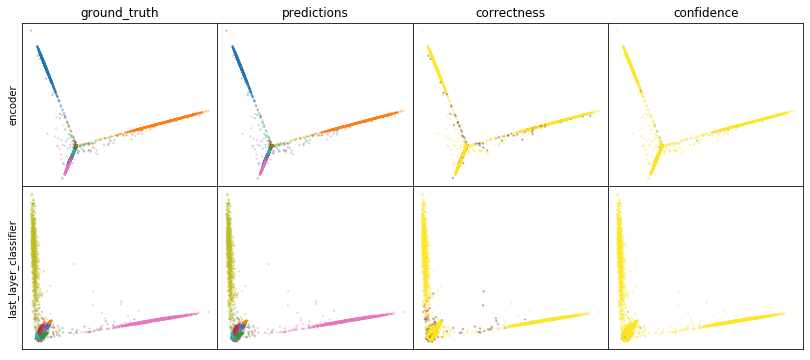

W0808 07:42:11.411941 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:42:11.766280 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:42:12.113951 139911865353984 legend.py:1282] No handles with labels found to put in legend.


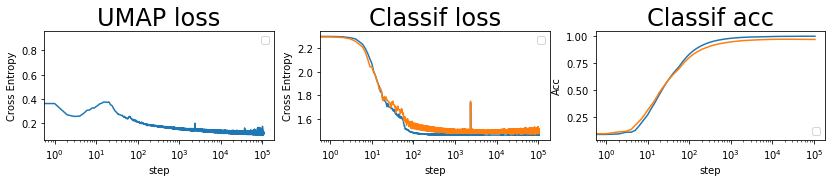

batch: 106000 | train acc: 0.9997 | val acc: 0.9699
leaving epoch because no improvement in 10000 batches


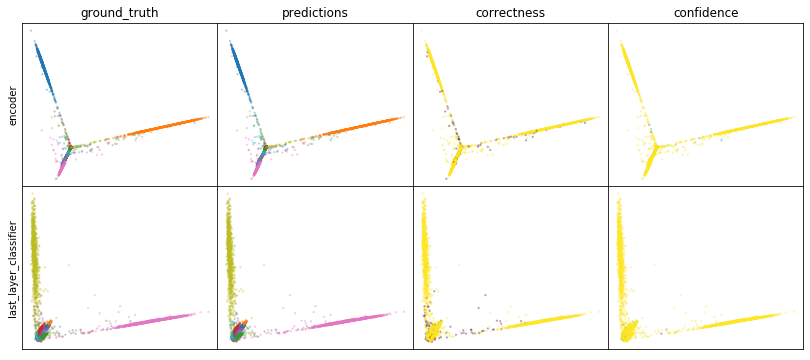

W0808 07:47:28.051145 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:47:28.423218 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:47:28.781641 139911865353984 legend.py:1282] No handles with labels found to put in legend.


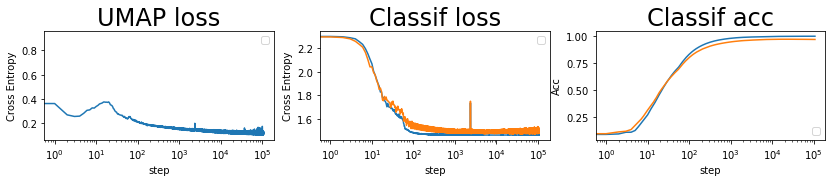

batch: 107000 | train acc: 0.9997 | val acc: 0.9699


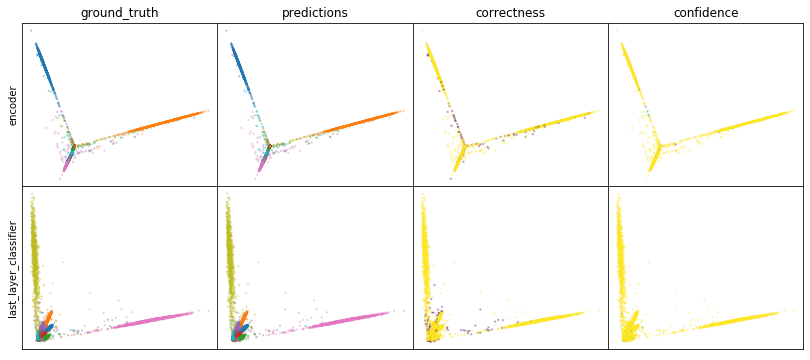

W0808 07:52:43.453007 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:52:43.854545 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:52:44.214328 139911865353984 legend.py:1282] No handles with labels found to put in legend.


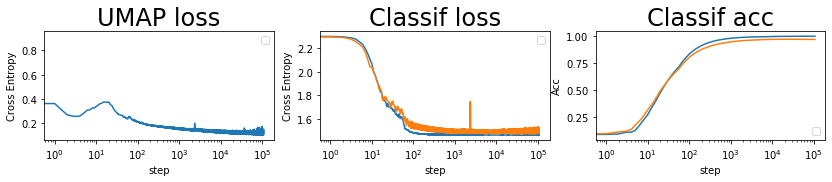

batch: 108000 | train acc: 0.9997 | val acc: 0.9699


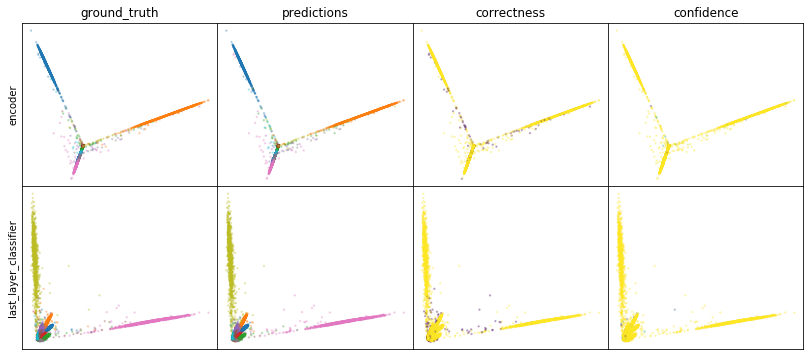

W0808 07:57:59.558659 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:57:59.942499 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 07:58:00.298937 139911865353984 legend.py:1282] No handles with labels found to put in legend.


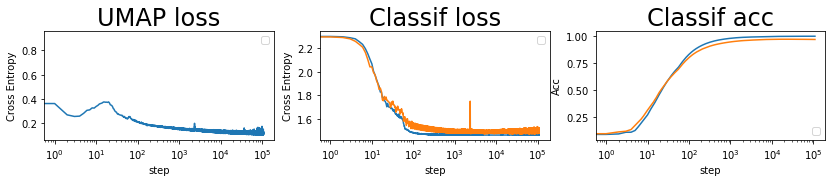

batch: 109000 | train acc: 0.9997 | val acc: 0.9699


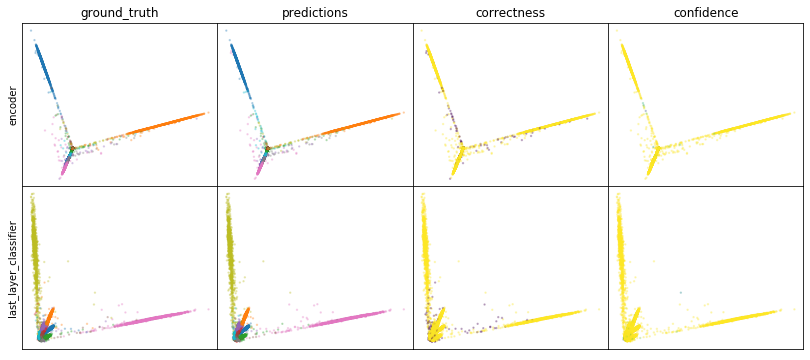

W0808 08:03:17.143935 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:03:17.518841 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:03:17.878280 139911865353984 legend.py:1282] No handles with labels found to put in legend.


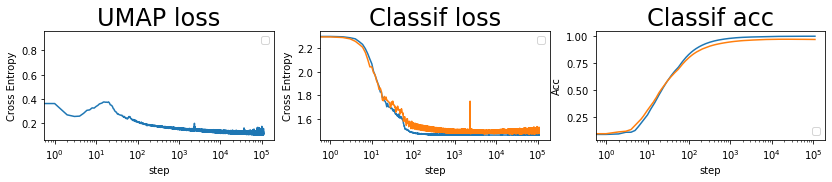

batch: 110000 | train acc: 0.9997 | val acc: 0.9698


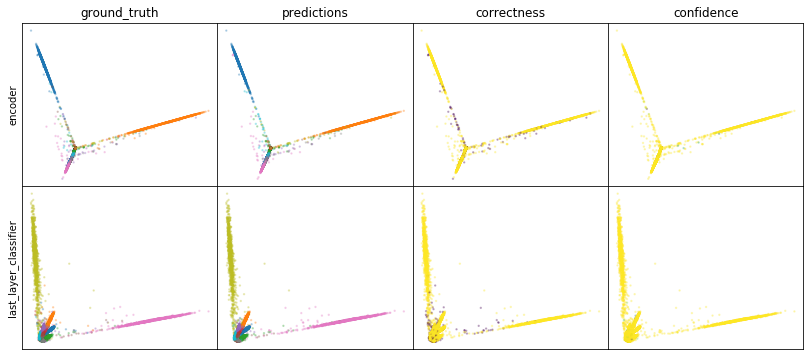

W0808 08:08:33.401892 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:08:33.797037 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:08:34.164493 139911865353984 legend.py:1282] No handles with labels found to put in legend.


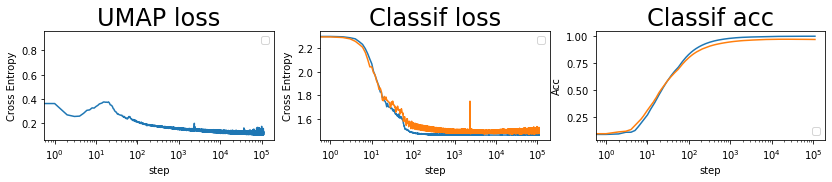

batch: 111000 | train acc: 0.9997 | val acc: 0.9698


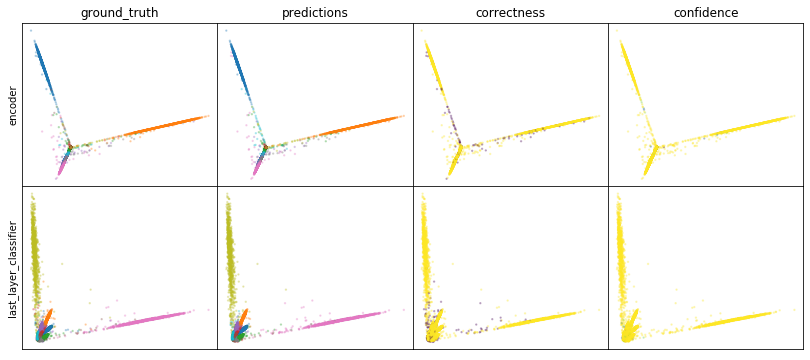

W0808 08:13:50.688463 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:13:51.061198 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:13:51.417446 139911865353984 legend.py:1282] No handles with labels found to put in legend.


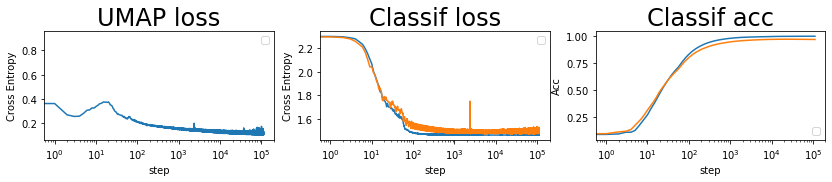

batch: 112000 | train acc: 0.9997 | val acc: 0.9698


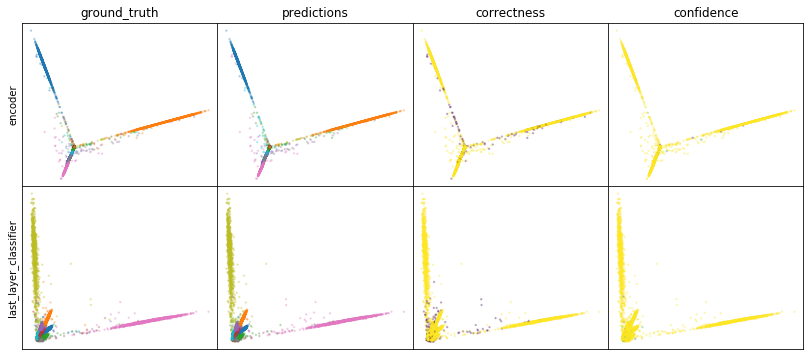

W0808 08:19:09.235962 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:19:09.627034 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:19:10.011288 139911865353984 legend.py:1282] No handles with labels found to put in legend.


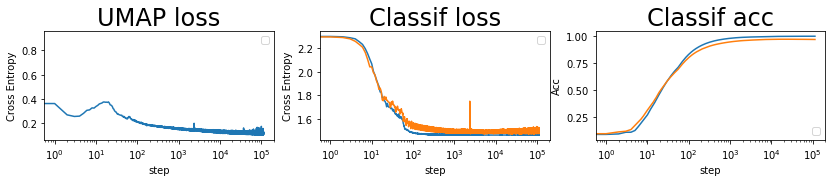

batch: 113000 | train acc: 0.9997 | val acc: 0.9697


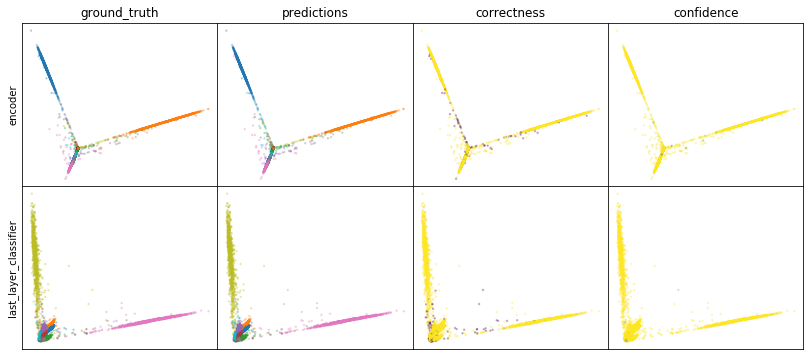

W0808 08:24:27.902545 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:24:28.292251 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:24:28.674821 139911865353984 legend.py:1282] No handles with labels found to put in legend.


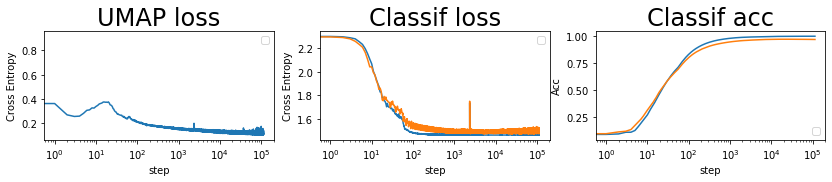

batch: 114000 | train acc: 0.9997 | val acc: 0.9697


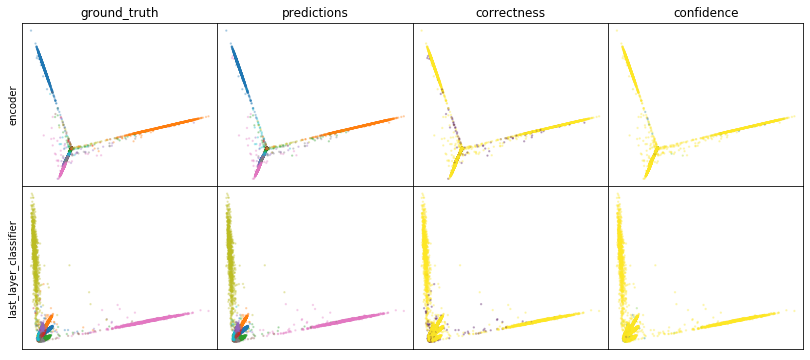

W0808 08:29:46.099362 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:29:46.487154 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:29:46.860545 139911865353984 legend.py:1282] No handles with labels found to put in legend.


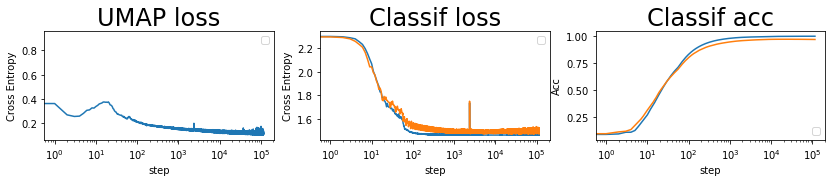

batch: 115000 | train acc: 0.9997 | val acc: 0.9697


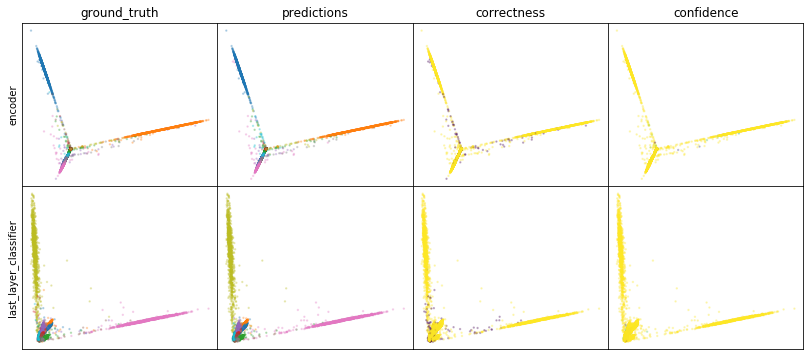

W0808 08:35:05.864513 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:35:06.260999 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:35:06.648760 139911865353984 legend.py:1282] No handles with labels found to put in legend.


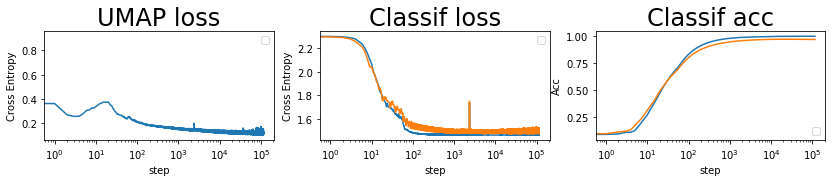

batch: 116000 | train acc: 0.9997 | val acc: 0.9697
leaving epoch because no improvement in 10000 batches


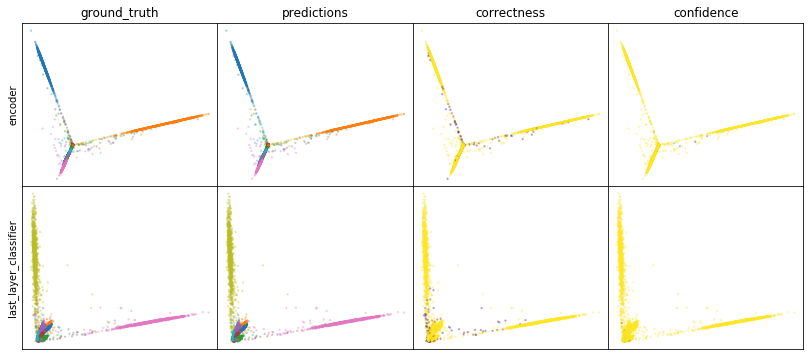

W0808 08:40:26.224013 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:40:26.621477 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:40:26.996014 139911865353984 legend.py:1282] No handles with labels found to put in legend.


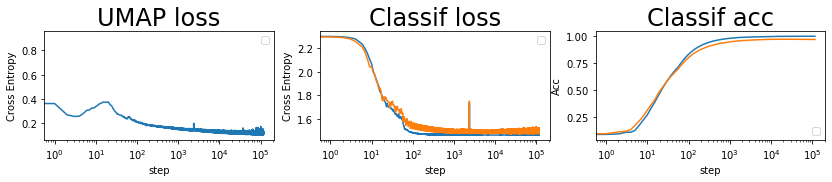

batch: 117000 | train acc: 0.9997 | val acc: 0.9696


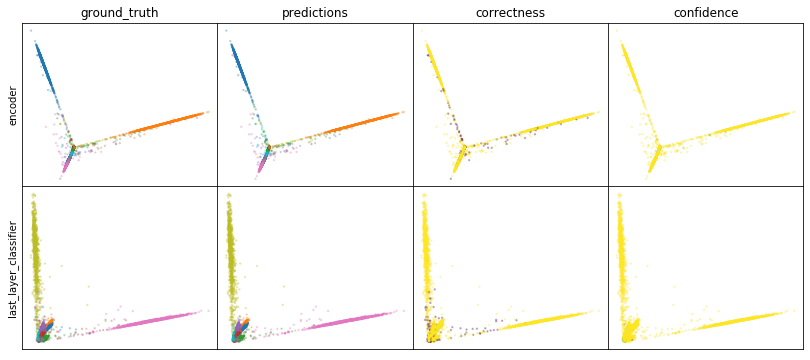

W0808 08:45:46.091122 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:45:46.484629 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:45:46.863173 139911865353984 legend.py:1282] No handles with labels found to put in legend.


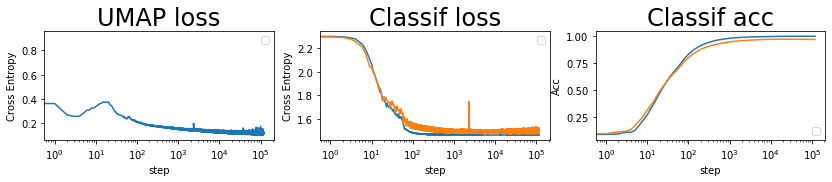

batch: 118000 | train acc: 0.9998 | val acc: 0.9696


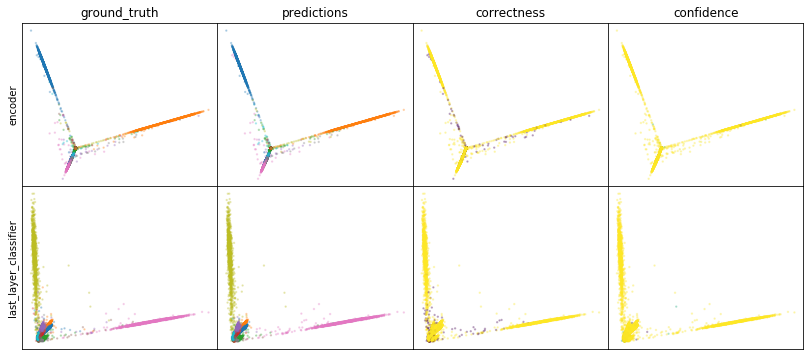

W0808 08:51:07.565965 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:51:07.987074 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:51:08.412788 139911865353984 legend.py:1282] No handles with labels found to put in legend.


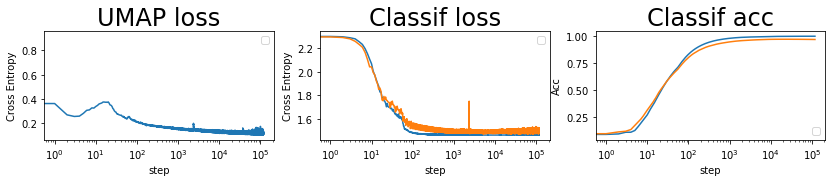

batch: 119000 | train acc: 0.9998 | val acc: 0.9696


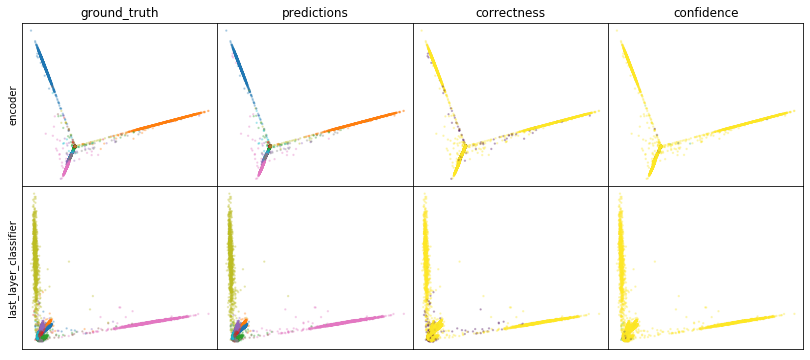

W0808 08:56:28.504612 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:56:28.894963 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 08:56:29.280468 139911865353984 legend.py:1282] No handles with labels found to put in legend.


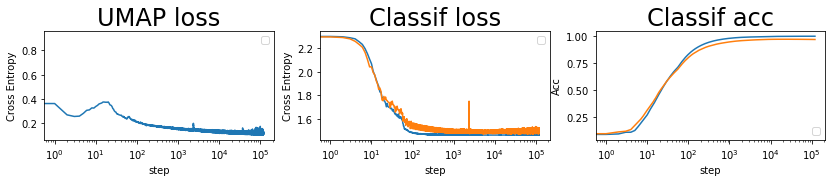

batch: 120000 | train acc: 0.9998 | val acc: 0.9696


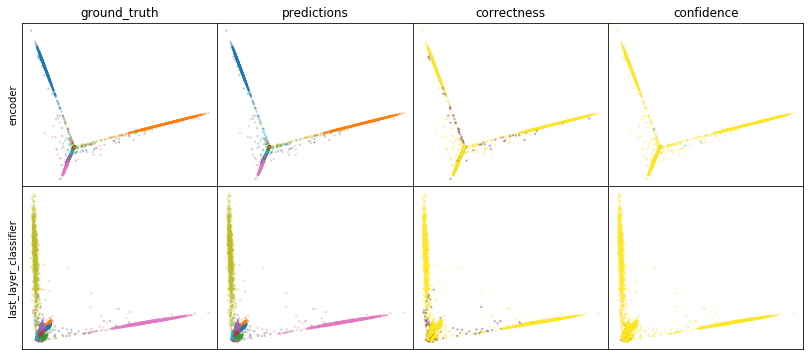

W0808 09:01:51.212644 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 09:01:51.627435 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 09:01:52.029506 139911865353984 legend.py:1282] No handles with labels found to put in legend.


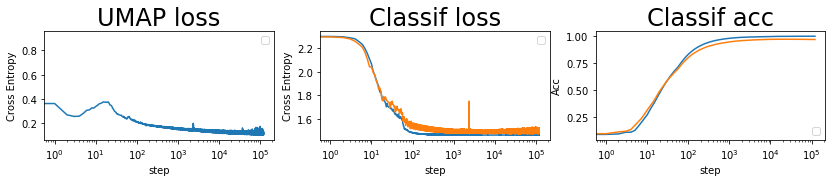

batch: 121000 | train acc: 0.9998 | val acc: 0.9696


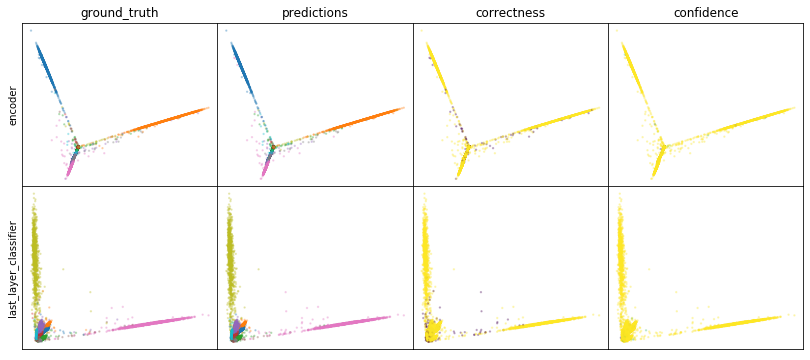

W0808 09:07:12.769450 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 09:07:13.177258 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 09:07:13.562659 139911865353984 legend.py:1282] No handles with labels found to put in legend.


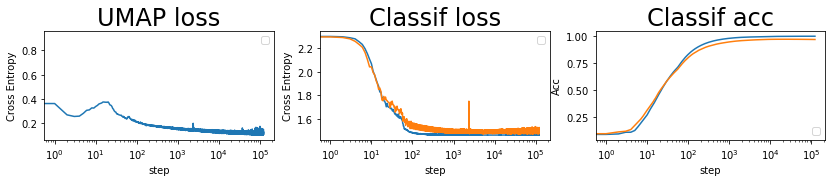

batch: 122000 | train acc: 0.9998 | val acc: 0.9696


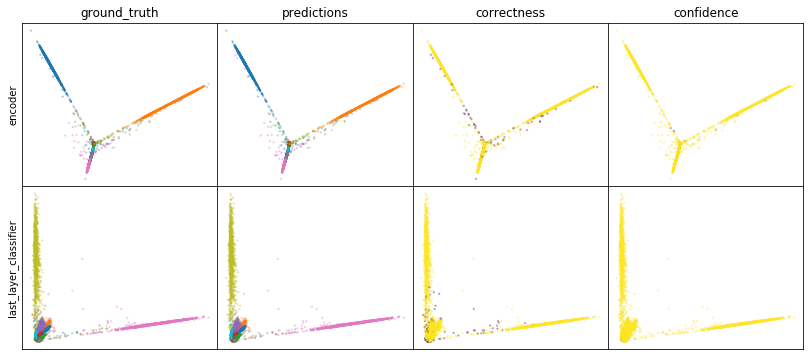

W0808 09:12:34.284785 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 09:12:34.693377 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 09:12:35.091271 139911865353984 legend.py:1282] No handles with labels found to put in legend.


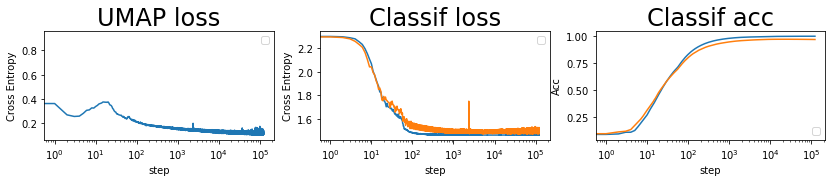

batch: 123000 | train acc: 0.9998 | val acc: 0.9695


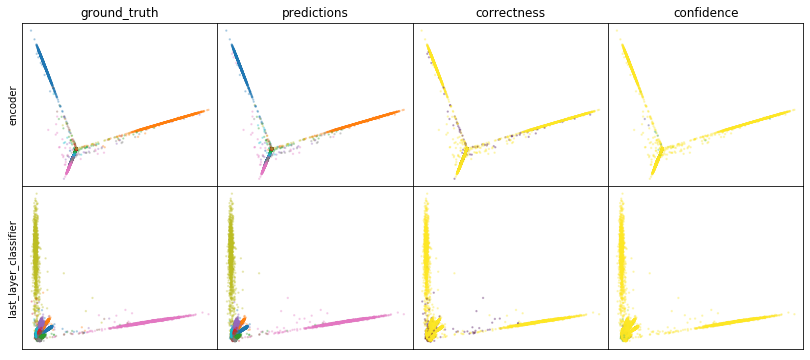

W0808 09:17:57.027436 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 09:17:57.439440 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 09:17:57.833105 139911865353984 legend.py:1282] No handles with labels found to put in legend.


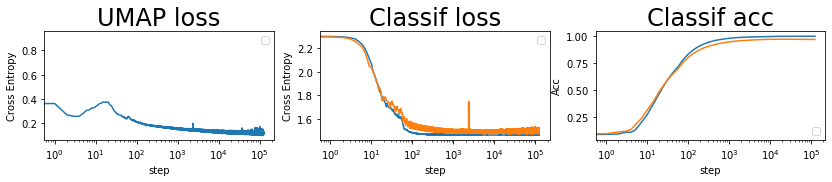

batch: 124000 | train acc: 0.9998 | val acc: 0.9695


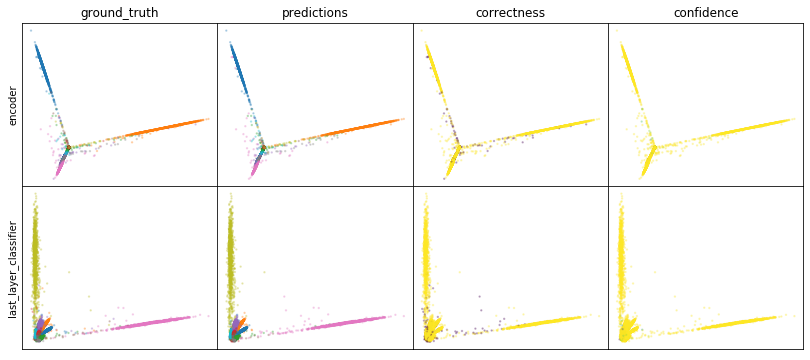

W0808 09:23:19.082604 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 09:23:19.579989 139911865353984 legend.py:1282] No handles with labels found to put in legend.
W0808 09:23:20.037088 139911865353984 legend.py:1282] No handles with labels found to put in legend.


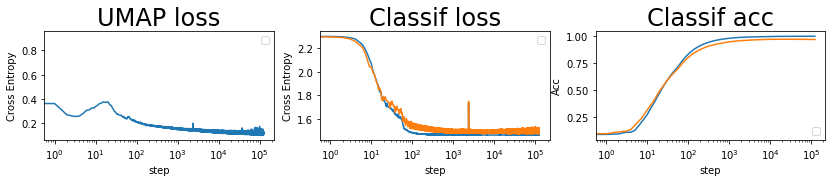

batch: 125000 | train acc: 0.9998 | val acc: 0.9695


KeyboardInterrupt: 

In [35]:
improved_this_epoch = True
for edge_epoch, epoch in tqdm(
    zip(edge_iter, np.arange(N_EPOCHS)), total=N_EPOCHS, desc="epoch"
):

    pbar = tqdm(total=BATCHES_PER_EPOCH, leave=False, desc="loss")

    for (batch_to, batch_from), (X, y), (X_val, y_val) in zip(
        edge_epoch, labeled_iter, data_valid
    ):

        # train
        (
            attraction_loss,
            repellant_loss,
            umap_loss,
            classifier_loss,
            classifier_acc,
        ) = model.train(
            batch_to=X_train[np.array(batch_to)],
            batch_from=X_train[np.array(batch_from)],
            X=X,
            y=y,
            umap_prop=umap_prop,
        )

        # compute validation loss
        val_loss, val_acc = compute_classifier_loss(
            X_val,
            y_val,
            model.encoder,
            model.classifier,
            model.sparse_ce,
            model.class_acc_val,
        )

        pbar.update()
        pbar.set_description("val acc: {}".format(str(round(val_acc.numpy(), 5))))

        # save losses
        model.write_losses(
            tf.convert_to_tensor(batch, dtype=tf.int64),
            classifier_acc,
            classifier_loss,
            umap_loss,
            val_loss,
            val_acc,
        )

        # plot results
        if batch % plot_frequency == 0:
            plot_umap_classif_results(
                model,
                X_valid,
                Y_valid,
                X_train,
                X_labeled,
                Y_labeled,
                batch_size,
                cmap="tab10",
                cmap2="tab10",
            )
            print(
                "batch: {} | train acc: {} | val acc: {}".format(
                    str(batch),
                    str(round(classifier_acc.numpy(), 4)),
                    str(round(val_acc.numpy(), 4)),
                )
            )

        # make any improvement isn't a fluke of small batch size
        if batches_since_last_reload >= reload_tolerance:

            # save if validation accuracy went up
            if val_acc > best_saved_acc + max_save_delta:
                # save weights
                print(
                    "saving weights | batch = {} | acc = {}".format(
                        batch, round(val_acc.numpy() * 100, 3)
                    )
                )
                model.encoder.save_weights((cpt_path / "encoder").as_posix())
                model.classifier.save_weights((cpt_path / "classifier").as_posix())
                best_saved_acc = val_acc.numpy()
                # save batch number
                best_saved_batch = copy.deepcopy(batch)

            # reinitialize if validation accuracy went down
            if val_acc < (best_saved_acc - max_reinitialize_delta):
                # if
                if batches_since_last_reload >= reload_tolerance:
                    batches_since_last_reload = 0
                    lr = model.optimizer.lr.numpy()
                    print(
                        "batch {} | acc = {} | learn rate = {} | reloading weights from batch {} at acc {} | n reloads = {}".format(
                            batch,
                            str(round(val_acc.numpy(), 3)),
                            lr,
                            best_saved_batch,
                            int(best_saved_acc * 100),
                            n_reloads,
                        )
                    )
                    # reload weights
                    model.encoder.load_weights((cpt_path / "encoder").as_posix())
                    model.classifier.load_weights((cpt_path / "classifier").as_posix())

                    # set new learning rate
                    model.optimizer.lr.assign(lr / 2)

                    batch += 1
                    n_reloads += 1

                    # stop if reloaded too many times
                    if n_reloads >= max_reloads:
                        break

            # if there is an imporovement, set new best score
            if val_acc > best_acc + min_delta:
                improved_this_epoch = True
                last_improvement = 0
                best_acc = val_acc
            # if the model has not improved in patience batches, end epoch
            elif last_improvement >= patience:
                last_improvement = 0
                print(
                    "leaving epoch because no improvement in {} batches".format(
                        patience
                    )
                )
                break
            else:
                last_improvement += 1

        # up the ticker
        batch += 1
        batches_since_last_reload += 1
    pbar.close()

In [36]:
test_enc = model_data(X_test, batch_size, model.encoder)
y_pred = model_data(test_enc, batch_size, model.classifier)
test_acc = tf.keras.metrics.sparse_categorical_accuracy(
    Y_test, y_pred
).numpy()
print(np.mean(test_acc))

0.9663


In [37]:
np.save(cpt_path / 'test_acc.npy', test_acc)

In [39]:
pred_model = tf.keras.models.Model(model.classifier.input,[model.classifier.get_layer(name="dense_1").get_output_at(0)])

In [40]:
z_enc = model_data(X_train, 100, encoder)
last_layer_class = model_data(z_enc, batch_size, pred_model)
z_pred = model_data(z_enc, batch_size, classifier)
confidence = np.max(z_pred, axis = 1)
umap_class = UMAP(verbose=True).fit_transform(last_layer_class, Y_masked)
classifications = np.argmax(z_pred, axis=1)
correctness = classifications == Y_train
np.save(cpt_path / 'train_last_layer_class.npy', last_layer_class)
np.save(cpt_path / 'train_z_enc.npy', z_enc)
np.save(cpt_path / 'train_last_layer_class_umap.npy', umap_class)

UMAP(dens_frac=0.0, dens_lambda=0.0, verbose=True)
Construct fuzzy simplicial set
Sat Aug  8 09:25:43 2020 Finding Nearest Neighbors
Sat Aug  8 09:25:43 2020 Building RP forest with 16 trees
Sat Aug  8 09:25:44 2020 parallel NN descent for 16 iterations
	 0  /  16
	 1  /  16
	 2  /  16
Sat Aug  8 09:25:56 2020 Finished Nearest Neighbor Search
Sat Aug  8 09:25:59 2020 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Sat Aug  8 09:27:06 2020 Finished embedding


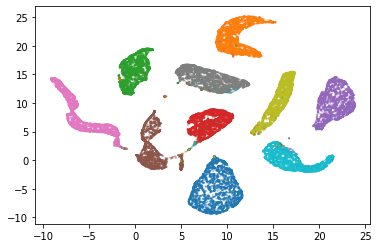

In [42]:
plt.scatter(umap_class[:,0], umap_class[:,1], c =Y_train,  cmap = plt.cm.tab10, s = 1, alpha = 0.25)